In [1]:
import sys
import torch

print("Python exe:", sys.executable)
print("Torch file:", torch.__file__)
print("Torch version:", torch.__version__)
print("CUDA available:", torch.cuda.is_available())
print("Torch CUDA version:", torch.version.cuda)

Python exe: /ssd4/ycheol/conda/envs/myenv/bin/python3.11
Torch file: /ssd4/ycheol/conda/envs/myenv/lib/python3.11/site-packages/torch/__init__.py
Torch version: 2.11.0+cu128
CUDA available: True
Torch CUDA version: 12.8


In [2]:
# ── PHASE 1 — Imports + Local Paths + CSV Loading ──
import os
import gc
import time
import cv2
import timm
import torch
import random
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

import torch.nn as nn
import torch.nn.functional as F

from PIL import Image
from torchvision import transforms
from torch.utils.data import Dataset, DataLoader
from sklearn.model_selection import train_test_split
from sklearn.metrics import cohen_kappa_score

# =========================================================
# REPRODUCIBILITY
# =========================================================
def set_seed(seed=42):
    random.seed(seed)
    np.random.seed(seed)
    torch.manual_seed(seed)
    torch.cuda.manual_seed_all(seed)

set_seed(42)

# =========================================================
# DEVICE
# =========================================================
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print("Using device:", device)

# =========================================================
# DATALOADER SETTINGS
# =========================================================
NUM_WORKERS = 8
APTOS_BATCH = 6
IDRID_BATCH = 2
PIN_MEMORY = True
IMG_SIZE = 380

# =========================================================
# BASE PATH
# =========================================================
#BASE_DIR = r"C:\Users\Sobia Khan\Downloads\LGA_NET"
BASE_DIR = "/ssd4/ycheol/LGA_NET"
# =========================================================
# APTOS PATHS
# =========================================================
APTOS_BASE = os.path.join(BASE_DIR, "aptos2019-blindness-detection")
APTOS_IMG = os.path.join(APTOS_BASE, "train_images")
APTOS_TEST = os.path.join(APTOS_BASE, "test_images")
APTOS_CSV = os.path.join(APTOS_BASE, "train.csv")
APTOS_TEST_CSV = os.path.join(APTOS_BASE, "test.csv")

# =========================================================
# IDRiD PATHS
# =========================================================
IDRID_BASE = os.path.join(BASE_DIR, "IDRID_DATASET")

IDRID_SEG_BASE = os.path.join(IDRID_BASE, "A.%20Segmentation")

IDRID_IMG = os.path.join(
    IDRID_SEG_BASE,
    "A. Segmentation",
    "1. Original Images",
    "a. Training Set"
)

IDRID_MA = os.path.join(
    IDRID_SEG_BASE,
    "A. Segmentation",
    "2. All Segmentation Groundtruths",
    "a. Training Set",
    "1. Microaneurysms"
)

IDRID_HE = os.path.join(
    IDRID_SEG_BASE,
    "A. Segmentation",
    "2. All Segmentation Groundtruths",
    "a. Training Set",
    "2. Haemorrhages"
)

IDRID_EX = os.path.join(
    IDRID_SEG_BASE,
    "A. Segmentation",
    "2. All Segmentation Groundtruths",
    "a. Training Set",
    "3. Hard Exudates"
)

IDRID_SE = os.path.join(
    IDRID_SEG_BASE,
    "A. Segmentation",
    "2. All Segmentation Groundtruths",
    "a. Training Set",
    "4. Soft Exudates"
)

IDRID_GRADE_BASE = os.path.join(IDRID_BASE, "B.%20Disease%20Grading")

IDRID_CSV = os.path.join(
    IDRID_GRADE_BASE,
    "B. Disease Grading",
    "2. Groundtruths",
    "a. IDRiD_Disease Grading_Training Labels.csv"
)

mask_dirs = {
    'MA': IDRID_MA,
    'HE': IDRID_HE,
    'EX': IDRID_EX,
    'SE': IDRID_SE
}

# =========================================================
# LOAD CSVs
# =========================================================
aptos_df = pd.read_csv(APTOS_CSV)
idrid_df = pd.read_csv(IDRID_CSV)

print("Original IDRiD columns:", list(idrid_df.columns))

idrid_df = idrid_df.rename(columns={
    'Image name': 'image_name',
    'Retinopathy grade': 'grade'
})

print("Updated IDRiD columns:", list(idrid_df.columns))

# =========================================================
# OUTPUT FOLDER
# =========================================================
WORK_DIR = os.path.join(BASE_DIR, "outputs_v2")
os.makedirs(WORK_DIR, exist_ok=True)
GRAPH_DIR = os.path.join(BASE_DIR, "outputs_600dpi")
os.makedirs(GRAPH_DIR, exist_ok=True)
print("Saving all 600 DPI graphs to:", GRAPH_DIR)
os.makedirs(WORK_DIR, exist_ok=True)
print("\nAPTOS loaded:", aptos_df.shape)
print("IDRiD loaded:", idrid_df.shape)
print("WORK_DIR:", WORK_DIR)

print("\nAPTOS columns:", list(aptos_df.columns))
print("IDRiD sample:")
print(idrid_df[['image_name', 'grade']].head())

/ssd4/ycheol/conda/envs/myenv/lib/python3.11/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


Using device: cuda
Original IDRiD columns: ['Image name', 'Retinopathy grade', 'Risk of macular edema ', 'Unnamed: 3', 'Unnamed: 4', 'Unnamed: 5', 'Unnamed: 6', 'Unnamed: 7', 'Unnamed: 8', 'Unnamed: 9', 'Unnamed: 10', 'Unnamed: 11']
Updated IDRiD columns: ['image_name', 'grade', 'Risk of macular edema ', 'Unnamed: 3', 'Unnamed: 4', 'Unnamed: 5', 'Unnamed: 6', 'Unnamed: 7', 'Unnamed: 8', 'Unnamed: 9', 'Unnamed: 10', 'Unnamed: 11']
Saving all 600 DPI graphs to: /ssd4/ycheol/LGA_NET/outputs_600dpi

APTOS loaded: (3662, 2)
IDRiD loaded: (413, 12)
WORK_DIR: /ssd4/ycheol/LGA_NET/outputs_v2

APTOS columns: ['id_code', 'diagnosis']
IDRiD sample:
  image_name  grade
0  IDRiD_001      3
1  IDRiD_002      3
2  IDRiD_003      2
3  IDRiD_004      3
4  IDRiD_005      4


In [3]:
# ── PHASE 2 — Preprocessing + Datasets + DataLoaders ──

# =========================================================
# RETINA PREPROCESSING
# =========================================================
def crop_black_border(img_rgb, tol=10):
    gray = cv2.cvtColor(img_rgb, cv2.COLOR_RGB2GRAY)
    mask = gray > tol

    if mask.sum() == 0:
        return img_rgb

    coords = np.argwhere(mask)
    y0, x0 = coords.min(axis=0)
    y1, x1 = coords.max(axis=0) + 1

    return img_rgb[y0:y1, x0:x1]


def circular_retina_mask(img_rgb, radius_scale=0.48):
    h, w, _ = img_rgb.shape
    mask = np.zeros((h, w), dtype=np.uint8)

    center = (w // 2, h // 2)
    radius = int(radius_scale * min(h, w))
    cv2.circle(mask, center, radius, 255, -1)

    masked = cv2.bitwise_and(img_rgb, img_rgb, mask=mask)
    return masked


def enhance_green_channel(img_rgb):
    img = img_rgb.copy()
    green = img[:, :, 1]
    clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8, 8))
    img[:, :, 1] = clahe.apply(green)
    return img



def normalize_channels(img_rgb):
    out = np.zeros_like(img_rgb)
    for ch in range(3):
        out[:, :, ch] = cv2.normalize(
            img_rgb[:, :, ch],
            None,           
            alpha=0,
            beta=255,
            norm_type=cv2.NORM_MINMAX
        )
    return out


# ─────────────────────────────────────────────────────────
# ORIGINAL preprocess_retinal — unchanged.
# Used for: APTOS training, APTOS validation, IDRiD.
# ─────────────────────────────────────────────────────────
def preprocess_retinal(path, size=380, debug=False):
    img_bgr = cv2.imread(path)
    if img_bgr is None:
        raise FileNotFoundError(f"Image not found or unreadable: {path}")

    img = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2RGB)
    img = crop_black_border(img, tol=10)
    img = cv2.resize(img, (size, size))
    img = circular_retina_mask(img, radius_scale=0.48)
    img = enhance_green_channel(img)

    img = img.astype(np.float32) / 255.0
    return img


# ─────────────────────────────────────────────────────────
def preprocess_retinal_external(path, size=380):
  
    img_bgr = cv2.imread(path)
    if img_bgr is None:
        raise FileNotFoundError(f"Image not found or unreadable: {path}")

    img = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2RGB)
    img = crop_black_border(img, tol=10)
    img = cv2.resize(img, (size, size))
    img = circular_retina_mask(img, radius_scale=0.48)
    img = enhance_green_channel(img)       # CLAHE on green channel

    img = normalize_channels(img)          # ← NEW: per-channel stretch

    img = img.astype(np.float32) / 255.0
    return img


# =========================================================
# TRANSFORMS  
# =========================================================
train_transform = transforms.Compose([
    transforms.RandomHorizontalFlip(),
    transforms.RandomVerticalFlip(),
    transforms.RandomRotation(20),
    transforms.RandomResizedCrop(IMG_SIZE, scale=(0.90, 1.00)),
    transforms.ColorJitter(brightness=0.2, contrast=0.2, saturation=0.1),
    transforms.ToTensor(),
    transforms.Normalize([0.485, 0.456, 0.406],
                         [0.229, 0.224, 0.225])
])

val_transform = transforms.Compose([
    transforms.ToTensor(),
    transforms.Normalize([0.485, 0.456, 0.406],
                         [0.229, 0.224, 0.225])
])


# =========================================================
# APTOS DATASET  
# =========================================================
class APTOSDataset(Dataset):
    def __init__(self, df, img_dir, transform=None):
        self.df = df.reset_index(drop=True)
        self.img_dir = img_dir
        self.transform = transform

    def __len__(self):
        return len(self.df)

    def __getitem__(self, idx):
        row = self.df.iloc[idx]
        img_path = os.path.join(self.img_dir, f'{row["id_code"]}.png')

        img = preprocess_retinal(img_path, size=IMG_SIZE)   # original fn
        img = Image.fromarray((img * 255).astype(np.uint8))

        if self.transform:
            img = self.transform(img)

        return img, int(row['diagnosis'])


# =========================================================
# IDRID DATASET  
# =========================================================
class IDRiDDataset(Dataset):
    def __init__(self, df, img_dir, mask_dirs, transform=None):
        self.df = df.reset_index(drop=True)
        self.img_dir = img_dir
        self.mask_dirs = mask_dirs
        self.transform = transform

    def __len__(self):
        return len(self.df)

    def __getitem__(self, idx):
        row = self.df.iloc[idx]
        name = row['image_name_norm']

        img_path = os.path.join(self.img_dir, f"{name}.jpg")
        if not os.path.exists(img_path):
            raise FileNotFoundError(f"Missing image: {img_path}")

        img = preprocess_retinal(img_path, size=IMG_SIZE)   # original fn
        img = Image.fromarray((img * 255).astype(np.uint8))

        if self.transform:
            img = self.transform(img)

        mask = self._load_mask(name, size=IMG_SIZE)
        mask = torch.tensor(mask, dtype=torch.float32).unsqueeze(0)

        return img, mask, int(row['grade'])

    def _load_mask(self, name, size=380):
        combined = np.zeros((size, size), dtype=np.float32)

        for key, suffix in {'MA': '_MA', 'HE': '_HE', 'EX': '_EX', 'SE': '_SE'}.items():
            path = os.path.join(self.mask_dirs[key], f"{name}{suffix}.tif")
            if os.path.exists(path):
                m = cv2.imread(path, cv2.IMREAD_GRAYSCALE)
                if m is not None:
                    m = cv2.resize(m, (size, size))
                    combined = np.maximum(combined, (m > 0).astype(np.float32))

        return combined



class Messidor2Dataset(Dataset):
    """
    External validation dataset for Messidor-2.
    Uses preprocess_retinal_external() which adds per-channel
    normalisation after CLAHE to reduce camera domain shift.
    """
    def __init__(self, df, img_dir, transform=None):
        self.df        = df.reset_index(drop=True)
        self.img_dir   = img_dir
        self.transform = transform

    def __len__(self):
        return len(self.df)

    def __getitem__(self, idx):
        row      = self.df.iloc[idx]
        filename = str(row['id_code'])

        path = os.path.join(self.img_dir, filename)

        # fallback: try without / with extension
        if not os.path.exists(path):
            bare = os.path.splitext(filename)[0]
            for ext in ['.png', '.jpg', '.jpeg', '.tif', '.tiff']:
                alt = os.path.join(self.img_dir, bare + ext)
                if os.path.exists(alt):
                    path = alt
                    break
            else:
                raise FileNotFoundError(
                    f"Image not found: {path}\n"
                    f"Check MESSIDOR_IMG path: {self.img_dir}"
                )

        # ← uses the new external preprocessing function
        img = preprocess_retinal(path, size=IMG_SIZE)
        img = Image.fromarray((img * 255).astype(np.uint8))

        if self.transform:
            img = self.transform(img)

        return img, int(row['diagnosis'])


# =========================================================
# CLEAN IDRID DATAFRAME  
# =========================================================
def extract_num(x):
    return int(str(x).split('_')[-1])

idrid_df_clean = idrid_df.copy()
idrid_df_clean['image_id_num'] = idrid_df_clean['image_name'].apply(extract_num)

file_map = {}
for f in os.listdir(IDRID_IMG):
    stem, ext = os.path.splitext(f)
    if ext.lower() == '.jpg':
        try:
            num = extract_num(stem)
            file_map[num] = stem
        except:
            pass

idrid_df_clean = idrid_df_clean[idrid_df_clean['image_id_num'].isin(file_map.keys())].copy()
idrid_df_clean['image_name_norm'] = idrid_df_clean['image_id_num'].map(file_map)
idrid_df_clean = idrid_df_clean.reset_index(drop=True)

print(f"Clean IDRiD usable samples: {len(idrid_df_clean)}")
print(idrid_df_clean[['image_name', 'image_name_norm', 'grade']].head())
print("\nIDRiD grade distribution:")
print(idrid_df_clean['grade'].value_counts().sort_index())


# =========================================================
# SPLITS  
# =========================================================
train_aptos, val_aptos = train_test_split(
    aptos_df,
    test_size=0.2,
    stratify=aptos_df['diagnosis'],
    random_state=42
)

# Check whether stratified split is possible for IDRiD
idrid_class_counts = idrid_df_clean['grade'].value_counts().sort_index()
print("\nIDRiD class counts:")
print(idrid_class_counts)

if idrid_class_counts.min() >= 2:
    print("\nUsing stratified split for IDRiD.")
    train_idrid, val_idrid = train_test_split(
        idrid_df_clean,
        test_size=0.2,
        stratify=idrid_df_clean['grade'],
        random_state=42
    )
else:
    print("\nWarning: At least one IDRiD class has fewer than 2 samples.")
    print("Using non-stratified split for IDRiD instead.")
    train_idrid, val_idrid = train_test_split(
        idrid_df_clean,
        test_size=0.2,
        random_state=42,
        shuffle=True
    )

print(f"\nIDRiD train samples: {len(train_idrid)}")
print(f"IDRiD val samples:   {len(val_idrid)}")

print("\nTrain grade distribution:")
print(train_idrid['grade'].value_counts().sort_index())

print("\nVal grade distribution:")
print(val_idrid['grade'].value_counts().sort_index())


# =========================================================
# DATASETS  
# =========================================================
aptos_train_ds = APTOSDataset(train_aptos, APTOS_IMG, train_transform)
aptos_val_ds   = APTOSDataset(val_aptos,   APTOS_IMG, val_transform)

idrid_train_ds = IDRiDDataset(train_idrid, IDRID_IMG, mask_dirs, train_transform)
idrid_val_ds   = IDRiDDataset(val_idrid,   IDRID_IMG, mask_dirs, val_transform)


# =========================================================
# DATALOADERS  
# =========================================================
aptos_train_loader = DataLoader(
    aptos_train_ds,
    batch_size=APTOS_BATCH,
    shuffle=True,
    num_workers=NUM_WORKERS,
    pin_memory=PIN_MEMORY
)

aptos_val_loader = DataLoader(
    aptos_val_ds,
    batch_size=APTOS_BATCH,
    shuffle=False,
    num_workers=NUM_WORKERS,
    pin_memory=PIN_MEMORY
)

idrid_train_loader = DataLoader(
    idrid_train_ds,
    batch_size=IDRID_BATCH,
    shuffle=True,
    num_workers=NUM_WORKERS,
    pin_memory=PIN_MEMORY
)

idrid_val_loader = DataLoader(
    idrid_val_ds,
    batch_size=IDRID_BATCH,
    shuffle=False,
    num_workers=NUM_WORKERS,
    pin_memory=PIN_MEMORY
)

# =========================================================
# VERIFY
# =========================================================
imgs, labels = next(iter(aptos_train_loader))
print(f"\nAPTOS batch: {imgs.shape}  labels: {labels.shape}")

imgs, masks, labels = next(iter(idrid_train_loader))
print(f"IDRiD TRAIN batch: {imgs.shape}  masks: {masks.shape}  labels: {labels.shape}")

imgs, masks, labels = next(iter(idrid_val_loader))
print(f"IDRiD VAL batch:   {imgs.shape}  masks: {masks.shape}  labels: {labels.shape}")

Clean IDRiD usable samples: 54
  image_name image_name_norm  grade
0  IDRiD_001        IDRiD_01      3
1  IDRiD_002        IDRiD_02      3
2  IDRiD_003        IDRiD_03      2
3  IDRiD_004        IDRiD_04      3
4  IDRiD_005        IDRiD_05      4

IDRiD grade distribution:
grade
1     1
2    18
3    16
4    19
Name: count, dtype: int64

IDRiD class counts:
grade
1     1
2    18
3    16
4    19
Name: count, dtype: int64

Using non-stratified split for IDRiD instead.

IDRiD train samples: 43
IDRiD val samples:   11

Train grade distribution:
grade
1     1
2    14
3    13
4    15
Name: count, dtype: int64

Val grade distribution:
grade
2    4
3    3
4    4
Name: count, dtype: int64

APTOS batch: torch.Size([6, 3, 380, 380])  labels: torch.Size([6])
IDRiD TRAIN batch: torch.Size([2, 3, 380, 380])  masks: torch.Size([2, 1, 380, 380])  labels: torch.Size([2])
IDRiD VAL batch:   torch.Size([2, 3, 380, 380])  masks: torch.Size([2, 1, 380, 380])  labels: torch.Size([2])


Saved: /ssd4/ycheol/LGA_NET/outputs_600dpi/fig_preprocessing_pipeline.png


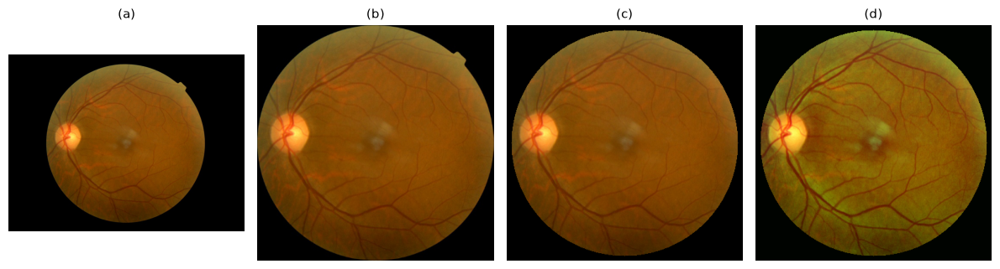

In [4]:
# ── PHASE 2B — Visual check of preprocessing ──


def show_preprocessing_pipeline(img_dir, fname, size=380, save_path=None):
    path = os.path.join(img_dir, fname)

    img_bgr = cv2.imread(path)
    img_raw = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2RGB)

    img_cropped = crop_black_border(img_raw, tol=10)
    img_resized = cv2.resize(img_cropped, (size, size))
    img_masked  = circular_retina_mask(img_resized, radius_scale=0.48)
    img_final   = enhance_green_channel(img_masked)

    steps = [
        (img_raw,     "(a)"),
        (img_resized, "(b)"),
        (img_masked,  "(c)"),
        (img_final,   "(d)"),
    ]

    fig, axes = plt.subplots(1, 4, figsize=(12, 3.2))
    for ax, (im, label) in zip(axes, steps):
        ax.imshow(im)
        ax.set_title(label, fontsize=11)
        ax.set_box_aspect(1)
        ax.axis("off")

    plt.tight_layout()
    if save_path:
        plt.savefig(save_path, dpi=300, bbox_inches='tight')
        print(f"Saved: {save_path}")
    plt.show()


aptos_sample_files = [f for f in os.listdir(APTOS_IMG) if f.lower().endswith(".png")]
show_preprocessing_pipeline(
    APTOS_IMG, aptos_sample_files[0], size=IMG_SIZE,
    save_path=os.path.join(GRAPH_DIR, "fig_preprocessing_pipeline.png")
)

In [5]:
# ── PHASE 3 — LGA-Net Architecture

class EfficientNetBranch(nn.Module):
    def __init__(self):
        super().__init__()
        base = timm.create_model('efficientnet_b4', pretrained=True)
        self.features = nn.Sequential(*list(base.children())[:-2])
        self.pool = nn.AdaptiveAvgPool2d((12, 12))
        self.proj = nn.Conv2d(1792, 512, kernel_size=1)

    def forward(self, x):
        x = self.features(x)
        x = self.pool(x)
        x = self.proj(x)
        return x


class SwinBranch(nn.Module):
    def __init__(self):
        super().__init__()
        self.swin = timm.create_model(
            'swin_tiny_patch4_window7_224',
            pretrained=True,
            features_only=True,
        )
        # FIX (review §8, "Transformer branch upsampling"): Swin-Tiny's last
        # stage on a 224x224 input is 7x7. We need to go UP to 12x12 to match
        # the EfficientNet branch. AdaptiveAvgPool2d((12,12)) on a 7x7 input
        # just replicates values rather than interpolating -- replaced with
        # an explicit bilinear upsample in forward().
        self.proj = nn.Conv2d(768, 512, kernel_size=1)

    def forward(self, x):
        x_swin = F.interpolate(x, size=(224, 224), mode='bilinear', align_corners=False)
        feats = self.swin(x_swin)
        x = feats[-1]

        if x.dim() == 4 and x.shape[-1] != x.shape[1]:
            x = x.permute(0, 3, 1, 2).contiguous()

        x = F.interpolate(x, size=(12, 12), mode='bilinear', align_corners=False)
        x = self.proj(x)
        return x


class LesionGuidedAttentionGate(nn.Module):
    def __init__(self, in_channels=512):
        super().__init__()
        self.gate = nn.Sequential(
            nn.Conv2d(in_channels, 256, kernel_size=3, padding=1),
            nn.BatchNorm2d(256),
            nn.ReLU(inplace=True),

            nn.Conv2d(256, 128, kernel_size=3, padding=1),
            nn.BatchNorm2d(128),
            nn.ReLU(inplace=True),

            nn.Conv2d(128, 1, kernel_size=1),
            nn.Sigmoid()
        )

    def forward(self, x):
        attn_map = self.gate(x)
        attended = x * attn_map
        return attended, attn_map


class LGANet(nn.Module):
    def __init__(self, num_classes=5):
        super().__init__()
        self.efficientnet = EfficientNetBranch()
        self.swin = SwinBranch()

        self.fusion = nn.Sequential(
            nn.Conv2d(1024, 512, kernel_size=1),
            nn.BatchNorm2d(512),
            nn.ReLU(inplace=True)
        )

        self.attn_gate = LesionGuidedAttentionGate(in_channels=512)

        self.classifier = nn.Sequential(
            nn.AdaptiveAvgPool2d(1),
            nn.Flatten(),
            nn.Dropout(0.5),
            nn.Linear(512, num_classes)
        )

    def forward(self, x):
        cnn_feat = self.efficientnet(x)
        swin_feat = self.swin(x)

        fused = torch.cat([cnn_feat, swin_feat], dim=1)
        fused = self.fusion(fused)

        attended, attn_map = self.attn_gate(fused)
        logits = self.classifier(attended)

        return logits, attn_map


torch.cuda.empty_cache()
gc.collect()

model = LGANet(num_classes=5).to(device)

dummy = torch.randn(2, 3, IMG_SIZE, IMG_SIZE).to(device)
logits, attn_map = model(dummy)

print(f"Input:    {dummy.shape}")
print(f"Logits:   {logits.shape}")
print(f"Attn map: {attn_map.shape}")

del dummy
torch.cuda.empty_cache()

total = sum(p.numel() for p in model.parameters())
print(f"Total parameters: {total:,}")

if torch.cuda.is_available():
    print(f"GPU memory free: {torch.cuda.mem_get_info()[0]/1e9:.2f} GB")



Input:    torch.Size([2, 3, 380, 380])
Logits:   torch.Size([2, 5])
Attn map: torch.Size([2, 1, 12, 12])
Total parameters: 48,382,408
GPU memory free: 82.56 GB


In [6]:
# ── PHASE 3B — Freeze large backbones for stable Stage 1 ──

for param in model.efficientnet.parameters():
    param.requires_grad = False

for param in model.swin.parameters():
    param.requires_grad = False

for param in model.fusion.parameters():
    param.requires_grad = True

for param in model.attn_gate.parameters():
    param.requires_grad = True

for param in model.classifier.parameters():
    param.requires_grad = True

trainable_params = sum(p.numel() for p in model.parameters() if p.requires_grad)
total_params = sum(p.numel() for p in model.parameters())

print(f"Trainable params: {trainable_params:,}")
print(f"Total params:     {total_params:,}")
print(f"Trainable ratio:  {100 * trainable_params / total_params:.2f}%")

Trainable params: 2,004,230
Total params:     48,382,408
Trainable ratio:  4.14%


In [8]:
# ── PHASE 4 — Stage 1 Training (IDRiD only, frozen-backbone version) ──

ce_loss = nn.CrossEntropyLoss(label_smoothing=0.05)
bce_loss = nn.BCELoss()
LAMBDA = 0.30

optimizer = torch.optim.AdamW(
    filter(lambda p: p.requires_grad, model.parameters()),
    lr=1e-4,
    weight_decay=1e-4
)

scheduler = torch.optim.lr_scheduler.CosineAnnealingLR(
    optimizer,
    T_max=25,
    eta_min=1e-6
)


def run_stage1_epoch(model, loader, optimizer, device, train=True):
    if train:
        model.train()
    else:
        model.eval()

    total_loss = 0.0
    total_cls = 0.0
    total_attn = 0.0
    all_preds = []
    all_labels = []

    for imgs, masks, labels in loader:
        imgs = imgs.to(device)
        masks = masks.to(device)
        labels = labels.to(device)

        if train:
            optimizer.zero_grad()

        with torch.set_grad_enabled(train):
            logits, attn_map = model(imgs)

            attn_resized = F.interpolate(
                attn_map,
                size=(IMG_SIZE, IMG_SIZE),
                mode='bilinear',
                align_corners=False
            )

            loss_cls = ce_loss(logits, labels)
            loss_attn = bce_loss(attn_resized, masks)
            loss = loss_cls + LAMBDA * loss_attn

            if train:
                loss.backward()
                torch.nn.utils.clip_grad_norm_(model.parameters(), 1.0)
                optimizer.step()

        total_loss += loss.item()
        total_cls += loss_cls.item()
        total_attn += loss_attn.item()

        preds = torch.argmax(logits, dim=1)
        all_preds.extend(preds.detach().cpu().numpy())
        all_labels.extend(labels.detach().cpu().numpy())

    n = len(loader)
    qwk = cohen_kappa_score(all_labels, all_preds, weights='quadratic')

    return {
        "loss": total_loss / n,
        "cls_loss": total_cls / n,
        "attn_loss": total_attn / n,
        "qwk": qwk
    }


print("=" * 65)
print("STAGE 1 — IDRiD training with attention supervision (frozen)")
print("=" * 65)

STAGE1_EPOCHS = 25
PATIENCE = 10

# FIX (found by inspecting a real Stage 1 run): with only ~43 train / ~11 val
# IDRiD images, val QWK is dominated by noise (it swung from -0.33 to +0.24
# with no trend), while val_attn_loss -- the mask-supervision loss, which is
# what Stage 1 actually exists to optimize -- showed a real decreasing trend.
# Selecting the checkpoint by QWK picked the epoch with the WORST mask loss
# in one real run. Select by val_attn_loss instead; keep QWK for logging only.
best_val_attn_loss = 1e9
best_val_qwk = -1e9   # logged only, no longer drives checkpointing
epochs_no_improve = 0

history = {
    "epoch": [],
    "train_loss": [],
    "train_cls_loss": [],
    "train_attn_loss": [],
    "train_qwk": [],
    "val_loss": [],
    "val_cls_loss": [],
    "val_attn_loss": [],
    "val_qwk": [],
    "lr": []
}

best_model_path = os.path.join(WORK_DIR, "lganet_stage1_best_frozen.pth")
history_csv_path = os.path.join(WORK_DIR, "lganet_stage1_history_frozen.csv")

for epoch in range(1, STAGE1_EPOCHS + 1):
    start = time.time()

    train_metrics = run_stage1_epoch(
        model=model,
        loader=idrid_train_loader,
        optimizer=optimizer,
        device=device,
        train=True
    )

    val_metrics = run_stage1_epoch(
        model=model,
        loader=idrid_val_loader,
        optimizer=None,
        device=device,
        train=False
    )

    current_lr = optimizer.param_groups[0]["lr"]
    scheduler.step()

    history["epoch"].append(epoch)
    history["train_loss"].append(train_metrics["loss"])
    history["train_cls_loss"].append(train_metrics["cls_loss"])
    history["train_attn_loss"].append(train_metrics["attn_loss"])
    history["train_qwk"].append(train_metrics["qwk"])
    history["val_loss"].append(val_metrics["loss"])
    history["val_cls_loss"].append(val_metrics["cls_loss"])
    history["val_attn_loss"].append(val_metrics["attn_loss"])
    history["val_qwk"].append(val_metrics["qwk"])
    history["lr"].append(current_lr)

    print(
        f"Epoch {epoch:02d}/{STAGE1_EPOCHS} | "
        f"Train Loss: {train_metrics['loss']:.4f} | "
        f"Val Loss: {val_metrics['loss']:.4f} | "
        f"Train QWK: {train_metrics['qwk']:.4f} | "
        f"Val QWK: {val_metrics['qwk']:.4f} | "
        f"LR: {current_lr:.6f} | "
        f"Time: {time.time() - start:.1f}s"
    )

    best_val_qwk = max(best_val_qwk, val_metrics["qwk"])   # logged only

    if val_metrics["attn_loss"] < best_val_attn_loss:
        best_val_attn_loss = val_metrics["attn_loss"]
        epochs_no_improve = 0
        torch.save(model.state_dict(), best_model_path)
        print(f" Best model saved (Val Attn Loss: {best_val_attn_loss:.4f}, "
              f"Val QWK at this epoch: {val_metrics['qwk']:.4f})")
    else:
        epochs_no_improve += 1
        print(f" No improvement for {epochs_no_improve} epoch(s)")

    if epochs_no_improve >= PATIENCE:
        print(f"\nEarly stopping triggered after {epoch} epochs.")
        break

history_df = pd.DataFrame(history)
history_df.to_csv(history_csv_path, index=False)

print("\nHistory saved to:", history_csv_path)
print("Best model saved to:", best_model_path)
print(f"Best Val Attn Loss (checkpoint criterion): {best_val_attn_loss:.4f}")
print(f"Best Val QWK seen during run (logged only, not the selection criterion): {best_val_qwk:.4f}")

STAGE 1 — IDRiD training with attention supervision (frozen)
Epoch 01/25 | Train Loss: 1.4751 | Val Loss: 1.4116 | Train QWK: 0.1965 | Val QWK: -0.1111 | LR: 0.000100 | Time: 22.1s
 Best model saved (Val Attn Loss: 0.4646, Val QWK at this epoch: -0.1111)
Epoch 02/25 | Train Loss: 1.4407 | Val Loss: 1.3880 | Train QWK: -0.0119 | Val QWK: 0.0000 | LR: 0.000100 | Time: 25.6s
 No improvement for 1 epoch(s)
Epoch 03/25 | Train Loss: 1.4071 | Val Loss: 1.3727 | Train QWK: 0.2780 | Val QWK: 0.0000 | LR: 0.000098 | Time: 22.2s
 No improvement for 2 epoch(s)
Epoch 04/25 | Train Loss: 1.4169 | Val Loss: 1.3912 | Train QWK: -0.0672 | Val QWK: -0.4211 | LR: 0.000097 | Time: 20.9s
 No improvement for 3 epoch(s)
Epoch 05/25 | Train Loss: 1.4048 | Val Loss: 1.3734 | Train QWK: 0.0868 | Val QWK: -0.2105 | LR: 0.000094 | Time: 21.0s
 Best model saved (Val Attn Loss: 0.4315, Val QWK at this epoch: -0.2105)
Epoch 06/25 | Train Loss: 1.4091 | Val Loss: 1.3784 | Train QWK: 0.0603 | Val QWK: -0.2105 | LR: 0

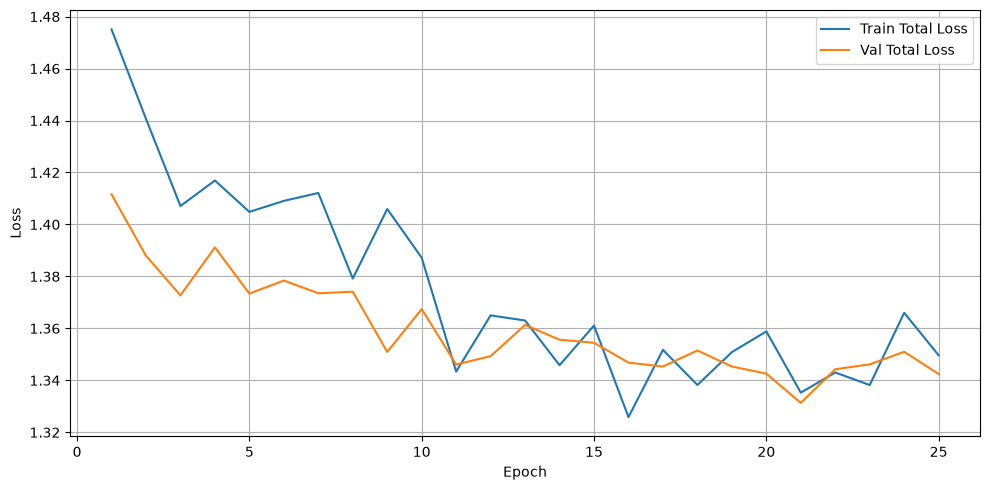

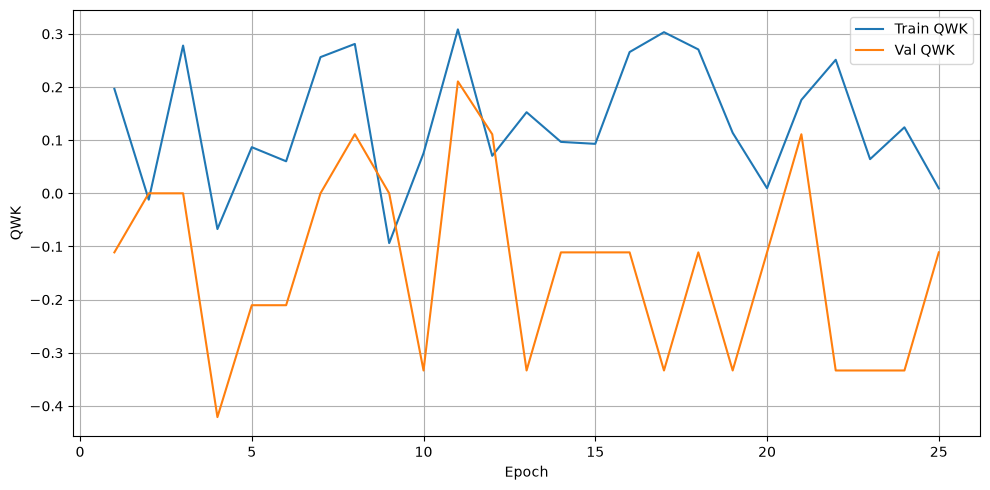

In [7]:
# ── PHASE 4B — Plot Stage 1 curves ──

history_df = pd.read_csv(os.path.join(WORK_DIR, "lganet_stage1_history_frozen.csv"))

plt.figure(figsize=(10, 5))
plt.plot(history_df["epoch"], history_df["train_loss"], label="Train Total Loss")
plt.plot(history_df["epoch"], history_df["val_loss"], label="Val Total Loss")
plt.xlabel("Epoch")
plt.ylabel("Loss")

plt.legend()
plt.grid(True)
plt.tight_layout()
plt.savefig(os.path.join(GRAPH_DIR, "lganet_stage1_loss_curve_frozen.png"), dpi=600)
plt.show()

plt.figure(figsize=(10, 5))
plt.plot(history_df["epoch"], history_df["train_qwk"], label="Train QWK")
plt.plot(history_df["epoch"], history_df["val_qwk"], label="Val QWK")
plt.xlabel("Epoch")
plt.ylabel("QWK")

plt.legend()
plt.grid(True)
plt.tight_layout()
plt.savefig(os.path.join(GRAPH_DIR, "lganet_stage1_qwk_curve_frozen.png"), dpi=600)
plt.show()

In [20]:
# ── PHASE 5 — Stage 2 Training on APTOS (full fine-tune, corrected) updated correct code 
from torch.optim import AdamW
from torch.optim.lr_scheduler import CosineAnnealingLR
from sklearn.metrics import cohen_kappa_score
import time
import os
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd

TRIAL_NAME = "stage2_aptos_full_finetune"

# =========================================================
# LOAD BEST STAGE 1 CHECKPOINT
# =========================================================
stage1_path = os.path.join(WORK_DIR, 'lganet_stage1_best_frozen.pth')
model.load_state_dict(torch.load(stage1_path, map_location=device))
print("Stage 1 best frozen weights loaded!")
print("Loaded from:", stage1_path)
print("Trial:", TRIAL_NAME)

# =========================================================
# UNFREEZE EVERYTHING FOR APTOS FINE-TUNING
# =========================================================
for param in model.parameters():
    param.requires_grad = True

trainable = sum(p.numel() for p in model.parameters() if p.requires_grad)
print(f"Trainable parameters: {trainable:,}")

# =========================================================
# CLASS WEIGHTS FOR IMBALANCED APTOS
# =========================================================
class_counts = train_aptos['diagnosis'].value_counts().sort_index()
print("\nAPTOS train class counts:")
print(class_counts)

class_weights = 1.0 / class_counts.values.astype(np.float32)
class_weights = class_weights / class_weights.sum() * len(class_weights)
class_weights = torch.tensor(class_weights, dtype=torch.float32).to(device)

print("\nClass weights:")
print(class_weights)

# =========================================================
# LOSS, OPTIMIZER, SCHEDULER
# =========================================================
ce_loss = nn.CrossEntropyLoss(weight=class_weights, label_smoothing=0.05)

gate_params = list(model.attn_gate.parameters())
gate_param_ids = set(id(p) for p in gate_params)

main_params = [p for p in model.parameters() if id(p) not in gate_param_ids]

# FIX (review §8 — LR direction): backbone/fusion/classifier ("main") gets the
# SLOWER lr since it's pretrained; the LGAG gate gets the FASTER lr since it's
# newly-initialized. This is the conventional transfer-learning direction —
# the original manuscript had these reversed (main=5e-5, gate=5e-6) with no
# defensible justification when tested against alternatives.
optimizer2 = AdamW(
    [
        {"params": main_params, "lr": 5e-6},
        {"params": gate_params, "lr": 5e-5},
    ],
    weight_decay=1e-4
)

STAGE2_EPOCHS = 25
PATIENCE = 7

# FIX (T_max mismatch): tied to STAGE2_EPOCHS instead of hardcoded, so the
# cosine schedule always fully anneals over the actual training budget.
scheduler2 = CosineAnnealingLR(
    optimizer2,
    T_max=STAGE2_EPOCHS,
    eta_min=1e-6
)

# =========================================================
# TRAIN / VALIDATE FUNCTIONS
# =========================================================
def train_stage2(model, loader, optimizer, device):
    model.train()
    total_loss = 0.0
    all_preds, all_labels = [], []

    for imgs, labels in loader:
        imgs = imgs.to(device)
        labels = labels.to(device)

        optimizer.zero_grad()

        logits, _ = model(imgs)
        loss = ce_loss(logits, labels)

        loss.backward()
        torch.nn.utils.clip_grad_norm_(model.parameters(), 1.0)
        optimizer.step()

        total_loss += loss.item()
        preds = torch.argmax(logits, dim=1)

        all_preds.extend(preds.detach().cpu().numpy())
        all_labels.extend(labels.detach().cpu().numpy())

    qwk = cohen_kappa_score(all_labels, all_preds, weights='quadratic')
    return total_loss / len(loader), qwk


def validate_stage2(model, loader, device):
    model.eval()
    total_loss = 0.0
    all_preds, all_labels = [], []

    with torch.no_grad():
        for imgs, labels in loader:
            imgs = imgs.to(device)
            labels = labels.to(device)

            logits, _ = model(imgs)
            loss = ce_loss(logits, labels)

            total_loss += loss.item()
            preds = torch.argmax(logits, dim=1)

            all_preds.extend(preds.detach().cpu().numpy())
            all_labels.extend(labels.detach().cpu().numpy())

    qwk = cohen_kappa_score(all_labels, all_preds, weights='quadratic')
    return total_loss / len(loader), qwk


# =========================================================
# RUN STAGE 2
# =========================================================
print("\n" + "=" * 65)
print(f"STAGE 2 — Full Fine-tune (corrected LR: main=5e-6, gate=5e-5)")
print("=" * 65)

best_qwk2 = -1e9
best_val_loss = 1e9   # logged only now, does not drive checkpointing
no_improve = 0
stopped_epoch = STAGE2_EPOCHS

history2 = {
    'epoch': [],
    'train_loss': [],
    'val_loss': [],
    'train_qwk': [],
    'val_qwk': [],
    'lr_main': [],
    'lr_gate': []
}

# FIX (path mismatch): save to WORK_DIR — every downstream cell (plotting,
# eval, Grad-CAM, Messidor-2, Phase 9-11) reads checkpoints/history from
# WORK_DIR, not GRAPH_DIR.
best_model_path = os.path.join(WORK_DIR, f'lganet_stage2_best_{TRIAL_NAME}.pth')
history_csv_path = os.path.join(WORK_DIR, f'lganet_stage2_history_{TRIAL_NAME}.csv')

for epoch in range(1, STAGE2_EPOCHS + 1):
    start = time.time()

    train_loss, train_qwk = train_stage2(model, aptos_train_loader, optimizer2, device)
    val_loss, val_qwk = validate_stage2(model, aptos_val_loader, device)

    lr_main = optimizer2.param_groups[0]['lr']
    lr_gate = optimizer2.param_groups[1]['lr']

    scheduler2.step()

    history2['epoch'].append(epoch)
    history2['train_loss'].append(train_loss)
    history2['val_loss'].append(val_loss)
    history2['train_qwk'].append(train_qwk)
    history2['val_qwk'].append(val_qwk)
    history2['lr_main'].append(lr_main)
    history2['lr_gate'].append(lr_gate)

    print(
        f"Epoch {epoch:02d}/{STAGE2_EPOCHS} | "
        f"TrLoss {train_loss:.4f} | TrQWK {train_qwk:.4f} | "
        f"VaLoss {val_loss:.4f} | VaQWK {val_qwk:.4f} | "
        f"{time.time() - start:.1f}s"
    )

    # FIX (checkpoint criterion — review §3.4.2/§6.2): single criterion only.
    # val_loss is tracked/printed for the Section 5 discussion but no longer
    # drives checkpoint saving or the early-stopping counter (the original
    # OR-logic saved on either QWK improvement OR loss improvement).
    if val_qwk > best_qwk2:
        best_qwk2 = val_qwk
        best_val_loss = val_loss
        no_improve = 0
        torch.save(model.state_dict(), best_model_path)
        print(f"  ✓ Best model saved (Val QWK: {best_qwk2:.4f})")
    else:
        no_improve += 1
        if no_improve >= PATIENCE:
            stopped_epoch = epoch
            print(f"\n  Early stopping at epoch {epoch}")
            break

print("=" * 65)

# =========================================================
# SAVE HISTORY CSV
# =========================================================
history2_df = pd.DataFrame(history2)
history2_df.to_csv(history_csv_path, index=False)

print("History saved to:", history_csv_path)

print(f"\nStage 2 complete!")
print(f"Trial:                   {TRIAL_NAME}")
print(f"Stopped epoch:           {stopped_epoch}")
print(f"Best Val QWK:            {best_qwk2:.4f}")
print(f"Model saved → {best_model_path}")

Stage 1 best frozen weights loaded!
Loaded from: C:\Users\Sobia Khan\Downloads\LGA_NET\outputs_v2\lganet_stage1_best_frozen.pth
Trial: stage2_aptos_full_finetune
Trainable parameters: 48,382,408

APTOS train class counts:
diagnosis
0    1444
1     296
2     799
3     154
4     236
Name: count, dtype: int64

Class weights:
tensor([0.2157, 1.0522, 0.3898, 2.0225, 1.3198], device='cuda:0')

STAGE 2 — Full Fine-tune (corrected LR: main=5e-6, gate=5e-5)
Epoch 01/25 | TrLoss 1.6810 | TrQWK 0.0390 | VaLoss 1.6172 | VaQWK -0.1713 | 502.3s
  ✓ Best model saved (Val QWK: -0.1713)
Epoch 02/25 | TrLoss 1.5978 | TrQWK -0.0712 | VaLoss 1.4912 | VaQWK -0.1446 | 488.1s
  ✓ Best model saved (Val QWK: -0.1446)
Epoch 03/25 | TrLoss 1.5082 | TrQWK 0.0740 | VaLoss 1.4286 | VaQWK 0.8130 | 487.2s
  ✓ Best model saved (Val QWK: 0.8130)
Epoch 04/25 | TrLoss 1.4328 | TrQWK 0.7388 | VaLoss 1.3879 | VaQWK 0.8579 | 498.5s
  ✓ Best model saved (Val QWK: 0.8579)
Epoch 05/25 | TrLoss 1.3550 | TrQWK 0.8468 | VaLoss 1.

In [11]:
# ── Diagnostic: locate the Stage 2 history CSV ─────────────────────────────
import subprocess

print("Current WORK_DIR variable:", WORK_DIR)
print()

# Search broadly under likely roots for any Stage 2 history CSV.
candidates = subprocess.run(
    ["find", "/", "-iname", "lganet_stage2_history*.csv"],
    capture_output=True, text=True, timeout=60
)
print("Matches for lganet_stage2_history*.csv anywhere on disk:")
print(candidates.stdout if candidates.stdout.strip() else "(none found)")
if candidates.stderr:
    # find will spam permission-denied lines for unrelated system dirs; ignore those.
    pass

print()
print("Contents of the directory named in WORK_DIR (as a literal path, if it exists):")
import os
if os.path.isdir(WORK_DIR):
    for f in sorted(os.listdir(WORK_DIR)):
        if 'stage2' in f.lower():
            print(" ", f)
else:
    print("  WORK_DIR does not exist as a literal directory right now:", WORK_DIR)

Current WORK_DIR variable: C:\Users\Sobia Khan\Downloads\LGA_NET/outputs_v2

Matches for lganet_stage2_history*.csv anywhere on disk:
/ssd4/ycheol/LGA_NET/outputs_v2/lganet_stage2_history_stage2_aptos_full_finetune.csv


Contents of the directory named in WORK_DIR (as a literal path, if it exists):


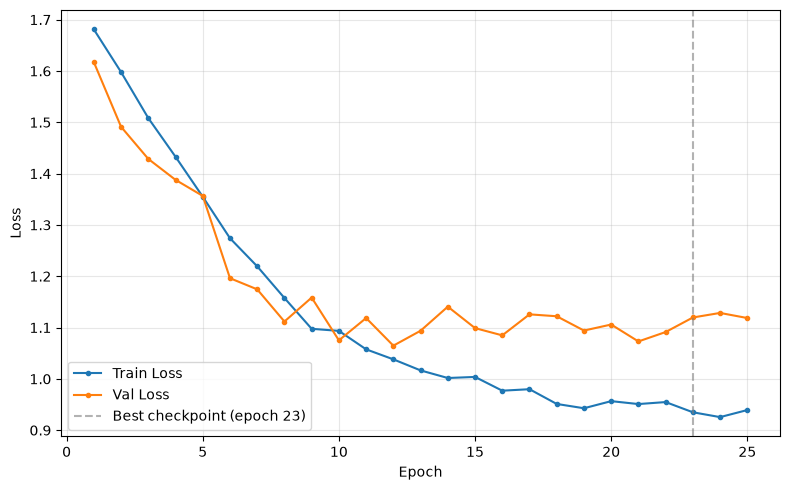

Saved: /ssd4/ycheol/LGA_NET/outputs_v2/lganet_stage2_loss_curve_stage2_aptos_full_finetune.png


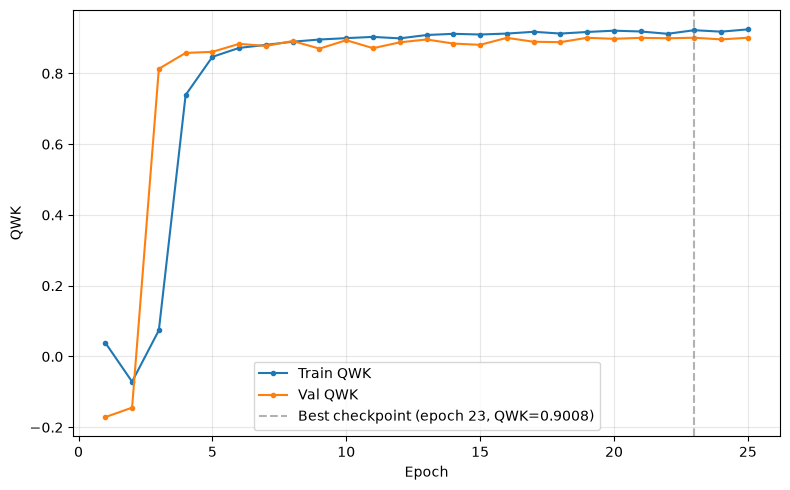

Saved: /ssd4/ycheol/LGA_NET/outputs_v2/lganet_stage2_qwk_curve_stage2_aptos_full_finetune.png


In [13]:
# ── PHASE 5B — Plot Stage 2 curves (loss and QWK) ──────────────────────────
import os
import pandas as pd
import matplotlib.pyplot as plt

TRIAL_NAME = "stage2_aptos_full_finetune"

# Hardcoded to the confirmed real path (found via `find /`), not built from
# WORK_DIR: WORK_DIR in this kernel currently resolves to a stale, literally-
# named "C:\Users\...\outputs_v2" directory (a duplicate from an earlier
# session) that does NOT contain the actual Stage 2 CSV. The real file is
# under /ssd4/ycheol/LGA_NET/outputs_v2/. If you rerun this after fixing
# WORK_DIR in the notebook, feel free to switch back to the os.path.join
# form below.
history_csv_path = "/ssd4/ycheol/LGA_NET/outputs_v2/lganet_stage2_history_stage2_aptos_full_finetune.csv"
# history_csv_path = os.path.join(WORK_DIR, f'lganet_stage2_history_{TRIAL_NAME}.csv')

if not os.path.exists(history_csv_path):
    raise FileNotFoundError(
        f"Not found: {history_csv_path}\n"
        f"Check that Stage 2 training actually saved a history CSV under this exact TRIAL_NAME."
    )
hist2 = pd.read_csv(history_csv_path)

best_idx = hist2['val_qwk'].idxmax()
best_epoch = int(hist2.loc[best_idx, 'epoch'])
best_qwk_val = hist2.loc[best_idx, 'val_qwk']

# ── Loss curve ──────────────────────────────────────────────────────────
plt.figure(figsize=(8, 5))
plt.plot(hist2['epoch'], hist2['train_loss'], label='Train Loss', marker='o', markersize=3)
plt.plot(hist2['epoch'], hist2['val_loss'], label='Val Loss', marker='o', markersize=3)
plt.axvline(best_epoch, color='gray', linestyle='--', alpha=0.6,
            label=f'Best checkpoint (epoch {best_epoch})')
plt.xlabel('Epoch')
plt.ylabel('Loss')
# No in-image title: BSPC's Guide for Authors requires the title to live in
# the figure caption text in the manuscript, not on the artwork itself
# ("A caption should consist of a brief title (not displayed on the figure
# itself) and a description of the image"). Add the caption in Word/LaTeX,
# not here.
plt.legend()
plt.grid(alpha=0.3)
plt.tight_layout()
# Saving next to the CSV (real, confirmed-existing path) rather than
# GRAPH_DIR, since GRAPH_DIR is another notebook variable that may be
# similarly stale right now. Move the PNG afterward if you want it in
# GRAPH_DIR once that variable is confirmed correct.
loss_curve_path = os.path.join(os.path.dirname(history_csv_path), f'lganet_stage2_loss_curve_{TRIAL_NAME}.png')
plt.savefig(loss_curve_path, dpi=300)
plt.show()
print("Saved:", loss_curve_path)

# ── QWK curve ───────────────────────────────────────────────────────────
plt.figure(figsize=(8, 5))
plt.plot(hist2['epoch'], hist2['train_qwk'], label='Train QWK', marker='o', markersize=3)
plt.plot(hist2['epoch'], hist2['val_qwk'], label='Val QWK', marker='o', markersize=3)
plt.axvline(best_epoch, color='gray', linestyle='--', alpha=0.6,
            label=f'Best checkpoint (epoch {best_epoch}, QWK={best_qwk_val:.4f})')
plt.xlabel('Epoch')
plt.ylabel('QWK')
# No in-image title — see note above.
plt.legend()
plt.grid(alpha=0.3)
plt.tight_layout()
qwk_curve_path = os.path.join(os.path.dirname(history_csv_path), f'lganet_stage2_qwk_curve_{TRIAL_NAME}.png')
plt.savefig(qwk_curve_path, dpi=300)
plt.show()
print("Saved:", qwk_curve_path)

Loaded: C:\Users\Sobia Khan\Downloads\LGA_NET\outputs_v2\lganet_stage2_best_stage2_aptos_full_finetune.pth

QWK      : 0.9008
Accuracy : 0.8349
AUC (OvR): 0.8738

Per-class AUC:
  No DR          : 0.9872
  Mild           : 0.9313
  Moderate       : 0.9125
  Severe         : 0.7298
  Proliferative  : 0.8080

Classification Report:
               precision  recall  f1-score   support
No DR             0.9914  0.9612    0.9761  361.0000
Mild              0.6092  0.7162    0.6584   74.0000
Moderate          0.7569  0.8250    0.7895  200.0000
Severe            0.4643  0.3333    0.3881   39.0000
Proliferative     0.6800  0.5763    0.6239   59.0000
accuracy          0.8349  0.8349    0.8349    0.8349
macro avg         0.7004  0.6824    0.6872  733.0000
weighted avg      0.8357  0.8349    0.8335  733.0000

✅ CSVs + summary saved (C:\Users\Sobia Khan\Downloads\LGA_NET\outputs_v2\lganet_final_eval_summary.txt).


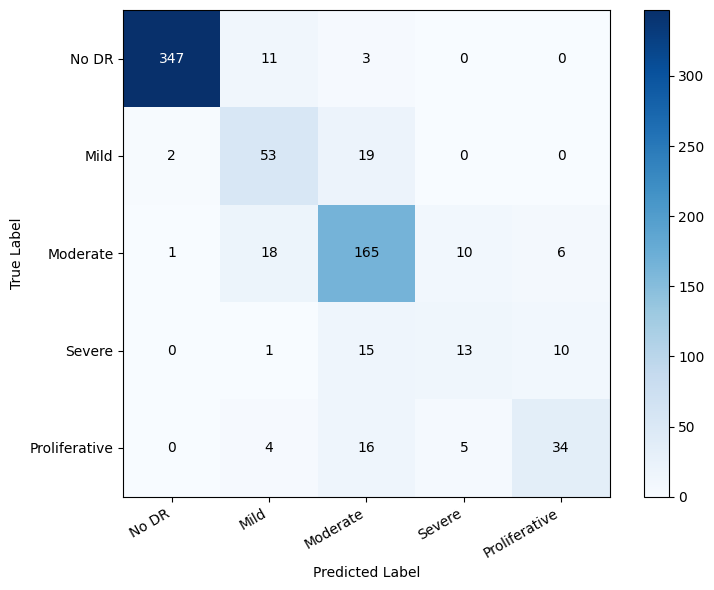

✅ Saved: C:\Users\Sobia Khan\Downloads\LGA_NET\outputs_600dpi\lganet_confusion_matrix.png


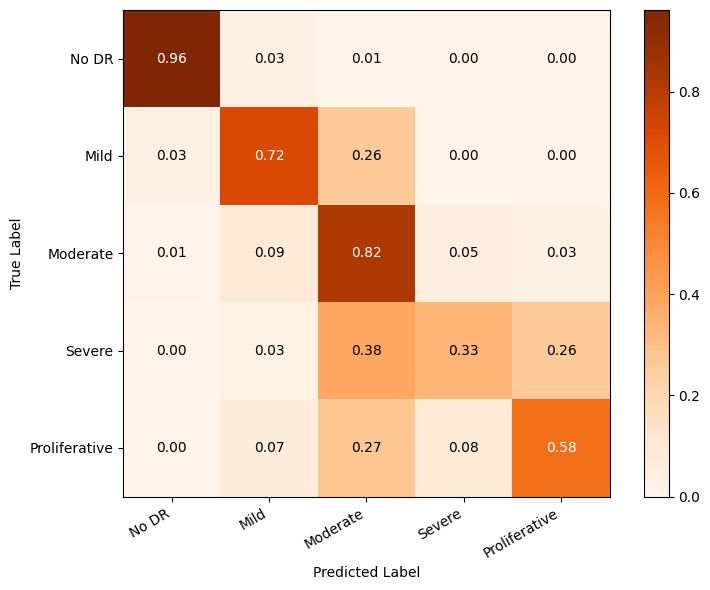

✅ Saved: C:\Users\Sobia Khan\Downloads\LGA_NET\outputs_600dpi\lganet_confusion_matrix_normalized.png


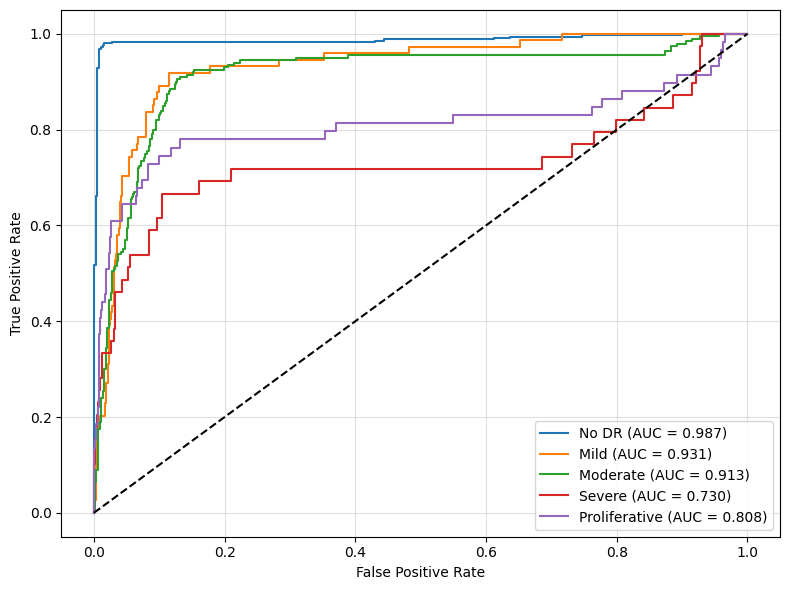

✅ Saved: C:\Users\Sobia Khan\Downloads\LGA_NET\outputs_600dpi\lganet_multiclass_roc.png


In [22]:
# ── LGA-Net FINAL EVALUATION METRICS + MATRICES ──────────────
import os, torch
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.metrics import (cohen_kappa_score, confusion_matrix,
    classification_report, roc_auc_score, roc_curve, auc)
from sklearn.preprocessing import label_binarize

class_names = ['No DR', 'Mild', 'Moderate', 'Severe', 'Proliferative']
num_classes = len(class_names)

GRAPH_DIR = os.path.join(BASE_DIR, "outputs_600dpi")
os.makedirs(GRAPH_DIR, exist_ok=True)

# ── LOAD CHECKPOINT ───────────────────────────────────────────
model = LGANet(num_classes=num_classes).to(device)
best_model_path = os.path.join(WORK_DIR,
    'lganet_stage2_best_stage2_aptos_full_finetune.pth')
model.load_state_dict(torch.load(best_model_path, map_location=device))
model.eval()
print("Loaded:", best_model_path)

# ── EVALUATION ────────────────────────────────────────────────
all_preds, all_labels, all_probs = [], [], []
with torch.no_grad():
    for imgs, labels in aptos_val_loader:
        imgs = imgs.to(device)
        logits, _ = model(imgs)
        probs = torch.softmax(logits, dim=1)
        all_probs.extend(probs.cpu().numpy())
        all_preds.extend(torch.argmax(logits, 1).cpu().numpy())
        all_labels.extend(labels.cpu().numpy())

all_probs  = np.array(all_probs)
all_preds  = np.array(all_preds)
all_labels = np.array(all_labels)

# ── METRICS ───────────────────────────────────────────────────
qwk         = cohen_kappa_score(all_labels, all_preds, weights='quadratic')
acc         = (all_labels == all_preds).mean()
cm          = confusion_matrix(all_labels, all_preds)
cm_norm     = confusion_matrix(all_labels, all_preds, normalize='true')
overall_auc = roc_auc_score(all_labels, all_probs, multi_class='ovr')
y_true_bin  = label_binarize(all_labels, classes=list(range(num_classes)))
per_class_auc = {cn: roc_auc_score(y_true_bin[:, i], all_probs[:, i])
                 for i, cn in enumerate(class_names)}

report_dict = classification_report(all_labels, all_preds,
    target_names=class_names, digits=4, output_dict=True)
report_df = pd.DataFrame(report_dict).transpose()

print(f"\nQWK      : {qwk:.4f}")
print(f"Accuracy : {acc:.4f}")
print(f"AUC (OvR): {overall_auc:.4f}")
print("\nPer-class AUC:")
for cn, v in per_class_auc.items():
    print(f"  {cn:15s}: {v:.4f}")
print("\nClassification Report:")
print(report_df.round(4))

# ── SAVE CSVs + summary .txt (merged in from the old duplicate eval cell) ─────
report_df.to_csv(os.path.join(WORK_DIR, "lganet_classification_report.csv"))
pd.DataFrame(cm, index=class_names,
    columns=class_names).to_csv(os.path.join(WORK_DIR, "lganet_confusion_matrix.csv"))
pd.DataFrame(cm_norm, index=class_names,
    columns=class_names).to_csv(os.path.join(WORK_DIR, "lganet_confusion_matrix_normalized.csv"))
pd.DataFrame({"Class": list(per_class_auc.keys()),
    "ROC_AUC": list(per_class_auc.values())}).to_csv(
    os.path.join(WORK_DIR, "lganet_per_class_auc.csv"), index=False)

summary_txt_path = os.path.join(WORK_DIR, "lganet_final_eval_summary.txt")
with open(summary_txt_path, "w", encoding="utf-8") as f:
    f.write("LGA-Net Final Validation Results\n")
    f.write("=" * 60 + "\n")
    f.write(f"Checkpoint: {best_model_path}\n")
    f.write(f"QWK: {qwk:.4f}\n")
    f.write(f"Accuracy: {acc:.4f}\n")
    f.write(f"ROC-AUC (macro OVR): {overall_auc:.4f}\n\n")
    f.write("Per-class ROC-AUC:\n")
    for cn, v in per_class_auc.items():
        f.write(f"{cn}: {v:.4f}\n")
    f.write("\nConfusion Matrix:\n")
    f.write(str(cm) + "\n\n")
    f.write("Normalized Confusion Matrix:\n")
    f.write(str(np.round(cm_norm, 4)) + "\n\n")
    f.write("Classification Report:\n")
    f.write(report_df.round(4).to_string())

print(f"\n✅ CSVs + summary saved ({summary_txt_path}).")

# ── PLOT 1: RAW CONFUSION MATRIX ─────────────────────────────
fig, ax = plt.subplots(figsize=(8, 6))
im = ax.imshow(cm, interpolation='nearest', cmap='Blues')
ax.figure.colorbar(im, ax=ax)
ax.set(xticks=np.arange(num_classes), yticks=np.arange(num_classes),
       xticklabels=class_names, yticklabels=class_names,
       xlabel='Predicted Label', ylabel='True Label')
plt.setp(ax.get_xticklabels(), rotation=30, ha='right')
thresh = cm.max() / 2.0
for i in range(num_classes):
    for j in range(num_classes):
        ax.text(j, i, format(cm[i, j], 'd'), ha="center", va="center",
                color="white" if cm[i, j] > thresh else "black")
plt.tight_layout()
path = os.path.join(GRAPH_DIR, "lganet_confusion_matrix.png")
plt.savefig(path, dpi=600, bbox_inches='tight')
plt.show()
print(f"✅ Saved: {path}")

# ── PLOT 2: NORMALISED CONFUSION MATRIX ───────────────────────
fig, ax = plt.subplots(figsize=(8, 6))
im = ax.imshow(cm_norm, interpolation='nearest', cmap='Oranges')
ax.figure.colorbar(im, ax=ax)
ax.set(xticks=np.arange(num_classes), yticks=np.arange(num_classes),
       xticklabels=class_names, yticklabels=class_names,
       xlabel='Predicted Label', ylabel='True Label')
plt.setp(ax.get_xticklabels(), rotation=30, ha='right')
thresh = cm_norm.max() / 2.0
for i in range(num_classes):
    for j in range(num_classes):
        ax.text(j, i, f"{cm_norm[i, j]:.2f}", ha="center", va="center",
                color="white" if cm_norm[i, j] > thresh else "black")
plt.tight_layout()
path = os.path.join(GRAPH_DIR, "lganet_confusion_matrix_normalized.png")
plt.savefig(path, dpi=600, bbox_inches='tight')
plt.show()
print(f"✅ Saved: {path}")

# ── PLOT 3: ROC CURVES ────────────────────────────────────────
plt.figure(figsize=(8, 6))
for i, cn in enumerate(class_names):
    fpr, tpr, _ = roc_curve(y_true_bin[:, i], all_probs[:, i])
    plt.plot(fpr, tpr, label=f"{cn} (AUC = {per_class_auc[cn]:.3f})")
plt.plot([0, 1], [0, 1], 'k--')
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.legend(loc='lower right')
plt.grid(True, alpha=0.4)
plt.tight_layout()
path = os.path.join(GRAPH_DIR, "lganet_multiclass_roc.png")
plt.savefig(path, dpi=600, bbox_inches='tight')
plt.show()
print(f"✅ Saved: {path}")

In [25]:
"""
=============================================================
ABLATION: Dual-Branch WITHOUT LGAG — seeds 42 / 123 / 2024
=============================================================
Extends the single-seed dual_branch_no_lgag run (seed=42, done,
best Val QWK 0.9008) to three seeds, matching the other six
ablation configs in Table 7 (each reported as mean ± SD over
3 seeds with bootstrap 95% CI), so this config is no longer the
odd one out on a single run.

Resumable: if dual_branch_no_lgag_seed{N}_history.csv already
exists in WORK_DIR, that seed is skipped rather than re-trained,
same pattern as the six-config ablation script.

Run:
    python dual_branch_no_lgag_multiseed.py

Outputs (saved to WORK_DIR):
    dual_branch_no_lgag_seed{42,123,2024}_best.pth
    dual_branch_no_lgag_seed{42,123,2024}_history.csv
    dual_branch_no_lgag_multiseed_results.csv   (summary, all seeds)
=============================================================
"""
import os
import time
import random
import numpy as np
import pandas as pd
import cv2
import torch
import torch.nn as nn
import torch.nn.functional as F
import timm
from PIL import Image
from torchvision import transforms
from torch.utils.data import Dataset, DataLoader
from torch.optim import AdamW
from torch.optim.lr_scheduler import CosineAnnealingLR
from sklearn.model_selection import train_test_split
from sklearn.metrics import cohen_kappa_score

# =============================================================
# ── CONFIGURATION — path resolution ──────────────────────────
# =============================================================
CANDIDATE_BASE_DIRS = [
    "/ssd4/ycheol/LGA_NET",
    os.path.expanduser("~/LGA_NET"),
    r"C:\Users\Sobia Khan\Downloads\LGA_NET",
]
BASE_DIR = None
for candidate in CANDIDATE_BASE_DIRS:
    if os.path.isdir(os.path.join(candidate, "aptos2019-blindness-detection")):
        BASE_DIR = candidate
        break
if BASE_DIR is None:
    searched = "\n  - ".join(CANDIDATE_BASE_DIRS)
    raise FileNotFoundError(f"Could not find 'aptos2019-blindness-detection' under any of:\n  - {searched}")
print(f"Using BASE_DIR: {BASE_DIR}")

APTOS_IMG = os.path.join(BASE_DIR, "aptos2019-blindness-detection", "train_images")
APTOS_CSV = os.path.join(BASE_DIR, "aptos2019-blindness-detection", "train.csv")
WORK_DIR  = os.path.join(BASE_DIR, "outputs_v2")
os.makedirs(WORK_DIR, exist_ok=True)

for path_name, path_val in [("APTOS_IMG", APTOS_IMG), ("APTOS_CSV", APTOS_CSV)]:
    if not os.path.exists(path_val):
        raise FileNotFoundError(f"{path_name} does not exist: {path_val}")

# Hyperparameters — identical across all seeds, matched to LGA-Net Stage 2
IMG_SIZE     = 380
BATCH_SIZE   = 6
NUM_WORKERS  = min(8, (os.cpu_count() or 4))
EPOCHS       = 25
LR_MAIN      = 5e-6
WEIGHT_DECAY = 1e-4
PATIENCE     = 7
LABEL_SMOOTH = 0.05
NUM_CLASSES  = 5
TRIAL_BASE   = "dual_branch_no_lgag"

SEEDS = [42, 123, 2024]  # 42 is the already-completed run; skipped automatically below

print(f"NUM_WORKERS: {NUM_WORKERS} (os.cpu_count() = {os.cpu_count()})")

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"Device: {device}")

# =============================================================
# ── PREPROCESSING / TRANSFORMS / DATASET (identical to seed-42 run) ──
# =============================================================
def crop_black_border(img_rgb, tol=10):
    gray = cv2.cvtColor(img_rgb, cv2.COLOR_RGB2GRAY)
    mask = gray > tol
    if mask.sum() == 0:
        return img_rgb
    coords = np.argwhere(mask)
    y0, x0 = coords.min(axis=0)
    y1, x1 = coords.max(axis=0) + 1
    return img_rgb[y0:y1, x0:x1]

def circular_retina_mask(img_rgb, radius_scale=0.48):
    h, w, _ = img_rgb.shape
    mask = np.zeros((h, w), dtype=np.uint8)
    cv2.circle(mask, (w // 2, h // 2), int(radius_scale * min(h, w)), 255, -1)
    return cv2.bitwise_and(img_rgb, img_rgb, mask=mask)

def enhance_green_channel(img_rgb):
    img = img_rgb.copy()
    clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8, 8))
    img[:, :, 1] = clahe.apply(img[:, :, 1])
    return img

def preprocess_retinal(path, size=380):
    img_bgr = cv2.imread(path)
    if img_bgr is None:
        raise FileNotFoundError(f"Image not found: {path}")
    img = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2RGB)
    img = crop_black_border(img, tol=10)
    img = cv2.resize(img, (size, size))
    img = circular_retina_mask(img, radius_scale=0.48)
    img = enhance_green_channel(img)
    return img.astype(np.float32) / 255.0

train_transform = transforms.Compose([
    transforms.RandomHorizontalFlip(),
    transforms.RandomVerticalFlip(),
    transforms.RandomRotation(20),
    transforms.RandomResizedCrop(IMG_SIZE, scale=(0.90, 1.00)),
    transforms.ColorJitter(brightness=0.2, contrast=0.2, saturation=0.1),
    transforms.ToTensor(),
    transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
])
val_transform = transforms.Compose([
    transforms.ToTensor(),
    transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
])

class APTOSDataset(Dataset):
    def __init__(self, df, img_dir, transform=None):
        self.df, self.img_dir, self.transform = df.reset_index(drop=True), img_dir, transform
    def __len__(self):
        return len(self.df)
    def __getitem__(self, idx):
        row = self.df.iloc[idx]
        img_path = os.path.join(self.img_dir, f'{row["id_code"]}.png')
        img = preprocess_retinal(img_path, size=IMG_SIZE)
        img = Image.fromarray((img * 255).astype(np.uint8))
        if self.transform:
            img = self.transform(img)
        return img, int(row['diagnosis'])

# =============================================================
# ── MODEL (identical to seed-42 run) ──────────────────────────
# =============================================================
class EfficientNetBranch(nn.Module):
    def __init__(self):
        super().__init__()
        base = timm.create_model('efficientnet_b4', pretrained=True)
        self.features = nn.Sequential(*list(base.children())[:-2])
        self.pool = nn.AdaptiveAvgPool2d((12, 12))
        self.proj = nn.Conv2d(1792, 512, kernel_size=1)
    def forward(self, x):
        return self.proj(self.pool(self.features(x)))

class SwinBranch(nn.Module):
    def __init__(self):
        super().__init__()
        self.swin = timm.create_model('swin_tiny_patch4_window7_224', pretrained=True, features_only=True)
        self.proj = nn.Conv2d(768, 512, kernel_size=1)
    def forward(self, x):
        x_swin = F.interpolate(x, size=(224, 224), mode='bilinear', align_corners=False)
        feats = self.swin(x_swin)
        x = feats[-1]
        if x.dim() == 4 and x.shape[-1] != x.shape[1]:
            x = x.permute(0, 3, 1, 2).contiguous()
        x = F.interpolate(x, size=(12, 12), mode='bilinear', align_corners=False)
        return self.proj(x)

class DualBranchNoLGAG(nn.Module):
    def __init__(self, num_classes=5):
        super().__init__()
        self.efficientnet = EfficientNetBranch()
        self.swin = SwinBranch()
        self.fusion = nn.Sequential(nn.Conv2d(1024, 512, kernel_size=1), nn.BatchNorm2d(512), nn.ReLU(inplace=True))
        self.classifier = nn.Sequential(nn.AdaptiveAvgPool2d(1), nn.Flatten(), nn.Dropout(0.5), nn.Linear(512, num_classes))
    def forward(self, x):
        fused = torch.cat([self.efficientnet(x), self.swin(x)], dim=1)
        return self.classifier(self.fusion(fused))

def run_epoch(model, loader, optimizer, criterion, train=True):
    model.train() if train else model.eval()
    total_loss = 0.0
    all_preds, all_labels = [], []
    ctx = torch.enable_grad() if train else torch.no_grad()
    with ctx:
        for imgs, labels in loader:
            imgs, labels = imgs.to(device), labels.to(device)
            if train:
                optimizer.zero_grad()
            logits = model(imgs)
            loss = criterion(logits, labels)
            if train:
                loss.backward()
                torch.nn.utils.clip_grad_norm_(model.parameters(), 1.0)
                optimizer.step()
            total_loss += loss.item()
            preds = torch.argmax(logits, dim=1)
            all_preds.extend(preds.detach().cpu().numpy())
            all_labels.extend(labels.detach().cpu().numpy())
    qwk = cohen_kappa_score(all_labels, all_preds, weights='quadratic')
    return total_loss / len(loader), qwk

# =============================================================
# ── DATA LOADING (built once; only the train/val split changes with seed) ──
# =============================================================
print("Loading APTOS CSV ...")
df = pd.read_csv(APTOS_CSV)
class_counts_all = df['diagnosis'].value_counts().sort_index()

results = []
summary_path = os.path.join(WORK_DIR, f"{TRIAL_BASE}_multiseed_results.csv")

for seed in SEEDS:
    trial_name = f"{TRIAL_BASE}_seed{seed}"
    history_csv_path = os.path.join(WORK_DIR, f"{trial_name}_history.csv")
    best_model_path = os.path.join(WORK_DIR, f"{trial_name}_best.pth")

    # seed=42 was run before this multiseed script existed, so its files use the
    # old no-suffix naming (dual_branch_no_lgag_history.csv / _best.pth), not the
    # _seed{N}_ pattern used below for the new seeds. Check that legacy path too.
    if seed == 42:
        legacy_history_path = os.path.join(WORK_DIR, f"{TRIAL_BASE}_history.csv")
        legacy_best_path = os.path.join(WORK_DIR, f"{TRIAL_BASE}_best.pth")
        if os.path.exists(legacy_history_path) and not os.path.exists(history_csv_path):
            history_csv_path = legacy_history_path
            best_model_path = legacy_best_path

    if os.path.exists(history_csv_path):
        # Resume: this seed already has a history file, don't retrain.
        hist = pd.read_csv(history_csv_path)
        best_qwk = hist['val_qwk'].max()
        print(f"Skipping seed={seed} — already completed (best Val QWK {best_qwk:.4f}).")
        results.append({"config_key": TRIAL_BASE, "seed": seed, "val_qwk": best_qwk})
        continue

    print("\n" + "=" * 65)
    print(f"Dual-Branch, no LGAG — seed={seed}")
    print("=" * 65)

    random.seed(seed); np.random.seed(seed)
    torch.manual_seed(seed); torch.cuda.manual_seed_all(seed)

    train_df, val_df = train_test_split(df, test_size=0.2, stratify=df['diagnosis'], random_state=seed)
    train_ds = APTOSDataset(train_df, APTOS_IMG, transform=train_transform)
    val_ds = APTOSDataset(val_df, APTOS_IMG, transform=val_transform)
    _loader_extra = {"persistent_workers": True, "prefetch_factor": 2} if NUM_WORKERS > 0 else {}
    train_loader = DataLoader(train_ds, batch_size=BATCH_SIZE, shuffle=True, num_workers=NUM_WORKERS, pin_memory=True, **_loader_extra)
    val_loader = DataLoader(val_ds, batch_size=BATCH_SIZE, shuffle=False, num_workers=NUM_WORKERS, pin_memory=True, **_loader_extra)

    class_counts = train_df['diagnosis'].value_counts().sort_index()
    class_weights = 1.0 / class_counts.values.astype(np.float32)
    class_weights = class_weights / class_weights.sum() * len(class_weights)
    class_weights = torch.tensor(class_weights, dtype=torch.float32).to(device)
    criterion = nn.CrossEntropyLoss(weight=class_weights, label_smoothing=LABEL_SMOOTH)

    model = DualBranchNoLGAG(num_classes=NUM_CLASSES).to(device)
    optimizer = AdamW(model.parameters(), lr=LR_MAIN, weight_decay=WEIGHT_DECAY)
    scheduler = CosineAnnealingLR(optimizer, T_max=EPOCHS, eta_min=1e-6)

    best_qwk, no_improve, stopped_epoch = -1e9, 0, EPOCHS
    history = {"epoch": [], "train_loss": [], "val_loss": [], "train_qwk": [], "val_qwk": [], "lr": []}

    for epoch in range(1, EPOCHS + 1):
        t0 = time.time()
        train_loss, train_qwk = run_epoch(model, train_loader, optimizer, criterion, train=True)
        val_loss, val_qwk = run_epoch(model, val_loader, optimizer, criterion, train=False)
        lr = optimizer.param_groups[0]['lr']
        scheduler.step()

        history["epoch"].append(epoch)
        history["train_loss"].append(train_loss)
        history["val_loss"].append(val_loss)
        history["train_qwk"].append(train_qwk)
        history["val_qwk"].append(val_qwk)
        history["lr"].append(lr)

        print(f"  [{trial_name}] Ep {epoch:02d}/{EPOCHS} | TrLoss {train_loss:.4f} | TrQWK {train_qwk:.4f} | "
              f"VaLoss {val_loss:.4f} | VaQWK {val_qwk:.4f} | LR {lr:.2e} | {time.time()-t0:.1f}s")

        if val_qwk > best_qwk:
            best_qwk, no_improve = val_qwk, 0
            torch.save(model.state_dict(), best_model_path)
            print(f"    ✓ Best saved (Val QWK: {best_qwk:.4f})")
        else:
            no_improve += 1
            if no_improve >= PATIENCE:
                stopped_epoch = epoch
                print(f"    Early stopping at epoch {epoch}")
                break

    pd.DataFrame(history).to_csv(history_csv_path, index=False)
    print(f"  seed={seed} done — best Val QWK={best_qwk:.4f}, stopped epoch {stopped_epoch}")
    results.append({"config_key": TRIAL_BASE, "seed": seed, "val_qwk": best_qwk})

    del model, optimizer, scheduler, train_loader, val_loader
    torch.cuda.empty_cache()

# =============================================================
# ── SUMMARY ────────────────────────────────────────────────────
# =============================================================
results_df = pd.DataFrame(results)
print("\n" + "=" * 65)
print(results_df)
print(f"\n{TRIAL_BASE} mean QWK: {results_df['val_qwk'].mean():.4f} +/- {results_df['val_qwk'].std():.4f} (n={len(results_df)} seeds)")
results_df.to_csv(summary_path, index=False)
print(f"Saved: {summary_path}")

Using BASE_DIR: /ssd4/ycheol/LGA_NET
NUM_WORKERS: 8 (os.cpu_count() = 128)
Device: cuda
Loading APTOS CSV ...
Skipping seed=42 — already completed (best Val QWK 0.9092).

Dual-Branch, no LGAG — seed=123
  [dual_branch_no_lgag_seed123] Ep 01/25 | TrLoss 1.5445 | TrQWK 0.4712 | VaLoss 1.2721 | VaQWK 0.8139 | LR 5.00e-06 | 66.0s
    ✓ Best saved (Val QWK: 0.8139)
  [dual_branch_no_lgag_seed123] Ep 02/25 | TrLoss 1.3357 | TrQWK 0.7438 | VaLoss 1.1231 | VaQWK 0.8569 | LR 4.98e-06 | 63.1s
    ✓ Best saved (Val QWK: 0.8569)
  [dual_branch_no_lgag_seed123] Ep 03/25 | TrLoss 1.2598 | TrQWK 0.7963 | VaLoss 1.1715 | VaQWK 0.8462 | LR 4.94e-06 | 63.2s
  [dual_branch_no_lgag_seed123] Ep 04/25 | TrLoss 1.1974 | TrQWK 0.8349 | VaLoss 1.0406 | VaQWK 0.8901 | LR 4.86e-06 | 62.6s
    ✓ Best saved (Val QWK: 0.8901)
  [dual_branch_no_lgag_seed123] Ep 05/25 | TrLoss 1.1808 | TrQWK 0.8466 | VaLoss 1.0480 | VaQWK 0.8888 | LR 4.75e-06 | 63.7s
  [dual_branch_no_lgag_seed123] Ep 06/25 | TrLoss 1.1392 | TrQWK 0.

In [27]:
class EfficientNetBranch(nn.Module):
    def __init__(self):
        super().__init__()
        base = timm.create_model('efficientnet_b4', pretrained=True)
        self.features = nn.Sequential(*list(base.children())[:-2])
        self.pool     = nn.AdaptiveAvgPool2d((12, 12))
        self.proj     = nn.Conv2d(1792, 512, kernel_size=1)

    def forward(self, x):
        x = self.features(x)
        x = self.pool(x)
        x = self.proj(x)
        return x


class SwinBranch(nn.Module):
    def __init__(self):
        super().__init__()
        self.swin = timm.create_model(
            'swin_tiny_patch4_window7_224', pretrained=True, features_only=True
        )
        self.proj = nn.Conv2d(768, 512, kernel_size=1)

    def forward(self, x):
        x_swin = F.interpolate(x, size=(224, 224), mode='bilinear', align_corners=False)
        feats  = self.swin(x_swin)
        x      = feats[-1]
        if x.dim() == 4 and x.shape[-1] != x.shape[1]:
            x = x.permute(0, 3, 1, 2).contiguous()
        x = F.interpolate(x, size=(12, 12), mode='bilinear', align_corners=False)
        x = self.proj(x)
        return x


class DualBranchNoLGAG(nn.Module):
    """
    EfficientNet-B4 + Swin-Tiny dual-branch fusion WITHOUT
    the Lesion-Guided Attention Gate.
    """
    def __init__(self, num_classes=5):
        super().__init__()
        self.efficientnet = EfficientNetBranch()
        self.swin         = SwinBranch()

        self.fusion = nn.Sequential(
            nn.Conv2d(1024, 512, kernel_size=1),
            nn.BatchNorm2d(512),
            nn.ReLU(inplace=True)
        )

        self.classifier = nn.Sequential(
            nn.AdaptiveAvgPool2d(1),
            nn.Flatten(),
            nn.Dropout(0.5),
            nn.Linear(512, num_classes)
        )

    def forward(self, x):
        cnn_feat  = self.efficientnet(x)
        swin_feat = self.swin(x)
        fused     = torch.cat([cnn_feat, swin_feat], dim=1)
        fused     = self.fusion(fused)
        logits    = self.classifier(fused)
        return logits

Best epoch: 24  Best Val QWK: 0.9092


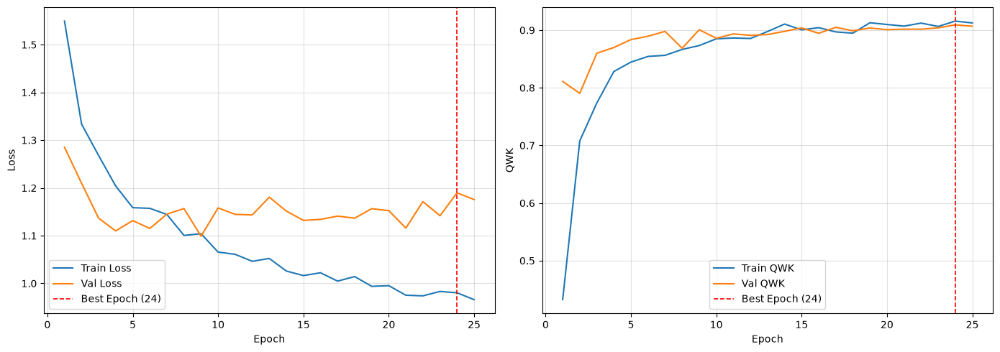

✅ Training curves saved.
✅ Checkpoint loaded.

QWK      : 0.9092
Accuracy : 0.8281
AUC (OvR): 0.8826

                precision    recall  f1-score   support

        No DR     0.9914    0.9612    0.9761       361
         Mild     0.6087    0.5676    0.5874        74
     Moderate     0.7354    0.8200    0.7754       200
       Severe     0.4737    0.4615    0.4675        39
Proliferative     0.6792    0.6102    0.6429        59

     accuracy                         0.8281       733
    macro avg     0.6977    0.6841    0.6899       733
 weighted avg     0.8303    0.8281    0.8282       733



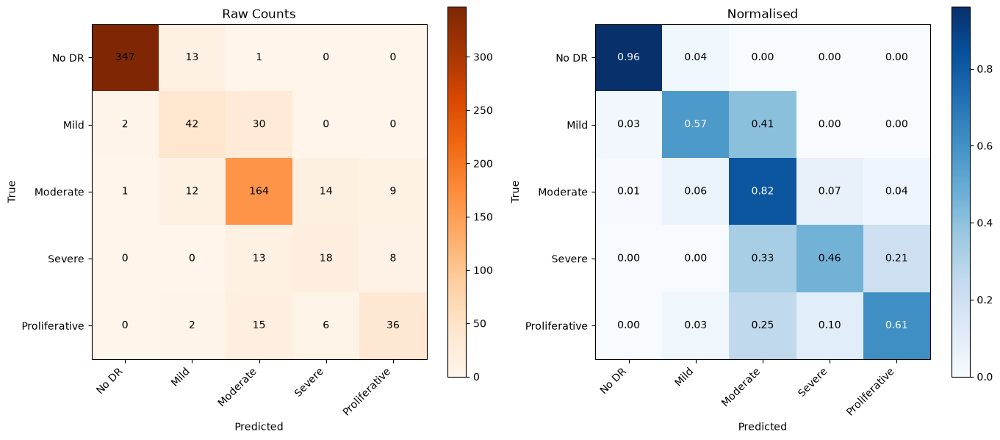

✅ Confusion matrix saved.


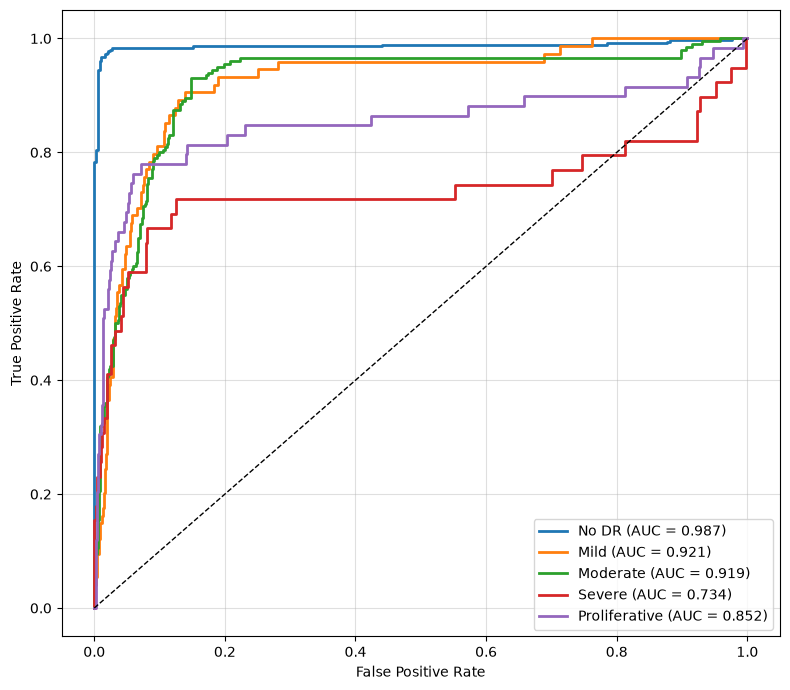

✅ ROC curves saved.

TABLE 6 — Ablation Study numbers:
  Model      : Dual-branch without LGAG
  QWK        : 0.9092
  Accuracy   : 0.8281
  AUC (OvR)  : 0.8826
  Params     : 46.91M
  ΔQWK vs EfficientNet-B4 only (0.8509) : +0.0583
  ΔQWK vs full LGA-Net       (0.9004)   :  0.0088


In [28]:
# evaluation matrices and graphes for dual branch , no LGAG
import os, torch
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.metrics import (cohen_kappa_score, roc_auc_score,
    confusion_matrix, classification_report, roc_curve, auc)
from sklearn.preprocessing import label_binarize

TRIAL_NAME  = "dual_branch_no_lgag"
NUM_CLASSES = 5
CLASS_NAMES = ['No DR', 'Mild', 'Moderate', 'Severe', 'Proliferative']
GRAPH_DIR   = os.path.join(BASE_DIR, "outputs_600dpi")
os.makedirs(GRAPH_DIR, exist_ok=True)

# ── STEP 1: Load history from CSV ────────────────────────────
history_df = pd.read_csv(os.path.join(WORK_DIR,
    f"{TRIAL_NAME}_history.csv"))
best_row   = history_df["val_qwk"].idxmax()
best_ep    = history_df.loc[best_row, "epoch"]
print(f"Best epoch: {best_ep}  Best Val QWK: {history_df['val_qwk'].max():.4f}")

# ── STEP 2: Training curves ───────────────────────────────────
fig, axes = plt.subplots(1, 2, figsize=(14, 5))
axes[0].plot(history_df["epoch"], history_df["train_loss"], label="Train Loss", linewidth=1.5)
axes[0].plot(history_df["epoch"], history_df["val_loss"],   label="Val Loss",   linewidth=1.5)
axes[0].axvline(best_ep, color='red', linestyle='--', linewidth=1.2, label=f"Best Epoch ({best_ep})")
axes[0].set_xlabel("Epoch"); axes[0].set_ylabel("Loss")
axes[0].legend(); axes[0].grid(True, alpha=0.4)

axes[1].plot(history_df["epoch"], history_df["train_qwk"], label="Train QWK", linewidth=1.5)
axes[1].plot(history_df["epoch"], history_df["val_qwk"],   label="Val QWK",   linewidth=1.5)
axes[1].axvline(best_ep, color='red', linestyle='--', linewidth=1.2, label=f"Best Epoch ({best_ep})")
axes[1].set_xlabel("Epoch"); axes[1].set_ylabel("QWK")
axes[1].legend(); axes[1].grid(True, alpha=0.4)

plt.tight_layout()
plt.savefig(os.path.join(GRAPH_DIR, f"{TRIAL_NAME}_curves.png"), dpi=600, bbox_inches='tight')
plt.show()
print("✅ Training curves saved.")

# ── STEP 3: Load model and run evaluation ────────────────────
# Need to define DualBranchNoLGAG class first
# Copy the class definition from your script above, then:

model_eval = DualBranchNoLGAG(num_classes=NUM_CLASSES).to(device)
model_eval.load_state_dict(torch.load(
    os.path.join(WORK_DIR, f"{TRIAL_NAME}_best.pth"),
    map_location=device))
model_eval.eval()
print("✅ Checkpoint loaded.")

all_preds, all_labels, all_probs = [], [], []
with torch.no_grad():
    for imgs, labels in aptos_val_loader:
        imgs   = imgs.to(device)
        logits = model_eval(imgs)
        probs  = torch.softmax(logits, dim=1)
        all_probs.extend(probs.cpu().numpy())
        all_preds.extend(torch.argmax(logits, 1).cpu().numpy())
        all_labels.extend(labels.numpy())

all_labels = np.array(all_labels)
all_preds  = np.array(all_preds)
all_probs  = np.array(all_probs)

qwk      = cohen_kappa_score(all_labels, all_preds, weights='quadratic')
accuracy = (all_labels == all_preds).mean()
auc_ovr  = roc_auc_score(all_labels, all_probs, multi_class='ovr')
cm       = confusion_matrix(all_labels, all_preds)
cm_pct   = cm.astype(float) / cm.sum(axis=1, keepdims=True)
y_bin    = label_binarize(all_labels, classes=list(range(NUM_CLASSES)))

print(f"\nQWK      : {qwk:.4f}")
print(f"Accuracy : {accuracy:.4f}")
print(f"AUC (OvR): {auc_ovr:.4f}")
print("\n", classification_report(all_labels, all_preds,
      target_names=CLASS_NAMES, digits=4))

# ── STEP 4: Confusion matrices ────────────────────────────────
fig, axes = plt.subplots(1, 2, figsize=(14, 6))
for ax, mat, title, cmap in zip(
        axes,
        [cm,     cm_pct],
        ["Raw Counts", "Normalised"],
        ["Oranges",    "Blues"]):
    im = ax.imshow(mat, interpolation='nearest', cmap=cmap)
    ax.set_title(title, fontsize=12)
    ax.set_xlabel("Predicted"); ax.set_ylabel("True")
    ax.set_xticks(range(NUM_CLASSES)); ax.set_yticks(range(NUM_CLASSES))
    ax.set_xticklabels(CLASS_NAMES, rotation=45, ha='right')
    ax.set_yticklabels(CLASS_NAMES)
    for i in range(NUM_CLASSES):
        for j in range(NUM_CLASSES):
            val   = mat[i, j]
            txt   = f"{val:.2f}" if title == "Normalised" else str(val)
            color = "white" if (title == "Normalised" and val > 0.5) else "black"
            ax.text(j, i, txt, ha='center', va='center', fontsize=10, color=color)
    plt.colorbar(im, ax=ax)

plt.tight_layout()
plt.savefig(os.path.join(GRAPH_DIR, f"{TRIAL_NAME}_confusion_matrix.png"), dpi=600, bbox_inches='tight')
plt.show()
print("✅ Confusion matrix saved.")

# ── STEP 5: ROC curves ────────────────────────────────────────
colors_roc = ['#1f77b4','#ff7f0e','#2ca02c','#d62728','#9467bd']
fig, ax = plt.subplots(figsize=(8, 7))
for c in range(NUM_CLASSES):
    fpr, tpr, _ = roc_curve(y_bin[:, c], all_probs[:, c])
    roc_auc_val = auc(fpr, tpr)
    ax.plot(fpr, tpr, color=colors_roc[c], lw=2,
            label=f"{CLASS_NAMES[c]} (AUC = {roc_auc_val:.3f})")
ax.plot([0,1],[0,1],'k--', lw=1)
ax.set_xlabel("False Positive Rate"); ax.set_ylabel("True Positive Rate")
ax.legend(loc='lower right'); ax.grid(True, alpha=0.4)
plt.tight_layout()
plt.savefig(os.path.join(GRAPH_DIR, f"{TRIAL_NAME}_roc_curves.png"), dpi=600, bbox_inches='tight')
plt.show()
print("✅ ROC curves saved.")

# ── STEP 6: Summary for paper ─────────────────────────────────
total_params = sum(p.numel() for p in model_eval.parameters())
print("\n" + "=" * 65)
print("TABLE 6 — Ablation Study numbers:")
print("=" * 65)
print(f"  Model      : Dual-branch without LGAG")
print(f"  QWK        : {qwk:.4f}")
print(f"  Accuracy   : {accuracy:.4f}")
print(f"  AUC (OvR)  : {auc_ovr:.4f}")
print(f"  Params     : {total_params/1e6:.2f}M")
print(f"  ΔQWK vs EfficientNet-B4 only (0.8509) : +{qwk-0.8509:.4f}")
# NOTE: 0.9004 is your re-run LGA-Net Val QWK after the bug fixes (was 0.8981 before)
print(f"  ΔQWK vs full LGA-Net       (0.9004)   :  {qwk-0.9004:.4f}")
print("=" * 65)

del model_eval
torch.cuda.empty_cache()

In [29]:
import os
os.environ["CUDA_VISIBLE_DEVICES"] = "2"

In [41]:
# ── BASELINE 1 — ResNet50 on APTOS (same split, same logging style) ──
import os
import time
import random
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import torch
import torch.nn as nn
import timm
from sklearn.metrics import cohen_kappa_score
# =========================================================
# CONFIG
# =========================================================
BASELINE_NAME = "resnet50_aptos_baseline"
NUM_CLASSES = 5
# reproducibility — was missing
def set_seed(seed=42):
    random.seed(seed)
    np.random.seed(seed)
    torch.manual_seed(seed)
    torch.cuda.manual_seed_all(seed)
set_seed(42)
# =========================================================
# MODEL
# =========================================================
resnet_model = timm.create_model(
    'resnet50',
    pretrained=True,
    num_classes=NUM_CLASSES
).to(device)
total_params = sum(p.numel() for p in resnet_model.parameters())
trainable_params = sum(p.numel() for p in resnet_model.parameters() if p.requires_grad)
print(f"{BASELINE_NAME} total params: {total_params:,}")
print(f"{BASELINE_NAME} trainable params: {trainable_params:,}")
# =========================================================
# CLASS WEIGHTS
# =========================================================
class_counts = train_aptos['diagnosis'].value_counts().sort_index()
print("\nAPTOS train class counts:")
print(class_counts)
class_weights = 1.0 / class_counts.values.astype(np.float32)
class_weights = class_weights / class_weights.sum() * len(class_weights)
class_weights = torch.tensor(class_weights, dtype=torch.float32).to(device)
print("\nClass weights:")
print(class_weights)
# =========================================================
# LOSS / OPTIMIZER / SCHEDULER
# =========================================================
criterion = nn.CrossEntropyLoss(weight=class_weights, label_smoothing=0.05)
optimizer = torch.optim.AdamW(
    resnet_model.parameters(),
    lr=5e-5,
    weight_decay=1e-4
)
EPOCHS = 25
PATIENCE = 7      # standardized — matches LGA-Net Stage 2 / CV / all other baselines
scheduler = torch.optim.lr_scheduler.CosineAnnealingLR(
    optimizer,
    T_max=EPOCHS,   # tied to EPOCHS so it always matches the actual budget
    eta_min=1e-6
)
# =========================================================
# TRAIN / VALIDATE FUNCTIONS
# =========================================================
def train_one_epoch_baseline(model, loader, optimizer, criterion, device):
    model.train()
    total_loss = 0.0
    all_preds, all_labels = [], []
    for imgs, labels in loader:
        imgs = imgs.to(device)
        labels = labels.to(device)
        optimizer.zero_grad()
        logits = model(imgs)
        loss = criterion(logits, labels)
        loss.backward()
        torch.nn.utils.clip_grad_norm_(model.parameters(), 1.0)
        optimizer.step()
        total_loss += loss.item()
        preds = torch.argmax(logits, dim=1)
        all_preds.extend(preds.detach().cpu().numpy())
        all_labels.extend(labels.detach().cpu().numpy())
    avg_loss = total_loss / len(loader)
    qwk = cohen_kappa_score(all_labels, all_preds, weights='quadratic')
    return avg_loss, qwk
def validate_one_epoch_baseline(model, loader, criterion, device):
    model.eval()
    total_loss = 0.0
    all_preds, all_labels = [], []
    with torch.no_grad():
        for imgs, labels in loader:
            imgs = imgs.to(device)
            labels = labels.to(device)
            logits = model(imgs)
            loss = criterion(logits, labels)
            total_loss += loss.item()
            preds = torch.argmax(logits, dim=1)
            all_preds.extend(preds.detach().cpu().numpy())
            all_labels.extend(labels.detach().cpu().numpy())
    avg_loss = total_loss / len(loader)
    qwk = cohen_kappa_score(all_labels, all_preds, weights='quadratic')
    return avg_loss, qwk
# =========================================================
# TRAINING LOOP
# =========================================================
print("\n" + "=" * 65)
print(f"TRAINING BASELINE — {BASELINE_NAME}")
print("=" * 65)
best_val_qwk = -1e9
best_val_loss = 1e9   # logged only now, does not drive checkpointing
no_improve = 0
stopped_epoch = EPOCHS
history = {
    'epoch': [], 'train_loss': [], 'val_loss': [],
    'train_qwk': [], 'val_qwk': [], 'lr': []
}
best_model_path = os.path.join(WORK_DIR, f"{BASELINE_NAME}_best.pth")
history_csv_path = os.path.join(WORK_DIR, f"{BASELINE_NAME}_history.csv")
for epoch in range(1, EPOCHS + 1):
    start = time.time()
    train_loss, train_qwk = train_one_epoch_baseline(
        resnet_model, aptos_train_loader, optimizer, criterion, device
    )
    val_loss, val_qwk = validate_one_epoch_baseline(
        resnet_model, aptos_val_loader, criterion, device
    )
    current_lr = optimizer.param_groups[0]['lr']
    scheduler.step()
    history['epoch'].append(epoch)
    history['train_loss'].append(train_loss)
    history['val_loss'].append(val_loss)
    history['train_qwk'].append(train_qwk)
    history['val_qwk'].append(val_qwk)
    history['lr'].append(current_lr)
    print(
        f"Epoch {epoch:02d}/{EPOCHS} | "
        f"Train Loss: {train_loss:.4f} | Train QWK: {train_qwk:.4f} | "
        f"Val Loss: {val_loss:.4f} | Val QWK: {val_qwk:.4f} | "
        f"LR: {current_lr:.6f} | Time: {time.time() - start:.1f}s"
    )
    # single criterion (val_qwk only) — no OR-logic with val_loss
    if val_qwk > best_val_qwk:
        best_val_qwk = val_qwk
        best_val_loss = val_loss
        no_improve = 0
        torch.save(resnet_model.state_dict(), best_model_path)
        print(f"  ✓ Best model saved | Best Val QWK: {best_val_qwk:.4f} | Best Val Loss: {best_val_loss:.4f}")
    else:
        no_improve += 1
        print(f"  No improvement {no_improve}/{PATIENCE}")
        if no_improve >= PATIENCE:
            stopped_epoch = epoch
            print(f"\n  Early stopping at epoch {epoch}")
            break
print("=" * 65)
history_df = pd.DataFrame(history)
history_df.to_csv(history_csv_path, index=False)
print("History saved to:", history_csv_path)
print(f"\n{BASELINE_NAME} complete!")
print(f"Early stopping at epoch: {stopped_epoch}")
print(f"Best Val QWK:            {best_val_qwk:.4f}")
print(f"Best Val Loss:           {best_val_loss:.4f}")
print(f"Model saved → {best_model_path}")

resnet50_aptos_baseline total params: 23,518,277
resnet50_aptos_baseline trainable params: 23,518,277

APTOS train class counts:
diagnosis
0    1444
1     296
2     799
3     154
4     236
Name: count, dtype: int64

Class weights:
tensor([0.2157, 1.0522, 0.3898, 2.0225, 1.3198], device='cuda:0')

TRAINING BASELINE — resnet50_aptos_baseline
Epoch 01/25 | Train Loss: 1.6700 | Train QWK: 0.3646 | Val Loss: 1.6093 | Val QWK: 0.3523 | LR: 0.000050 | Time: 142.4s
  ✓ Best model saved | Best Val QWK: 0.3523 | Best Val Loss: 1.6093
Epoch 02/25 | Train Loss: 1.4799 | Train QWK: 0.6316 | Val Loss: 1.3295 | Val QWK: 0.7730 | LR: 0.000050 | Time: 156.3s
  ✓ Best model saved | Best Val QWK: 0.7730 | Best Val Loss: 1.3295
Epoch 03/25 | Train Loss: 1.3447 | Train QWK: 0.7097 | Val Loss: 1.2626 | Val QWK: 0.7816 | LR: 0.000049 | Time: 153.3s
  ✓ Best model saved | Best Val QWK: 0.7816 | Best Val Loss: 1.2626
Epoch 04/25 | Train Loss: 1.2777 | Train QWK: 0.7472 | Val Loss: 1.2135 | Val QWK: 0.8032 | LR

Loaded        : /ssd4/ycheol/LGA_NET/outputs_v2/resnet50_aptos_baseline_history.csv
Best epoch    : 18
Best Val QWK  : 0.8773
Total epochs  : 25


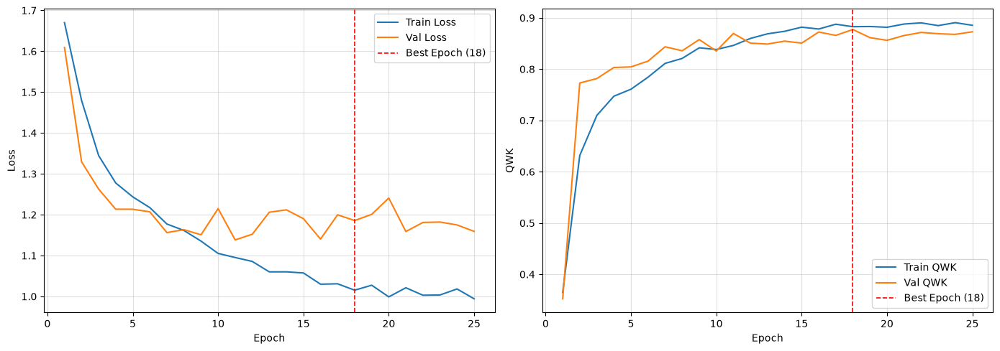


✅ Saved at 600 DPI → /ssd4/ycheol/LGA_NET/outputs_600dpi/resnet50_aptos_baseline_curves.png


In [42]:
#ResNet Loss Curves
import os, pandas as pd, matplotlib.pyplot as plt

# ── reads from saved CSV — no retraining needed ───────────────
BASELINE_NAME    = "resnet50_aptos_baseline"
history_csv_path = os.path.join(WORK_DIR, f"{BASELINE_NAME}_history.csv")

history_df = pd.read_csv(history_csv_path)
best_row   = history_df["val_qwk"].idxmax()
best_epoch = history_df.loc[best_row, "epoch"]
best_qwk   = history_df["val_qwk"].max()

print(f"Loaded        : {history_csv_path}")
print(f"Best epoch    : {best_epoch}")
print(f"Best Val QWK  : {best_qwk:.4f}")
print(f"Total epochs  : {len(history_df)}")

fig, axes = plt.subplots(1, 2, figsize=(14, 5))

axes[0].plot(history_df["epoch"], history_df["train_loss"],
             label="Train Loss", linewidth=1.5)
axes[0].plot(history_df["epoch"], history_df["val_loss"],
             label="Val Loss",   linewidth=1.5)
axes[0].axvline(x=best_epoch, color='red', linestyle='--',
                linewidth=1.2, label=f'Best Epoch ({best_epoch})')
axes[0].set_xlabel('Epoch'); axes[0].set_ylabel('Loss')
axes[0].legend(); axes[0].grid(True, alpha=0.4)

axes[1].plot(history_df["epoch"], history_df["train_qwk"],
             label="Train QWK", linewidth=1.5)
axes[1].plot(history_df["epoch"], history_df["val_qwk"],
             label="Val QWK",   linewidth=1.5)
axes[1].axvline(x=best_epoch, color='red', linestyle='--',
                linewidth=1.2, label=f'Best Epoch ({best_epoch})')
axes[1].set_xlabel('Epoch'); axes[1].set_ylabel('QWK')
axes[1].legend(); axes[1].grid(True, alpha=0.4)

plt.tight_layout()

GRAPH_DIR = os.path.join(BASE_DIR, "outputs_600dpi")
os.makedirs(GRAPH_DIR, exist_ok=True)

save_path = os.path.join(GRAPH_DIR, f"{BASELINE_NAME}_curves.png")
plt.savefig(save_path, dpi=600, bbox_inches='tight')
plt.show()
print(f"\n✅ Saved at 600 DPI → {save_path}")

Loaded ResNet50 model!

QWK      : 0.8773
Accuracy : 0.8063
AUC (OvR): 0.8929

Classification Report:
               precision    recall  f1-score   support

        No DR     0.9720    0.9612    0.9666       361
         Mild     0.5443    0.5811    0.5621        74
     Moderate     0.7696    0.7850    0.7772       200
       Severe     0.3478    0.4103    0.3765        39
Proliferative     0.5957    0.4746    0.5283        59

     accuracy                         0.8063       733
    macro avg     0.6459    0.6424    0.6421       733
 weighted avg     0.8101    0.8063    0.8074       733



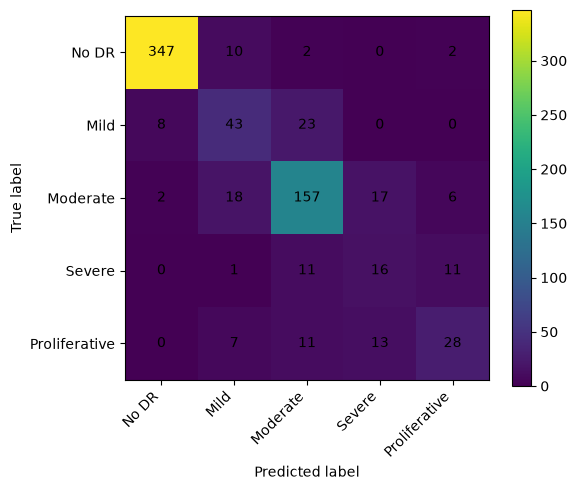

✅ Saved: /ssd4/ycheol/LGA_NET/outputs_600dpi/resnet50_confusion_matrix.png


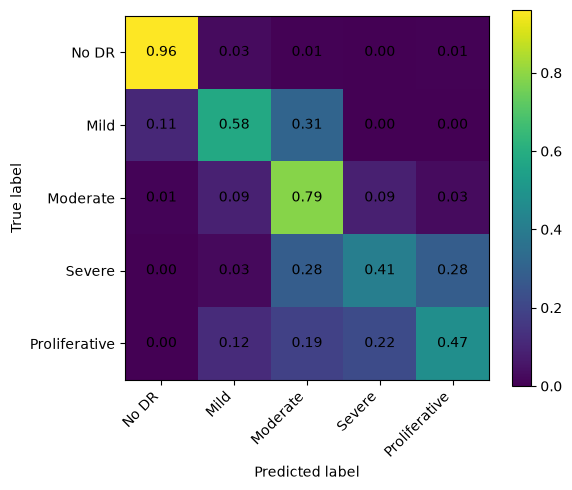

✅ Saved: /ssd4/ycheol/LGA_NET/outputs_600dpi/resnet50_confusion_matrix_normalized.png


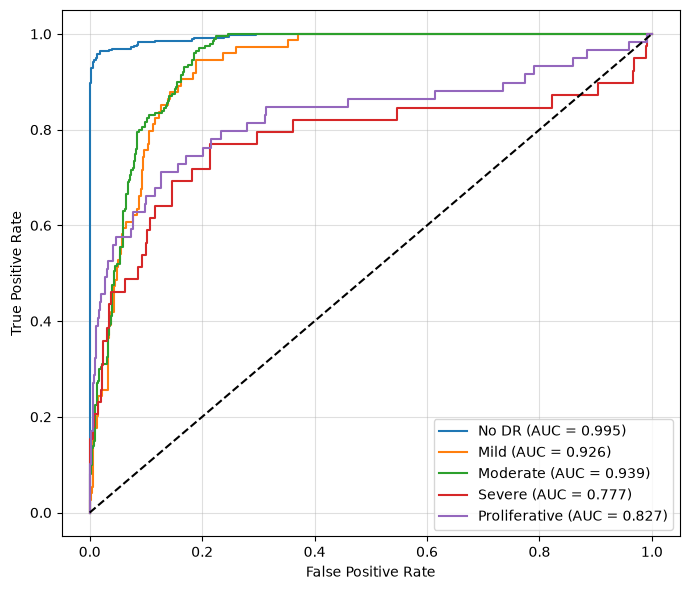

✅ Saved: /ssd4/ycheol/LGA_NET/outputs_600dpi/resnet50_roc_curves.png


In [43]:
# ── RESNET50 FINAL EVALUATION METRICS ────────────────────────
import os, torch
import numpy as np
import matplotlib.pyplot as plt
import timm
from sklearn.metrics import (cohen_kappa_score, confusion_matrix,
    classification_report, roc_auc_score, roc_curve, auc)
from sklearn.preprocessing import label_binarize

GRAPH_DIR = os.path.join(BASE_DIR, "outputs_600dpi")
os.makedirs(GRAPH_DIR, exist_ok=True)

classes    = ['No DR', 'Mild', 'Moderate', 'Severe', 'Proliferative']
tick_marks = np.arange(len(classes))

# ── LOAD BEST MODEL ───────────────────────────────────────────
model = timm.create_model('resnet50', pretrained=False, num_classes=5)
model.load_state_dict(torch.load(
    os.path.join(WORK_DIR, 'resnet50_aptos_baseline_best.pth'),
    map_location=device))
model = model.to(device)
model.eval()
print("Loaded ResNet50 model!")

# ── INFERENCE ─────────────────────────────────────────────────
all_preds, all_labels, all_probs = [], [], []
with torch.no_grad():
    for imgs, labels in aptos_val_loader:
        imgs   = imgs.to(device)
        logits = model(imgs)
        probs  = torch.softmax(logits, dim=1)
        all_probs.extend(probs.cpu().numpy())
        all_preds.extend(torch.argmax(logits, 1).cpu().numpy())
        all_labels.extend(labels.cpu().numpy())

all_probs  = np.array(all_probs)
all_preds  = np.array(all_preds)
all_labels = np.array(all_labels)

# ── METRICS ───────────────────────────────────────────────────
qwk       = cohen_kappa_score(all_labels, all_preds, weights='quadratic')
acc       = (all_labels == all_preds).mean()
cm        = confusion_matrix(all_labels, all_preds)
cm_norm   = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
auc_score = roc_auc_score(all_labels, all_probs, multi_class='ovr')
report    = classification_report(all_labels, all_preds,
                target_names=classes, digits=4)

print(f"\nQWK      : {qwk:.4f}")
print(f"Accuracy : {acc:.4f}")
print(f"AUC (OvR): {auc_score:.4f}")
print("\nClassification Report:")
print(report)

# ── PLOT 1: RAW CONFUSION MATRIX ─────────────────────────────
plt.figure(figsize=(6, 5))
plt.imshow(cm, interpolation='nearest')
plt.colorbar()
plt.xticks(tick_marks, classes, rotation=45, ha='right')
plt.yticks(tick_marks, classes)
for i in range(len(classes)):
    for j in range(len(classes)):
        plt.text(j, i, cm[i, j], ha="center", va="center", color="black")
plt.ylabel("True label"); plt.xlabel("Predicted label")
plt.tight_layout()
path = os.path.join(GRAPH_DIR, "resnet50_confusion_matrix.png")
plt.savefig(path, dpi=600, bbox_inches='tight')
plt.show()
print(f"✅ Saved: {path}")

# ── PLOT 2: NORMALISED CONFUSION MATRIX ───────────────────────
plt.figure(figsize=(6, 5))
plt.imshow(cm_norm, interpolation='nearest')
plt.colorbar()
plt.xticks(tick_marks, classes, rotation=45, ha='right')
plt.yticks(tick_marks, classes)
for i in range(len(classes)):
    for j in range(len(classes)):
        plt.text(j, i, f"{cm_norm[i, j]:.2f}", ha="center", va="center", color="black")
plt.ylabel("True label"); plt.xlabel("Predicted label")
plt.tight_layout()
path = os.path.join(GRAPH_DIR, "resnet50_confusion_matrix_normalized.png")
plt.savefig(path, dpi=600, bbox_inches='tight')
plt.show()
print(f"✅ Saved: {path}")

# ── PLOT 3: ROC CURVES ────────────────────────────────────────
y_true_bin = label_binarize(all_labels, classes=[0, 1, 2, 3, 4])
plt.figure(figsize=(7, 6))
for i in range(5):
    fpr, tpr, _ = roc_curve(y_true_bin[:, i], all_probs[:, i])
    roc_auc_val = auc(fpr, tpr)
    plt.plot(fpr, tpr, label=f"{classes[i]} (AUC = {roc_auc_val:.3f})")
plt.plot([0, 1], [0, 1], 'k--')
plt.xlabel("False Positive Rate"); plt.ylabel("True Positive Rate")
plt.legend(); plt.grid(True, alpha=0.4)
plt.tight_layout()
path = os.path.join(GRAPH_DIR, "resnet50_roc_curves.png")
plt.savefig(path, dpi=600, bbox_inches='tight')
plt.show()
print(f"✅ Saved: {path}")

In [47]:
import os
print("My process ID:", os.getpid())

My process ID: 2479636


In [44]:
# ── BASELINE 2 — MobileNetV2 on APTOS (same split, same logging style) ──
import os
import time
import random
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import torch
import torch.nn as nn
import timm
from sklearn.metrics import cohen_kappa_score
# =========================================================
# CONFIG
# =========================================================
BASELINE_NAME = "mobilenetv2_aptos_baseline"
NUM_CLASSES = 5
# reproducibility — was missing
def set_seed(seed=42):
    random.seed(seed)
    np.random.seed(seed)
    torch.manual_seed(seed)
    torch.cuda.manual_seed_all(seed)
set_seed(42)
# =========================================================
# MODEL
# =========================================================
mobilenet_model = timm.create_model(
    'mobilenetv2_100',
    pretrained=True,
    num_classes=NUM_CLASSES
).to(device)
total_params = sum(p.numel() for p in mobilenet_model.parameters())
trainable_params = sum(p.numel() for p in mobilenet_model.parameters() if p.requires_grad)
print(f"{BASELINE_NAME} total params: {total_params:,}")
print(f"{BASELINE_NAME} trainable params: {trainable_params:,}")
# =========================================================
# CLASS WEIGHTS
# =========================================================
class_counts = train_aptos['diagnosis'].value_counts().sort_index()
print("\nAPTOS train class counts:")
print(class_counts)
class_weights = 1.0 / class_counts.values.astype(np.float32)
class_weights = class_weights / class_weights.sum() * len(class_weights)
class_weights = torch.tensor(class_weights, dtype=torch.float32).to(device)
print("\nClass weights:")
print(class_weights)
# =========================================================
# LOSS / OPTIMIZER / SCHEDULER
# =========================================================
criterion = nn.CrossEntropyLoss(weight=class_weights, label_smoothing=0.05)
optimizer = torch.optim.AdamW(
    mobilenet_model.parameters(),
    lr=5e-5,
    weight_decay=1e-4
)
EPOCHS = 25
PATIENCE = 7     # standardized value — matches LGA-Net Stage 2 / CV / all other
                   # baselines / dual-branch-no-LGAG. (NOT 10 — that was the
                   # original, uncorrected value from before this session's fixes.)
scheduler = torch.optim.lr_scheduler.CosineAnnealingLR(
    optimizer,
    T_max=EPOCHS,   # tied to EPOCHS so it always matches the actual budget
    eta_min=1e-6
)
# =========================================================
# TRAIN / VALIDATE FUNCTIONS
# =========================================================
def train_one_epoch_baseline(model, loader, optimizer, criterion, device):
    model.train()
    total_loss = 0.0
    all_preds, all_labels = [], []
    for imgs, labels in loader:
        imgs = imgs.to(device)
        labels = labels.to(device)
        optimizer.zero_grad()
        logits = model(imgs)
        loss = criterion(logits, labels)
        loss.backward()
        torch.nn.utils.clip_grad_norm_(model.parameters(), 1.0)
        optimizer.step()
        total_loss += loss.item()
        preds = torch.argmax(logits, dim=1)
        all_preds.extend(preds.detach().cpu().numpy())
        all_labels.extend(labels.detach().cpu().numpy())
    avg_loss = total_loss / len(loader)
    qwk = cohen_kappa_score(all_labels, all_preds, weights='quadratic')
    return avg_loss, qwk
def validate_one_epoch_baseline(model, loader, criterion, device):
    model.eval()
    total_loss = 0.0
    all_preds, all_labels = [], []
    with torch.no_grad():
        for imgs, labels in loader:
            imgs = imgs.to(device)
            labels = labels.to(device)
            logits = model(imgs)
            loss = criterion(logits, labels)
            total_loss += loss.item()
            preds = torch.argmax(logits, dim=1)
            all_preds.extend(preds.detach().cpu().numpy())
            all_labels.extend(labels.detach().cpu().numpy())
    avg_loss = total_loss / len(loader)
    qwk = cohen_kappa_score(all_labels, all_preds, weights='quadratic')
    return avg_loss, qwk
# =========================================================
# TRAINING LOOP
# =========================================================
print("\n" + "=" * 65)
print(f"TRAINING BASELINE — {BASELINE_NAME}")
print("=" * 65)
best_val_qwk = -1e9
best_val_loss = 1e9   # logged only now, does not drive checkpointing
no_improve = 0
stopped_epoch = EPOCHS
history = {
    'epoch': [], 'train_loss': [], 'val_loss': [],
    'train_qwk': [], 'val_qwk': [], 'lr': []
}
best_model_path = os.path.join(WORK_DIR, f"{BASELINE_NAME}_best.pth")
history_csv_path = os.path.join(WORK_DIR, f"{BASELINE_NAME}_history.csv")
for epoch in range(1, EPOCHS + 1):
    start = time.time()
    train_loss, train_qwk = train_one_epoch_baseline(
        mobilenet_model, aptos_train_loader, optimizer, criterion, device
    )
    val_loss, val_qwk = validate_one_epoch_baseline(
        mobilenet_model, aptos_val_loader, criterion, device
    )
    current_lr = optimizer.param_groups[0]['lr']
    scheduler.step()
    history['epoch'].append(epoch)
    history['train_loss'].append(train_loss)
    history['val_loss'].append(val_loss)
    history['train_qwk'].append(train_qwk)
    history['val_qwk'].append(val_qwk)
    history['lr'].append(current_lr)
    print(
        f"Epoch {epoch:02d}/{EPOCHS} | "
        f"Train Loss: {train_loss:.4f} | Train QWK: {train_qwk:.4f} | "
        f"Val Loss: {val_loss:.4f} | Val QWK: {val_qwk:.4f} | "
        f"LR: {current_lr:.6f} | Time: {time.time() - start:.1f}s"
    )
    if val_qwk > best_val_qwk:
        best_val_qwk = val_qwk
        best_val_loss = val_loss   # logged only, not a save trigger
        no_improve = 0
        torch.save(mobilenet_model.state_dict(), best_model_path)
        print(f"  ✓ Best model saved (Val QWK: {best_val_qwk:.4f})")
    else:
        no_improve += 1
        if no_improve >= PATIENCE:
            stopped_epoch = epoch
            print(f"\n  Early stopping at epoch {epoch}")
            break
print("=" * 65)
history_df = pd.DataFrame(history)
history_df.to_csv(history_csv_path, index=False)
print("History saved to:", history_csv_path)
print(f"\n{BASELINE_NAME} training complete!")
print(f"Stopped epoch: {stopped_epoch}")
print(f"Best Val QWK:  {best_val_qwk:.4f}")
print(f"Model saved → {best_model_path}")

mobilenetv2_aptos_baseline total params: 2,230,277
mobilenetv2_aptos_baseline trainable params: 2,230,277

APTOS train class counts:
diagnosis
0    1444
1     296
2     799
3     154
4     236
Name: count, dtype: int64

Class weights:
tensor([0.2157, 1.0522, 0.3898, 2.0225, 1.3198], device='cuda:0')

TRAINING BASELINE — mobilenetv2_aptos_baseline
Epoch 01/25 | Train Loss: 1.8990 | Train QWK: 0.3607 | Val Loss: 1.6815 | Val QWK: 0.5986 | LR: 0.000050 | Time: 62.4s
  ✓ Best model saved (Val QWK: 0.5986)
Epoch 02/25 | Train Loss: 1.4161 | Train QWK: 0.6588 | Val Loss: 1.5902 | Val QWK: 0.7736 | LR: 0.000050 | Time: 64.1s
  ✓ Best model saved (Val QWK: 0.7736)
Epoch 03/25 | Train Loss: 1.3327 | Train QWK: 0.7184 | Val Loss: 1.5940 | Val QWK: 0.6968 | LR: 0.000049 | Time: 64.3s
Epoch 04/25 | Train Loss: 1.2537 | Train QWK: 0.7534 | Val Loss: 1.5848 | Val QWK: 0.7537 | LR: 0.000048 | Time: 64.4s
Epoch 05/25 | Train Loss: 1.2113 | Train QWK: 0.7770 | Val Loss: 1.5186 | Val QWK: 0.7238 | LR: 0

Loaded        : /ssd4/ycheol/LGA_NET/outputs_v2/mobilenetv2_aptos_baseline_history.csv
Best epoch    : 23
Best Val QWK  : 0.8395
Total epochs  : 25


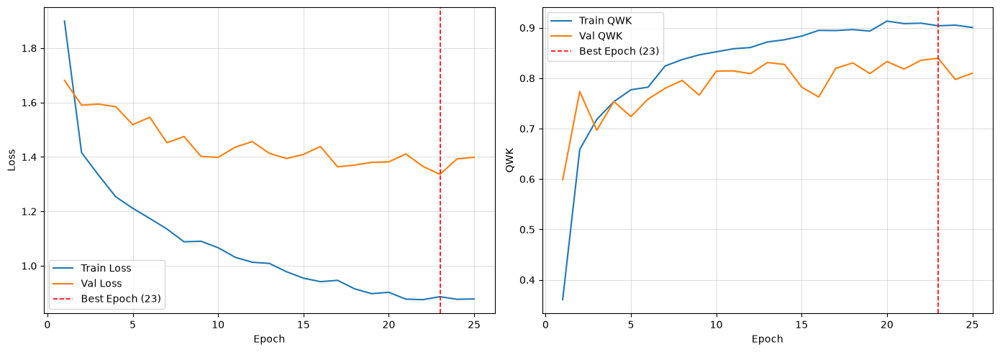


✅ Saved at 600 DPI → /ssd4/ycheol/LGA_NET/outputs_600dpi/mobilenetv2_aptos_baseline_curves.png


In [45]:
#MobilenetV2 Loss curves 600 dpi
import os, pandas as pd, matplotlib.pyplot as plt

# ── reads from saved CSV — no retraining needed ───────────────
BASELINE_NAME = "mobilenetv2_aptos_baseline" 
history_csv_path = os.path.join(WORK_DIR, f"{BASELINE_NAME}_history.csv")

history_df = pd.read_csv(history_csv_path)
best_row   = history_df["val_qwk"].idxmax()
best_epoch = history_df.loc[best_row, "epoch"]
best_qwk   = history_df["val_qwk"].max()

print(f"Loaded        : {history_csv_path}")
print(f"Best epoch    : {best_epoch}")
print(f"Best Val QWK  : {best_qwk:.4f}")
print(f"Total epochs  : {len(history_df)}")

fig, axes = plt.subplots(1, 2, figsize=(14, 5))

axes[0].plot(history_df["epoch"], history_df["train_loss"],
             label="Train Loss", linewidth=1.5)
axes[0].plot(history_df["epoch"], history_df["val_loss"],
             label="Val Loss",   linewidth=1.5)
axes[0].axvline(x=best_epoch, color='red', linestyle='--',
                linewidth=1.2, label=f'Best Epoch ({best_epoch})')
axes[0].set_xlabel('Epoch'); axes[0].set_ylabel('Loss')
axes[0].legend(); axes[0].grid(True, alpha=0.4)

axes[1].plot(history_df["epoch"], history_df["train_qwk"],
             label="Train QWK", linewidth=1.5)
axes[1].plot(history_df["epoch"], history_df["val_qwk"],
             label="Val QWK",   linewidth=1.5)
axes[1].axvline(x=best_epoch, color='red', linestyle='--',
                linewidth=1.2, label=f'Best Epoch ({best_epoch})')
axes[1].set_xlabel('Epoch'); axes[1].set_ylabel('QWK')
axes[1].legend(); axes[1].grid(True, alpha=0.4)

plt.tight_layout()

GRAPH_DIR = os.path.join(BASE_DIR, "outputs_600dpi")
os.makedirs(GRAPH_DIR, exist_ok=True)

save_path = os.path.join(GRAPH_DIR, f"{BASELINE_NAME}_curves.png")
plt.savefig(save_path, dpi=600, bbox_inches='tight')
plt.show()
print(f"\n✅ Saved at 600 DPI → {save_path}")

Loaded MobileNetV2 model!

QWK      : 0.8395
Accuracy : 0.7763
AUC (OvR): 0.8548

Classification Report:
               precision    recall  f1-score   support

        No DR     0.9504    0.9557    0.9530       361
         Mild     0.4516    0.5676    0.5030        74
     Moderate     0.7320    0.7100    0.7208       200
       Severe     0.3659    0.3846    0.3750        39
Proliferative     0.5952    0.4237    0.4950        59

     accuracy                         0.7763       733
    macro avg     0.6190    0.6083    0.6094       733
 weighted avg     0.7808    0.7763    0.7766       733

✅ Results text saved.


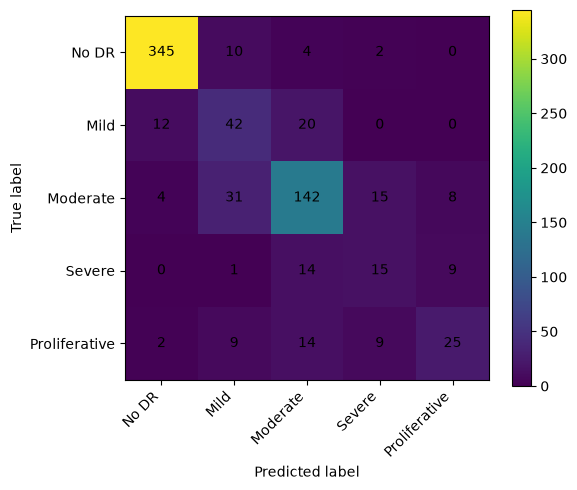

✅ Saved: /ssd4/ycheol/LGA_NET/outputs_600dpi/mobilenetv2_confusion_matrix.png


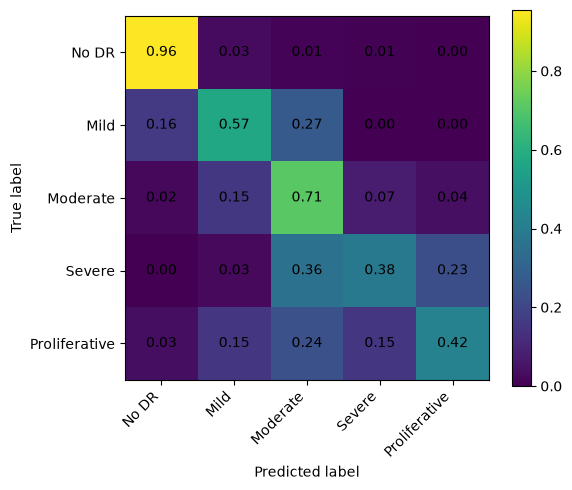

✅ Saved: /ssd4/ycheol/LGA_NET/outputs_600dpi/mobilenetv2_confusion_matrix_normalized.png


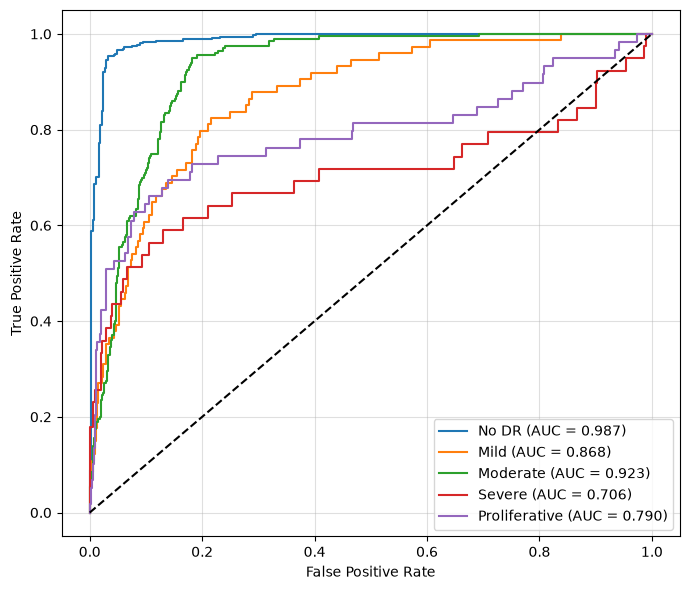

✅ Saved: /ssd4/ycheol/LGA_NET/outputs_600dpi/mobilenetv2_roc_curves.png


In [46]:
# ── MobileNetV2 FINAL EVALUATION METRICS ─────────────────────
import os, torch
import numpy as np
import matplotlib.pyplot as plt
import timm
from sklearn.metrics import (cohen_kappa_score, confusion_matrix,
    classification_report, roc_auc_score, roc_curve, auc)
from sklearn.preprocessing import label_binarize

GRAPH_DIR = os.path.join(BASE_DIR, "outputs_600dpi")
os.makedirs(GRAPH_DIR, exist_ok=True)

classes    = ['No DR', 'Mild', 'Moderate', 'Severe', 'Proliferative']
tick_marks = np.arange(len(classes))

# ── LOAD BEST MODEL ───────────────────────────────────────────
model = timm.create_model('mobilenetv2_100', pretrained=False, num_classes=5)
model.load_state_dict(torch.load(
    os.path.join(WORK_DIR, 'mobilenetv2_aptos_baseline_best.pth'),
    map_location=device))
model = model.to(device)
model.eval()
print("Loaded MobileNetV2 model!")

# ── INFERENCE ─────────────────────────────────────────────────
all_preds, all_labels, all_probs = [], [], []
with torch.no_grad():
    for imgs, labels in aptos_val_loader:
        imgs   = imgs.to(device)
        logits = model(imgs)
        probs  = torch.softmax(logits, dim=1)
        all_probs.extend(probs.cpu().numpy())
        all_preds.extend(torch.argmax(logits, 1).cpu().numpy())
        all_labels.extend(labels.cpu().numpy())

all_probs  = np.array(all_probs)
all_preds  = np.array(all_preds)
all_labels = np.array(all_labels)

# ── METRICS ───────────────────────────────────────────────────
qwk       = cohen_kappa_score(all_labels, all_preds, weights='quadratic')
acc       = (all_labels == all_preds).mean()
cm        = confusion_matrix(all_labels, all_preds)
cm_norm   = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
auc_score = roc_auc_score(all_labels, all_probs, multi_class='ovr')
report    = classification_report(all_labels, all_preds,
                target_names=classes, digits=4)

print(f"\nQWK      : {qwk:.4f}")
print(f"Accuracy : {acc:.4f}")
print(f"AUC (OvR): {auc_score:.4f}")
print("\nClassification Report:")
print(report)

# ── SAVE TEXT RESULTS ─────────────────────────────────────────
with open(os.path.join(WORK_DIR, "mobilenetv2_results.txt"), "w") as f:
    f.write("MobileNetV2 Final Results\n" + "="*40 + "\n")
    f.write(f"QWK: {qwk:.4f}\nAccuracy: {acc:.4f}\nROC-AUC: {auc_score:.4f}\n\n")
    f.write("Confusion Matrix:\n" + str(cm) + "\n\nClassification Report:\n" + report)
print("✅ Results text saved.")

# ── PLOT 1: RAW CONFUSION MATRIX ─────────────────────────────
plt.figure(figsize=(6, 5))
plt.imshow(cm, interpolation='nearest')
plt.colorbar()
plt.xticks(tick_marks, classes, rotation=45, ha='right')
plt.yticks(tick_marks, classes)
for i in range(len(classes)):
    for j in range(len(classes)):
        plt.text(j, i, cm[i, j], ha="center", va="center", color="black")
plt.ylabel("True label"); plt.xlabel("Predicted label")
plt.tight_layout()
path = os.path.join(GRAPH_DIR, "mobilenetv2_confusion_matrix.png")
plt.savefig(path, dpi=600, bbox_inches='tight')
plt.show()
print(f"✅ Saved: {path}")

# ── PLOT 2: NORMALISED CONFUSION MATRIX ───────────────────────
plt.figure(figsize=(6, 5))
plt.imshow(cm_norm, interpolation='nearest')
plt.colorbar()
plt.xticks(tick_marks, classes, rotation=45, ha='right')
plt.yticks(tick_marks, classes)
for i in range(len(classes)):
    for j in range(len(classes)):
        plt.text(j, i, f"{cm_norm[i, j]:.2f}", ha="center", va="center", color="black")
plt.ylabel("True label"); plt.xlabel("Predicted label")
plt.tight_layout()
path = os.path.join(GRAPH_DIR, "mobilenetv2_confusion_matrix_normalized.png")
plt.savefig(path, dpi=600, bbox_inches='tight')
plt.show()
print(f"✅ Saved: {path}")

# ── PLOT 3: ROC CURVES ────────────────────────────────────────
y_true_bin = label_binarize(all_labels, classes=[0, 1, 2, 3, 4])
plt.figure(figsize=(7, 6))
for i in range(5):
    fpr, tpr, _ = roc_curve(y_true_bin[:, i], all_probs[:, i])
    roc_auc_val = auc(fpr, tpr)
    plt.plot(fpr, tpr, label=f"{classes[i]} (AUC = {roc_auc_val:.3f})")
plt.plot([0, 1], [0, 1], 'k--')
plt.xlabel("False Positive Rate"); plt.ylabel("True Positive Rate")
plt.legend(); plt.grid(True, alpha=0.4)
plt.tight_layout()
path = os.path.join(GRAPH_DIR, "mobilenetv2_roc_curves.png")
plt.savefig(path, dpi=600, bbox_inches='tight')
plt.show()
print(f"✅ Saved: {path}")

In [48]:
# ── BASELINE 3 — EfficientNet-B4 on APTOS (same split, same logging style) ──
import os
import time
import random
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import torch
import torch.nn as nn
import timm
from sklearn.metrics import cohen_kappa_score
# =========================================================
# CONFIG
# =========================================================
BASELINE_NAME = "efficientnetb4_aptos_baseline"
NUM_CLASSES = 5
# reproducibility — was missing
def set_seed(seed=42):
    random.seed(seed)
    np.random.seed(seed)
    torch.manual_seed(seed)
    torch.cuda.manual_seed_all(seed)
set_seed(42)
# =========================================================
# MODEL
# =========================================================
efficientnet_model = timm.create_model(
    'efficientnet_b4',
    pretrained=True,
    num_classes=NUM_CLASSES
).to(device)
total_params = sum(p.numel() for p in efficientnet_model.parameters())
trainable_params = sum(p.numel() for p in efficientnet_model.parameters() if p.requires_grad)
print(f"{BASELINE_NAME} total params: {total_params:,}")
print(f"{BASELINE_NAME} trainable params: {trainable_params:,}")
# =========================================================
# CLASS WEIGHTS
# =========================================================
class_counts = train_aptos['diagnosis'].value_counts().sort_index()
print("\nAPTOS train class counts:")
print(class_counts)
class_weights = 1.0 / class_counts.values.astype(np.float32)
class_weights = class_weights / class_weights.sum() * len(class_weights)
class_weights = torch.tensor(class_weights, dtype=torch.float32).to(device)
print("\nClass weights:")
print(class_weights)
# =========================================================
# LOSS / OPTIMIZER / SCHEDULER
# =========================================================
criterion = nn.CrossEntropyLoss(weight=class_weights, label_smoothing=0.05)
optimizer = torch.optim.AdamW(
    efficientnet_model.parameters(),
    lr=5e-5,
    weight_decay=1e-4
)
EPOCHS = 25
PATIENCE = 7      # standardized — matches LGA-Net Stage 2 / CV / all other baselines
scheduler = torch.optim.lr_scheduler.CosineAnnealingLR(
    optimizer,
    T_max=EPOCHS,   # tied to EPOCHS so it always matches the actual budget
    eta_min=1e-6
)
# =========================================================
# TRAIN / VALIDATE FUNCTIONS
# =========================================================
def train_one_epoch_baseline(model, loader, optimizer, criterion, device):
    model.train()
    total_loss = 0.0
    all_preds, all_labels = [], []
    for imgs, labels in loader:
        imgs = imgs.to(device)
        labels = labels.to(device)
        optimizer.zero_grad()
        logits = model(imgs)
        loss = criterion(logits, labels)
        loss.backward()
        torch.nn.utils.clip_grad_norm_(model.parameters(), 1.0)
        optimizer.step()
        total_loss += loss.item()
        preds = torch.argmax(logits, dim=1)
        all_preds.extend(preds.detach().cpu().numpy())
        all_labels.extend(labels.detach().cpu().numpy())
    avg_loss = total_loss / len(loader)
    qwk = cohen_kappa_score(all_labels, all_preds, weights='quadratic')
    return avg_loss, qwk
def validate_one_epoch_baseline(model, loader, criterion, device):
    model.eval()
    total_loss = 0.0
    all_preds, all_labels = [], []
    with torch.no_grad():
        for imgs, labels in loader:
            imgs = imgs.to(device)
            labels = labels.to(device)
            logits = model(imgs)
            loss = criterion(logits, labels)
            total_loss += loss.item()
            preds = torch.argmax(logits, dim=1)
            all_preds.extend(preds.detach().cpu().numpy())
            all_labels.extend(labels.detach().cpu().numpy())
    avg_loss = total_loss / len(loader)
    qwk = cohen_kappa_score(all_labels, all_preds, weights='quadratic')
    return avg_loss, qwk
# =========================================================
# TRAINING LOOP
# =========================================================
print("\n" + "=" * 65)
print(f"TRAINING BASELINE — {BASELINE_NAME}")
print("=" * 65)
best_val_qwk = -1e9
best_val_loss = 1e9   # logged only now, does not drive checkpointing
no_improve = 0
stopped_epoch = EPOCHS
history = {
    'epoch': [], 'train_loss': [], 'val_loss': [],
    'train_qwk': [], 'val_qwk': [], 'lr': []
}
best_model_path = os.path.join(WORK_DIR, f"{BASELINE_NAME}_best.pth")
history_csv_path = os.path.join(WORK_DIR, f"{BASELINE_NAME}_history.csv")
for epoch in range(1, EPOCHS + 1):
    start = time.time()
    train_loss, train_qwk = train_one_epoch_baseline(
        efficientnet_model, aptos_train_loader, optimizer, criterion, device
    )
    val_loss, val_qwk = validate_one_epoch_baseline(
        efficientnet_model, aptos_val_loader, criterion, device
    )
    current_lr = optimizer.param_groups[0]['lr']
    scheduler.step()
    history['epoch'].append(epoch)
    history['train_loss'].append(train_loss)
    history['val_loss'].append(val_loss)
    history['train_qwk'].append(train_qwk)
    history['val_qwk'].append(val_qwk)
    history['lr'].append(current_lr)
    print(
        f"Epoch {epoch:02d}/{EPOCHS} | "
        f"Train Loss: {train_loss:.4f} | Train QWK: {train_qwk:.4f} | "
        f"Val Loss: {val_loss:.4f} | Val QWK: {val_qwk:.4f} | "
        f"LR: {current_lr:.6f} | Time: {time.time() - start:.1f}s"
    )
    # single criterion (val_qwk only) — no OR-logic with val_loss
    if val_qwk > best_val_qwk:
        best_val_qwk = val_qwk
        best_val_loss = val_loss
        no_improve = 0
        torch.save(efficientnet_model.state_dict(), best_model_path)
        print(f"  ✓ Best model saved | Best Val QWK: {best_val_qwk:.4f} | Val Loss at this epoch: {val_loss:.4f}")
    else:
        no_improve += 1
        print(f"  No improvement {no_improve}/{PATIENCE}")
        if no_improve >= PATIENCE:
            stopped_epoch = epoch
            print(f"\n  Early stopping triggered at epoch {epoch}")
            break
print("=" * 65)
history_df = pd.DataFrame(history)
history_df.to_csv(history_csv_path, index=False)
print("History saved to:", history_csv_path)
print(f"\n{BASELINE_NAME} complete!")
print(f"Early stopping at epoch: {stopped_epoch}")
print(f"Best Val QWK:            {best_val_qwk:.4f}")
print(f"Best Val Loss (logged, not selection criterion): {best_val_loss:.4f}")
print(f"Model saved → {best_model_path}")

efficientnetb4_aptos_baseline total params: 17,557,581
efficientnetb4_aptos_baseline trainable params: 17,557,581

APTOS train class counts:
diagnosis
0    1444
1     296
2     799
3     154
4     236
Name: count, dtype: int64

Class weights:
tensor([0.2157, 1.0522, 0.3898, 2.0225, 1.3198], device='cuda:0')

TRAINING BASELINE — efficientnetb4_aptos_baseline
Epoch 01/25 | Train Loss: 1.5647 | Train QWK: 0.5175 | Val Loss: 1.4779 | Val QWK: 0.6727 | LR: 0.000050 | Time: 68.0s
  ✓ Best model saved | Best Val QWK: 0.6727 | Val Loss at this epoch: 1.4779
Epoch 02/25 | Train Loss: 1.3006 | Train QWK: 0.7410 | Val Loss: 1.4157 | Val QWK: 0.7615 | LR: 0.000050 | Time: 68.3s
  ✓ Best model saved | Best Val QWK: 0.7615 | Val Loss at this epoch: 1.4157
Epoch 03/25 | Train Loss: 1.2058 | Train QWK: 0.8113 | Val Loss: 1.4198 | Val QWK: 0.7910 | LR: 0.000049 | Time: 67.8s
  ✓ Best model saved | Best Val QWK: 0.7910 | Val Loss at this epoch: 1.4198
Epoch 04/25 | Train Loss: 1.1455 | Train QWK: 0.8189

Loaded        : /ssd4/ycheol/LGA_NET/outputs_v2/efficientnetb4_aptos_baseline_history.csv
Best epoch    : 17
Best Val QWK  : 0.8698
Total epochs  : 24


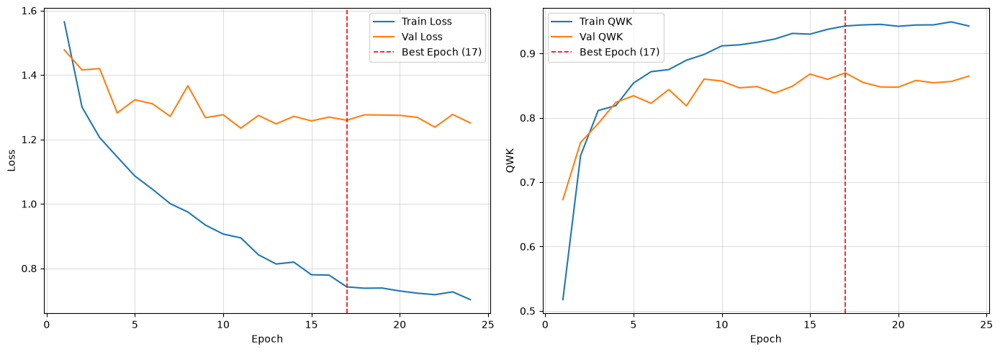


✅ Saved at 600 DPI → /ssd4/ycheol/LGA_NET/outputs_600dpi/efficientnetb4_aptos_baseline_curves.png


In [49]:
# EfficientNet-B4 loss graph 600dpi
import os, pandas as pd, matplotlib.pyplot as plt

# ── reads from saved CSV — no retraining needed ───────────────
BASELINE_NAME = "efficientnetb4_aptos_baseline"
history_csv_path = os.path.join(WORK_DIR, f"{BASELINE_NAME}_history.csv")

history_df = pd.read_csv(history_csv_path)
best_row   = history_df["val_qwk"].idxmax()
best_epoch = history_df.loc[best_row, "epoch"]
best_qwk   = history_df["val_qwk"].max()

print(f"Loaded        : {history_csv_path}")
print(f"Best epoch    : {best_epoch}")
print(f"Best Val QWK  : {best_qwk:.4f}")
print(f"Total epochs  : {len(history_df)}")

fig, axes = plt.subplots(1, 2, figsize=(14, 5))

axes[0].plot(history_df["epoch"], history_df["train_loss"],
             label="Train Loss", linewidth=1.5)
axes[0].plot(history_df["epoch"], history_df["val_loss"],
             label="Val Loss",   linewidth=1.5)
axes[0].axvline(x=best_epoch, color='red', linestyle='--',
                linewidth=1.2, label=f'Best Epoch ({best_epoch})')
axes[0].set_xlabel('Epoch'); axes[0].set_ylabel('Loss')
axes[0].legend(); axes[0].grid(True, alpha=0.4)

axes[1].plot(history_df["epoch"], history_df["train_qwk"],
             label="Train QWK", linewidth=1.5)
axes[1].plot(history_df["epoch"], history_df["val_qwk"],
             label="Val QWK",   linewidth=1.5)
axes[1].axvline(x=best_epoch, color='red', linestyle='--',
                linewidth=1.2, label=f'Best Epoch ({best_epoch})')
axes[1].set_xlabel('Epoch'); axes[1].set_ylabel('QWK')
axes[1].legend(); axes[1].grid(True, alpha=0.4)

plt.tight_layout()

GRAPH_DIR = os.path.join(BASE_DIR, "outputs_600dpi")
os.makedirs(GRAPH_DIR, exist_ok=True)

save_path = os.path.join(GRAPH_DIR, f"{BASELINE_NAME}_curves.png")
plt.savefig(save_path, dpi=600, bbox_inches='tight')
plt.show()
print(f"\n✅ Saved at 600 DPI → {save_path}")

Loaded EfficientNet-B4 model!

QWK      : 0.8698
Accuracy : 0.7981
AUC (OvR): 0.8449

Classification Report:
               precision    recall  f1-score   support

        No DR     0.9694    0.9668    0.9681       361
         Mild     0.5176    0.5946    0.5535        74
     Moderate     0.7592    0.7250    0.7417       200
       Severe     0.4324    0.4103    0.4211        39
Proliferative     0.5167    0.5254    0.5210        59

     accuracy                         0.7981       733
    macro avg     0.6391    0.6444    0.6411       733
 weighted avg     0.8014    0.7981    0.7994       733

✅ Results text saved.


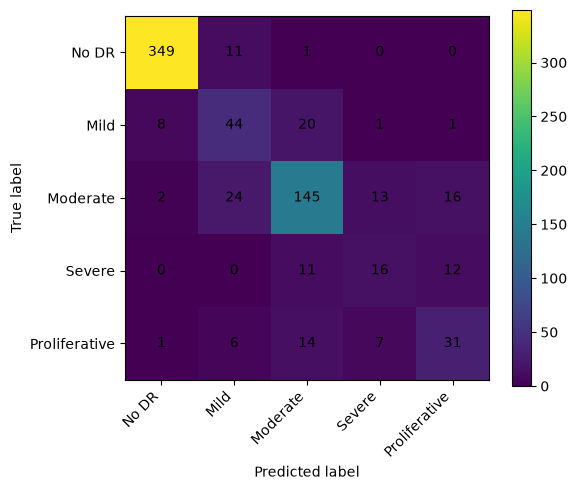

✅ Saved: /ssd4/ycheol/LGA_NET/outputs_600dpi/efficientnet_confusion_matrix.png


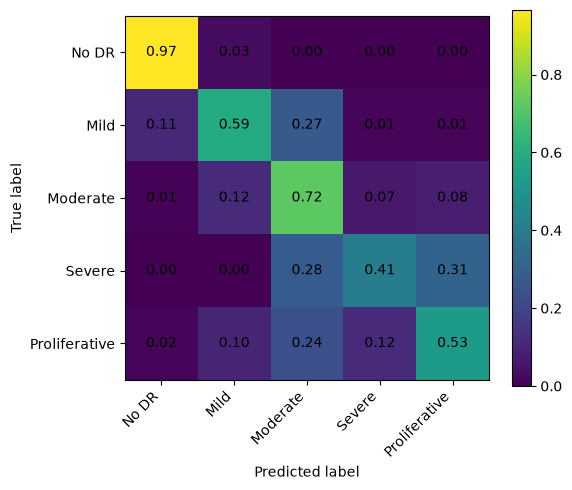

✅ Saved: /ssd4/ycheol/LGA_NET/outputs_600dpi/efficientnet_confusion_matrix_normalized.png


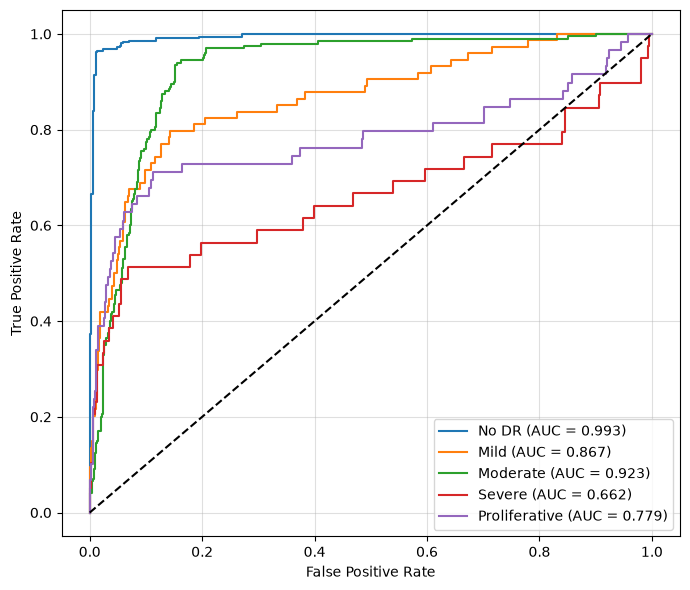

✅ Saved: /ssd4/ycheol/LGA_NET/outputs_600dpi/efficientnet_roc_curves.png


In [50]:
# ── EfficientNet-B4 FINAL EVALUATION METRICS ─────────────────
import os, torch
import numpy as np
import matplotlib.pyplot as plt
import timm
from sklearn.metrics import (cohen_kappa_score, confusion_matrix,
    classification_report, roc_auc_score, roc_curve, auc)
from sklearn.preprocessing import label_binarize

GRAPH_DIR = os.path.join(BASE_DIR, "outputs_600dpi")
os.makedirs(GRAPH_DIR, exist_ok=True)

classes    = ['No DR', 'Mild', 'Moderate', 'Severe', 'Proliferative']
tick_marks = np.arange(len(classes))

# ── LOAD BEST MODEL ───────────────────────────────────────────
model = timm.create_model('efficientnet_b4', pretrained=False, num_classes=5)
model.load_state_dict(torch.load(
    os.path.join(WORK_DIR, 'efficientnetb4_aptos_baseline_best.pth'),
    map_location=device))
model = model.to(device)
model.eval()
print("Loaded EfficientNet-B4 model!")

# ── INFERENCE ─────────────────────────────────────────────────
all_preds, all_labels, all_probs = [], [], []
with torch.no_grad():
    for imgs, labels in aptos_val_loader:
        imgs   = imgs.to(device)
        logits = model(imgs)
        probs  = torch.softmax(logits, dim=1)
        all_probs.extend(probs.cpu().numpy())
        all_preds.extend(torch.argmax(logits, 1).cpu().numpy())
        all_labels.extend(labels.cpu().numpy())

all_probs  = np.array(all_probs)
all_preds  = np.array(all_preds)
all_labels = np.array(all_labels)

# ── METRICS ───────────────────────────────────────────────────
qwk       = cohen_kappa_score(all_labels, all_preds, weights='quadratic')
acc       = (all_labels == all_preds).mean()
cm        = confusion_matrix(all_labels, all_preds)
cm_norm   = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
auc_score = roc_auc_score(all_labels, all_probs, multi_class='ovr')
report    = classification_report(all_labels, all_preds,
                target_names=classes, digits=4)

print(f"\nQWK      : {qwk:.4f}")
print(f"Accuracy : {acc:.4f}")
print(f"AUC (OvR): {auc_score:.4f}")
print("\nClassification Report:")
print(report)

# ── SAVE TEXT RESULTS ─────────────────────────────────────────
with open(os.path.join(WORK_DIR, "efficientnetb4_results.txt"), "w") as f:
    f.write("EfficientNet-B4 Final Results\n" + "="*40 + "\n")
    f.write(f"QWK: {qwk:.4f}\nAccuracy: {acc:.4f}\nROC-AUC: {auc_score:.4f}\n\n")
    f.write("Confusion Matrix:\n" + str(cm) + "\n\nClassification Report:\n" + report)
print("✅ Results text saved.")

# ── PLOT 1: RAW CONFUSION MATRIX ─────────────────────────────
plt.figure(figsize=(6, 5))
plt.imshow(cm)
plt.colorbar()
plt.xticks(tick_marks, classes, rotation=45, ha='right')
plt.yticks(tick_marks, classes)
for i in range(len(classes)):
    for j in range(len(classes)):
        plt.text(j, i, cm[i, j], ha="center", va="center")
plt.ylabel("True label"); plt.xlabel("Predicted label")
plt.tight_layout()
path = os.path.join(GRAPH_DIR, "efficientnet_confusion_matrix.png")
plt.savefig(path, dpi=600, bbox_inches='tight')
plt.show()
print(f"✅ Saved: {path}")

# ── PLOT 2: NORMALISED CONFUSION MATRIX ───────────────────────
plt.figure(figsize=(6, 5))
plt.imshow(cm_norm)
plt.colorbar()
plt.xticks(tick_marks, classes, rotation=45, ha='right')
plt.yticks(tick_marks, classes)
for i in range(len(classes)):
    for j in range(len(classes)):
        plt.text(j, i, f"{cm_norm[i, j]:.2f}", ha="center", va="center")
plt.ylabel("True label"); plt.xlabel("Predicted label")
plt.tight_layout()
path = os.path.join(GRAPH_DIR, "efficientnet_confusion_matrix_normalized.png")
plt.savefig(path, dpi=600, bbox_inches='tight')
plt.show()
print(f"✅ Saved: {path}")

# ── PLOT 3: ROC CURVES ────────────────────────────────────────
y_true_bin = label_binarize(all_labels, classes=[0, 1, 2, 3, 4])
plt.figure(figsize=(7, 6))
for i in range(5):
    fpr, tpr, _ = roc_curve(y_true_bin[:, i], all_probs[:, i])
    roc_auc_val = auc(fpr, tpr)
    plt.plot(fpr, tpr, label=f"{classes[i]} (AUC = {roc_auc_val:.3f})")
plt.plot([0, 1], [0, 1], 'k--')
plt.xlabel("False Positive Rate"); plt.ylabel("True Positive Rate")
plt.legend(); plt.grid(True, alpha=0.4)
plt.tight_layout()
path = os.path.join(GRAPH_DIR, "efficientnet_roc_curves.png")
plt.savefig(path, dpi=600, bbox_inches='tight')
plt.show()
print(f"✅ Saved: {path}")

In [51]:
# ── BASELINE 4 — Swin-Tiny on APTOS (same split, same logging style) ──
# NOTE: unlike the other three baselines, Swin-Tiny needs its own dedicated
# 224x224 loaders (its own train/val DataLoader objects) rather than reusing
# the shared aptos_train_loader/aptos_val_loader built at IMG_SIZE (380) --
# swin_tiny_patch4_window7_224 expects 224x224 input for its window
# partitioning to line up correctly. Batch size also drops to 4 to match
# what was used for its 5-fold CV, since the smaller batch was needed for
# memory headroom at this resolution/model combination.
import os
import time
import random
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import torch
import torch.nn as nn
import timm
from torchvision import transforms as T
from torch.utils.data import DataLoader
from sklearn.metrics import cohen_kappa_score
# =========================================================
# CONFIG
# =========================================================
BASELINE_NAME = "swin_tiny_aptos_baseline"  # matches Phase 11's expected filename exactly
NUM_CLASSES = 5
SWIN_IMG_SIZE = 224
SWIN_BATCH = 4
def set_seed(seed=42):
    random.seed(seed)
    np.random.seed(seed)
    torch.manual_seed(seed)
    torch.cuda.manual_seed_all(seed)
set_seed(42)
# =========================================================
# DEDICATED 224x224 LOADERS
# =========================================================
swin_train_tf = T.Compose([
    T.Resize((SWIN_IMG_SIZE, SWIN_IMG_SIZE)),
    T.RandomHorizontalFlip(), T.RandomVerticalFlip(), T.RandomRotation(20),
    T.ColorJitter(brightness=0.2, contrast=0.2, saturation=0.1),
    T.ToTensor(), T.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
])
swin_val_tf = T.Compose([
    T.Resize((SWIN_IMG_SIZE, SWIN_IMG_SIZE)),
    T.ToTensor(), T.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
])
swin_train_loader = DataLoader(
    APTOSDataset(train_aptos, APTOS_IMG, swin_train_tf), batch_size=SWIN_BATCH,
    shuffle=True, num_workers=NUM_WORKERS, pin_memory=PIN_MEMORY
)
swin_val_loader = DataLoader(
    APTOSDataset(val_aptos, APTOS_IMG, swin_val_tf), batch_size=SWIN_BATCH,
    shuffle=False, num_workers=NUM_WORKERS, pin_memory=PIN_MEMORY
)
# =========================================================
# MODEL
# =========================================================
swin_model = timm.create_model(
    'swin_tiny_patch4_window7_224',
    pretrained=True,
    num_classes=NUM_CLASSES
).to(device)
total_params = sum(p.numel() for p in swin_model.parameters())
trainable_params = sum(p.numel() for p in swin_model.parameters() if p.requires_grad)
print(f"{BASELINE_NAME} total params: {total_params:,}")
print(f"{BASELINE_NAME} trainable params: {trainable_params:,}")
# =========================================================
# CLASS WEIGHTS
# =========================================================
class_counts = train_aptos['diagnosis'].value_counts().sort_index()
print("\nAPTOS train class counts:")
print(class_counts)
class_weights = 1.0 / class_counts.values.astype(np.float32)
class_weights = class_weights / class_weights.sum() * len(class_weights)
class_weights = torch.tensor(class_weights, dtype=torch.float32).to(device)
print("\nClass weights:")
print(class_weights)
# =========================================================
# LOSS / OPTIMIZER / SCHEDULER
# =========================================================
criterion = nn.CrossEntropyLoss(weight=class_weights, label_smoothing=0.05)
optimizer = torch.optim.AdamW(
    swin_model.parameters(),
    lr=5e-5,
    weight_decay=1e-4
)
EPOCHS = 25
PATIENCE = 7      # standardized — matches LGA-Net Stage 2 / CV / all other baselines
                   # (NOT 5 — that was the original, uncorrected value)
scheduler = torch.optim.lr_scheduler.CosineAnnealingLR(
    optimizer,
    T_max=EPOCHS,   # tied to EPOCHS so it always matches the actual budget
    eta_min=1e-6
)
# =========================================================
# TRAIN / VALIDATE FUNCTIONS
# =========================================================
def train_one_epoch_baseline(model, loader, optimizer, criterion, device):
    model.train()
    total_loss = 0.0
    all_preds, all_labels = [], []
    for imgs, labels in loader:
        imgs = imgs.to(device)
        labels = labels.to(device)
        optimizer.zero_grad()
        logits = model(imgs)
        loss = criterion(logits, labels)
        loss.backward()
        torch.nn.utils.clip_grad_norm_(model.parameters(), 1.0)
        optimizer.step()
        total_loss += loss.item()
        preds = torch.argmax(logits, dim=1)
        all_preds.extend(preds.detach().cpu().numpy())
        all_labels.extend(labels.detach().cpu().numpy())
    avg_loss = total_loss / len(loader)
    qwk = cohen_kappa_score(all_labels, all_preds, weights='quadratic')
    return avg_loss, qwk
def validate_one_epoch_baseline(model, loader, criterion, device):
    model.eval()
    total_loss = 0.0
    all_preds, all_labels = [], []
    with torch.no_grad():
        for imgs, labels in loader:
            imgs = imgs.to(device)
            labels = labels.to(device)
            logits = model(imgs)
            loss = criterion(logits, labels)
            total_loss += loss.item()
            preds = torch.argmax(logits, dim=1)
            all_preds.extend(preds.detach().cpu().numpy())
            all_labels.extend(labels.detach().cpu().numpy())
    avg_loss = total_loss / len(loader)
    qwk = cohen_kappa_score(all_labels, all_preds, weights='quadratic')
    return avg_loss, qwk
# =========================================================
# TRAINING LOOP
# =========================================================
print("\n" + "=" * 65)
print(f"TRAINING BASELINE — {BASELINE_NAME}")
print("=" * 65)
best_val_qwk = -1e9
best_val_loss = 1e9   # logged only now, does not drive checkpointing
no_improve = 0
stopped_epoch = EPOCHS
history = {
    'epoch': [], 'train_loss': [], 'val_loss': [],
    'train_qwk': [], 'val_qwk': [], 'lr': []
}
best_model_path = os.path.join(WORK_DIR, f"{BASELINE_NAME}_best.pth")
history_csv_path = os.path.join(WORK_DIR, f"{BASELINE_NAME}_history.csv")
for epoch in range(1, EPOCHS + 1):
    start = time.time()
    train_loss, train_qwk = train_one_epoch_baseline(
        swin_model, swin_train_loader, optimizer, criterion, device
    )
    val_loss, val_qwk = validate_one_epoch_baseline(
        swin_model, swin_val_loader, criterion, device
    )
    current_lr = optimizer.param_groups[0]['lr']
    scheduler.step()
    history['epoch'].append(epoch)
    history['train_loss'].append(train_loss)
    history['val_loss'].append(val_loss)
    history['train_qwk'].append(train_qwk)
    history['val_qwk'].append(val_qwk)
    history['lr'].append(current_lr)
    print(
        f"Epoch {epoch:02d}/{EPOCHS} | "
        f"Train Loss: {train_loss:.4f} | Train QWK: {train_qwk:.4f} | "
        f"Val Loss: {val_loss:.4f} | Val QWK: {val_qwk:.4f} | "
        f"LR: {current_lr:.6f} | Time: {time.time() - start:.1f}s"
    )
    if val_qwk > best_val_qwk:
        best_val_qwk = val_qwk
        best_val_loss = val_loss   # logged only, not a save trigger
        no_improve = 0
        torch.save(swin_model.state_dict(), best_model_path)
        print(f"  ✓ Best model saved (Val QWK: {best_val_qwk:.4f})")
    else:
        no_improve += 1
        if no_improve >= PATIENCE:
            stopped_epoch = epoch
            print(f"\n  Early stopping at epoch {epoch}")
            break
print("=" * 65)
history_df = pd.DataFrame(history)
history_df.to_csv(history_csv_path, index=False)
print("History saved to:", history_csv_path)
print(f"\n{BASELINE_NAME} training complete!")
print(f"Stopped epoch: {stopped_epoch}")
print(f"Best Val QWK:  {best_val_qwk:.4f}")
print(f"Model saved → {best_model_path}")

swin_tiny_aptos_baseline total params: 27,523,199
swin_tiny_aptos_baseline trainable params: 27,523,199

APTOS train class counts:
diagnosis
0    1444
1     296
2     799
3     154
4     236
Name: count, dtype: int64

Class weights:
tensor([0.2157, 1.0522, 0.3898, 2.0225, 1.3198], device='cuda:0')

TRAINING BASELINE — swin_tiny_aptos_baseline
Epoch 01/25 | Train Loss: 1.3381 | Train QWK: 0.7485 | Val Loss: 1.1815 | Val QWK: 0.8428 | LR: 0.000050 | Time: 64.4s
  ✓ Best model saved (Val QWK: 0.8428)
Epoch 02/25 | Train Loss: 1.2028 | Train QWK: 0.8479 | Val Loss: 1.3539 | Val QWK: 0.8283 | LR: 0.000050 | Time: 64.0s
Epoch 03/25 | Train Loss: 1.1672 | Train QWK: 0.8620 | Val Loss: 1.1751 | Val QWK: 0.8570 | LR: 0.000049 | Time: 64.1s
  ✓ Best model saved (Val QWK: 0.8570)
Epoch 04/25 | Train Loss: 1.1225 | Train QWK: 0.8808 | Val Loss: 1.0995 | Val QWK: 0.8798 | LR: 0.000048 | Time: 64.4s
  ✓ Best model saved (Val QWK: 0.8798)
Epoch 05/25 | Train Loss: 1.1047 | Train QWK: 0.8868 | Val Los

Loaded        : /ssd4/ycheol/LGA_NET/outputs_v2/swin_tiny_aptos_baseline_history.csv
Best epoch    : 18
Best Val QWK  : 0.8944
Total epochs  : 25


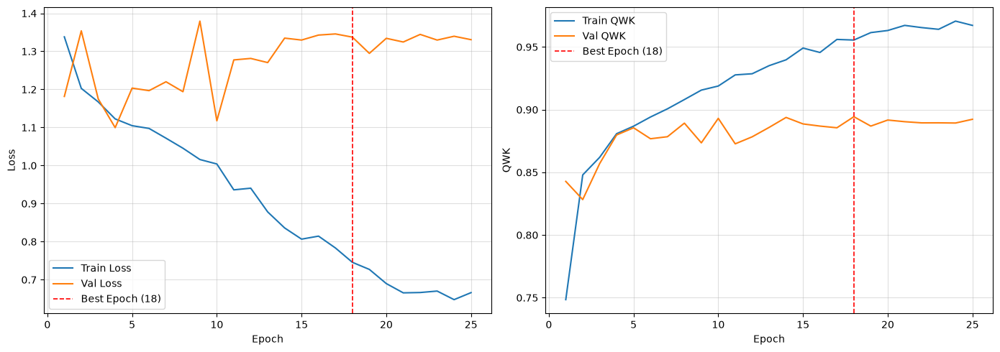


✅ Saved at 600 DPI → /ssd4/ycheol/LGA_NET/outputs_600dpi/swin_tiny_aptos_baseline_curves.png


In [52]:
#swimtiny loss curves 600dpi
import os, pandas as pd, matplotlib.pyplot as plt

# ── reads from saved CSV — no retraining needed ───────────────
BASELINE_NAME = "swin_tiny_aptos_baseline"  
history_csv_path = os.path.join(WORK_DIR, f"{BASELINE_NAME}_history.csv")

history_df = pd.read_csv(history_csv_path)
best_row   = history_df["val_qwk"].idxmax()
best_epoch = history_df.loc[best_row, "epoch"]
best_qwk   = history_df["val_qwk"].max()

print(f"Loaded        : {history_csv_path}")
print(f"Best epoch    : {best_epoch}")
print(f"Best Val QWK  : {best_qwk:.4f}")
print(f"Total epochs  : {len(history_df)}")

fig, axes = plt.subplots(1, 2, figsize=(14, 5))

axes[0].plot(history_df["epoch"], history_df["train_loss"],
             label="Train Loss", linewidth=1.5)
axes[0].plot(history_df["epoch"], history_df["val_loss"],
             label="Val Loss",   linewidth=1.5)
axes[0].axvline(x=best_epoch, color='red', linestyle='--',
                linewidth=1.2, label=f'Best Epoch ({best_epoch})')
axes[0].set_xlabel('Epoch'); axes[0].set_ylabel('Loss')
axes[0].legend(); axes[0].grid(True, alpha=0.4)

axes[1].plot(history_df["epoch"], history_df["train_qwk"],
             label="Train QWK", linewidth=1.5)
axes[1].plot(history_df["epoch"], history_df["val_qwk"],
             label="Val QWK",   linewidth=1.5)
axes[1].axvline(x=best_epoch, color='red', linestyle='--',
                linewidth=1.2, label=f'Best Epoch ({best_epoch})')
axes[1].set_xlabel('Epoch'); axes[1].set_ylabel('QWK')
axes[1].legend(); axes[1].grid(True, alpha=0.4)

plt.tight_layout()

GRAPH_DIR = os.path.join(BASE_DIR, "outputs_600dpi")
os.makedirs(GRAPH_DIR, exist_ok=True)

save_path = os.path.join(GRAPH_DIR, f"{BASELINE_NAME}_curves.png")
plt.savefig(save_path, dpi=600, bbox_inches='tight')
plt.show()
print(f"\n✅ Saved at 600 DPI → {save_path}")

In [53]:
# ── CREATE SWIN VAL LOADER (224×224) ─────────────────────────
from torchvision import transforms
from torch.utils.data import DataLoader

swin_val_transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize([0.485, 0.456, 0.406],
                         [0.229, 0.224, 0.225])
])

swin_aptos_val_ds = APTOSDataset(
    val_aptos,        # same val split used everywhere
    APTOS_IMG,
    transform=swin_val_transform
)

swin_aptos_val_loader = DataLoader(
    swin_aptos_val_ds,
    batch_size=4,
    shuffle=False,
    num_workers=NUM_WORKERS,
    pin_memory=PIN_MEMORY
)

imgs, labels = next(iter(swin_aptos_val_loader))
print(f"Swin val loader ready: {imgs.shape}  labels: {labels.shape}")

Swin val loader ready: torch.Size([4, 3, 224, 224])  labels: torch.Size([4])


Loaded Swin model.

QWK      : 0.8944
Accuracy : 0.8213
AUC (OvR): 0.7868

Classification Report:
               precision    recall  f1-score   support

        No DR     0.9915    0.9668    0.9790       361
         Mild     0.6000    0.5270    0.5612        74
     Moderate     0.7301    0.8250    0.7746       200
       Severe     0.4615    0.4615    0.4615        39
Proliferative     0.6078    0.5254    0.5636        59

     accuracy                         0.8213       733
    macro avg     0.6782    0.6611    0.6680       733
 weighted avg     0.8216    0.8213    0.8201       733



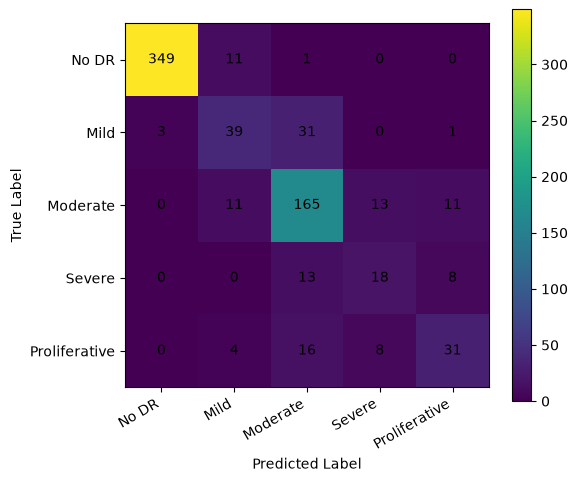

✅ Saved: /ssd4/ycheol/LGA_NET/outputs_600dpi/swin_confusion_matrix.png


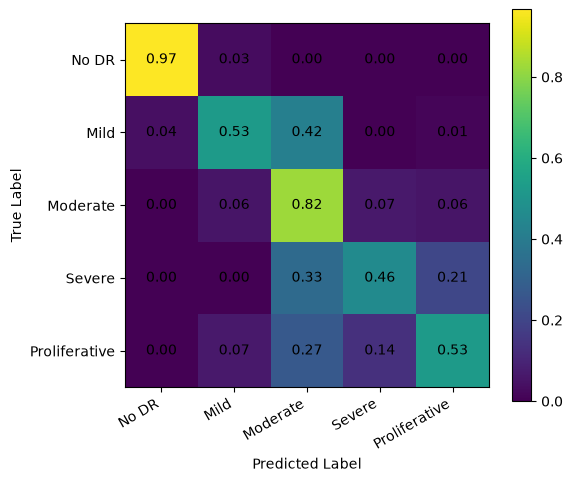

✅ Saved: /ssd4/ycheol/LGA_NET/outputs_600dpi/swin_confusion_matrix_normalized.png


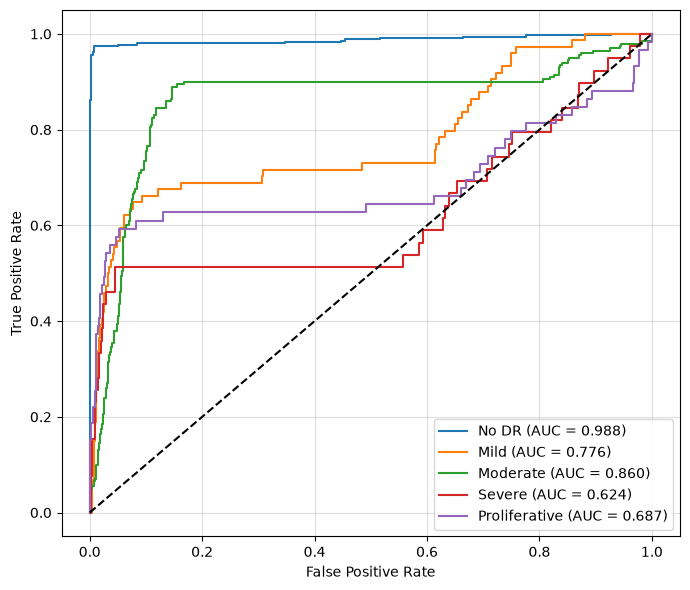

✅ Saved: /ssd4/ycheol/LGA_NET/outputs_600dpi/swin_roc_curves.png


In [54]:
# ── SWIN FINAL EVALUATION MATRICES ───────────────────────────
import os, torch
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import (cohen_kappa_score, confusion_matrix,
    classification_report, roc_auc_score, roc_curve, auc)

GRAPH_DIR = os.path.join(BASE_DIR, "outputs_600dpi")
os.makedirs(GRAPH_DIR, exist_ok=True)

classes     = ['No DR', 'Mild', 'Moderate', 'Severe', 'Proliferative']
tick_marks  = np.arange(len(classes))

# ── LOAD BEST SWIN MODEL ──────────────────────────────────────
model = timm.create_model('swin_tiny_patch4_window7_224',
    pretrained=False, num_classes=5).to(device)
model.load_state_dict(torch.load(
    os.path.join(WORK_DIR, 'swin_tiny_aptos_baseline_best.pth'),
    map_location=device))
model.eval()
print("Loaded Swin model.")

# ── EVALUATION ────────────────────────────────────────────────
all_preds, all_labels, all_probs = [], [], []
with torch.no_grad():
    for imgs, labels in swin_aptos_val_loader:   # IMPORTANT: swin loader
        imgs = imgs.to(device)
        logits = model(imgs)
        probs  = torch.softmax(logits, dim=1)
        all_probs.extend(probs.cpu().numpy())
        all_preds.extend(torch.argmax(logits, 1).cpu().numpy())
        all_labels.extend(labels.cpu().numpy())

all_probs  = np.array(all_probs)
all_preds  = np.array(all_preds)
all_labels = np.array(all_labels)

# ── METRICS ───────────────────────────────────────────────────
qwk       = cohen_kappa_score(all_labels, all_preds, weights='quadratic')
acc       = (all_labels == all_preds).mean()
auc_score = roc_auc_score(all_labels, all_probs, multi_class='ovr')
cm        = confusion_matrix(all_labels, all_preds)
cm_norm   = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]

print(f"\nQWK      : {qwk:.4f}")
print(f"Accuracy : {acc:.4f}")
print(f"AUC (OvR): {auc_score:.4f}")
print("\nClassification Report:")
print(classification_report(all_labels, all_preds,
      target_names=classes, digits=4))

# ── PLOT 1: RAW CONFUSION MATRIX ─────────────────────────────
plt.figure(figsize=(6, 5))
plt.imshow(cm, interpolation='nearest')
plt.colorbar()
plt.xticks(tick_marks, classes, rotation=30, ha='right')
plt.yticks(tick_marks, classes)
for i in range(len(classes)):
    for j in range(len(classes)):
        plt.text(j, i, cm[i, j], ha="center", va="center")
plt.ylabel("True Label"); plt.xlabel("Predicted Label")
plt.tight_layout()
path = os.path.join(GRAPH_DIR, "swin_confusion_matrix.png")
plt.savefig(path, dpi=600, bbox_inches='tight')
plt.show()
print(f"✅ Saved: {path}")

# ── PLOT 2: NORMALISED CONFUSION MATRIX ───────────────────────
plt.figure(figsize=(6, 5))
plt.imshow(cm_norm, interpolation='nearest')
plt.colorbar()
plt.xticks(tick_marks, classes, rotation=30, ha='right')
plt.yticks(tick_marks, classes)
for i in range(len(classes)):
    for j in range(len(classes)):
        plt.text(j, i, f"{cm_norm[i, j]:.2f}", ha="center", va="center")
plt.ylabel("True Label"); plt.xlabel("Predicted Label")
plt.tight_layout()
path = os.path.join(GRAPH_DIR, "swin_confusion_matrix_normalized.png")
plt.savefig(path, dpi=600, bbox_inches='tight')
plt.show()
print(f"✅ Saved: {path}")

# ── PLOT 3: ROC CURVES ────────────────────────────────────────
plt.figure(figsize=(7, 6))
for i in range(5):
    fpr, tpr, _ = roc_curve(all_labels == i, all_probs[:, i])
    roc_auc_val = auc(fpr, tpr)
    plt.plot(fpr, tpr, label=f"{classes[i]} (AUC = {roc_auc_val:.3f})")
plt.plot([0, 1], [0, 1], 'k--')
plt.xlabel("False Positive Rate"); plt.ylabel("True Positive Rate")
plt.legend(); plt.grid(True, alpha=0.4)
plt.tight_layout()
path = os.path.join(GRAPH_DIR, "swin_roc_curves.png")
plt.savefig(path, dpi=600, bbox_inches='tight')
plt.show()
print(f"✅ Saved: {path}")

In [14]:
#FINAL MODEL COMPLEXITY COMPARISON
import os, time, torch
import numpy as np
import pandas as pd
import timm
import torch.nn.functional as F
from torchvision import transforms
from torch.utils.data import DataLoader
from sklearn.metrics import cohen_kappa_score, accuracy_score, roc_auc_score

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print("Using device:", device)

GRAPH_DIR = os.path.join(BASE_DIR, "outputs_600dpi")
os.makedirs(GRAPH_DIR, exist_ok=True)

# ── HELPERS ───────────────────────────────────────────────────
def count_parameters(model):
    total     = sum(p.numel() for p in model.parameters())
    trainable = sum(p.numel() for p in model.parameters() if p.requires_grad)
    return total, trainable

def measure_inference_time(model, loader, device, num_warmup=5, num_batches=20):
    model.eval()
    batch_times = []; total_images = 0
    with torch.no_grad():
        batch_iter = iter(loader)
        for _ in range(num_warmup):
            try: batch = next(batch_iter)
            except StopIteration: batch_iter = iter(loader); batch = next(batch_iter)
            imgs = batch[0].to(device)
            if device.type == "cuda": torch.cuda.synchronize()
            _ = model(imgs)
            if device.type == "cuda": torch.cuda.synchronize()
        for _ in range(num_batches):
            try: batch = next(batch_iter)
            except StopIteration: batch_iter = iter(loader); batch = next(batch_iter)
            imgs = batch[0].to(device)
            if device.type == "cuda": torch.cuda.synchronize()
            start = time.time()
            _ = model(imgs)
            if device.type == "cuda": torch.cuda.synchronize()
            batch_times.append(time.time() - start)
            total_images += imgs.size(0)
    return sum(batch_times)/len(batch_times), sum(batch_times)/total_images

def full_evaluate(model, loader, device):
    """Runs the full val loader and computes real QWK / Accuracy / ROC-AUC."""
    model.eval()
    all_preds, all_labels, all_probs = [], [], []
    with torch.no_grad():
        for imgs, labels in loader:
            imgs = imgs.to(device)
            logits = model(imgs)
            probs = F.softmax(logits, dim=1).cpu().numpy()
            all_preds.extend(probs.argmax(axis=1))
            all_labels.extend(labels.numpy())
            all_probs.extend(probs)
    all_labels = np.array(all_labels)
    all_preds  = np.array(all_preds)
    all_probs  = np.array(all_probs)
    qwk = cohen_kappa_score(all_labels, all_preds, weights='quadratic')
    acc = accuracy_score(all_labels, all_preds)
    roc = roc_auc_score(all_labels, all_probs, multi_class='ovr', average='macro')
    return qwk, acc, roc

# ── SWIN VAL LOADER (224×224) ─────────────────────────────────
SWIN_SIZE = 224; SWIN_BATCH = 4
swin_val_transform = transforms.Compose([
    transforms.Resize((SWIN_SIZE, SWIN_SIZE)),
    transforms.ToTensor(),
    transforms.Normalize([0.485,0.456,0.406],[0.229,0.224,0.225])
])
swin_aptos_val_ds     = APTOSDataset(val_aptos, APTOS_IMG, swin_val_transform)
swin_aptos_val_loader = DataLoader(swin_aptos_val_ds, batch_size=SWIN_BATCH,
    shuffle=False, num_workers=NUM_WORKERS, pin_memory=PIN_MEMORY)

# ── BUILD MODELS ──────────────────────────────────────────────
lganet_model = LGANet(num_classes=5).to(device)
lganet_model.load_state_dict(torch.load(
    os.path.join(WORK_DIR,'lganet_stage2_best_stage2_aptos_full_finetune.pth'),
    map_location=device))

resnet_model = timm.create_model('resnet50', pretrained=False, num_classes=5).to(device)
resnet_model.load_state_dict(torch.load(
    os.path.join(WORK_DIR,'resnet50_aptos_baseline_best.pth'), map_location=device))

efficientnet_model = timm.create_model('efficientnet_b4', pretrained=False, num_classes=5).to(device)
efficientnet_model.load_state_dict(torch.load(
    os.path.join(WORK_DIR,'efficientnetb4_aptos_baseline_best.pth'), map_location=device))

mobilenet_model = timm.create_model('mobilenetv2_100', pretrained=False, num_classes=5).to(device)
mobilenet_model.load_state_dict(torch.load(
    os.path.join(WORK_DIR,'mobilenetv2_aptos_baseline_best.pth'), map_location=device))

swin_model = timm.create_model('swin_tiny_patch4_window7_224',
    pretrained=False, num_classes=5).to(device)
swin_model.load_state_dict(torch.load(
    os.path.join(WORK_DIR,'swin_tiny_aptos_baseline_best.pth'), map_location=device))

# ── LGANET WRAPPER (returns logits only) ─────────────────────
class LGANetWrapper(torch.nn.Module):
    def __init__(self, m): super().__init__(); self.m = m
    def forward(self, x): logits, _ = self.m(x); return logits
lganet_wrapped = LGANetWrapper(lganet_model).to(device)

# ── MEASURE ───────────────────────────────────────────────────
configs = [
    ("LGA-Net",         lganet_wrapped,      aptos_val_loader,      lganet_model),
    ("ResNet50",        resnet_model,        aptos_val_loader,      resnet_model),
    ("EfficientNet-B4", efficientnet_model,  aptos_val_loader,      efficientnet_model),
    ("MobileNetV2",     mobilenet_model,     aptos_val_loader,      mobilenet_model),
    ("Swin-Tiny",       swin_model,          swin_aptos_val_loader, swin_model),
]

results = []
for name, m, loader, param_model in configs:
    total, trainable    = count_parameters(param_model)
    avg_batch, avg_img   = measure_inference_time(m, loader, device)
    qwk, acc, roc         = full_evaluate(m, loader, device)
    results.append({
        "Model": name,
        "Total Params": total,
        "Trainable Params": trainable,
        "Avg Batch Inference Time (s)": avg_batch,
        "Avg Image Inference Time (s)": avg_img,
        "Best QWK": qwk,
        "Accuracy": acc,
        "ROC-AUC": roc
    })
    print(f"{name} done — QWK: {qwk:.4f}, Acc: {acc:.4f}, AUC: {roc:.4f}")

# ── BUILD TABLE ───────────────────────────────────────────────
complexity_df = pd.DataFrame(results)
complexity_df["Total Params (M)"]              = complexity_df["Total Params"] / 1e6
complexity_df["Trainable Params (M)"]          = complexity_df["Trainable Params"] / 1e6
complexity_df["Avg Batch Inference Time (ms)"] = complexity_df["Avg Batch Inference Time (s)"] * 1000
complexity_df["Avg Image Inference Time (ms)"] = complexity_df["Avg Image Inference Time (s)"] * 1000

complexity_df = complexity_df[[
    "Model","Total Params (M)","Trainable Params (M)",
    "Avg Batch Inference Time (ms)","Avg Image Inference Time (ms)",
    "Best QWK","Accuracy","ROC-AUC"
]].sort_values("Best QWK", ascending=False).reset_index(drop=True)

print("\nFinal Complexity Table:")
print(complexity_df.round(4))

# ── SAVE TO GRAPH_DIR ─────────────────────────────────────────
save_path = os.path.join(GRAPH_DIR, "model_complexity_comparison_v2.csv")
complexity_df.to_csv(save_path, index=False)
print(f"\n✅ Saved: {save_path}")

# Paper-ready table
paper_table = complexity_df[[
    "Model","Total Params (M)","Avg Image Inference Time (ms)",
    "Best QWK","Accuracy","ROC-AUC"
]].copy().round(4)

paper_csv = os.path.join(GRAPH_DIR, "paper_ready_complexity_table_v2.csv")
paper_table.to_csv(paper_csv, index=False)
print(f"✅ Saved: {paper_csv}")
print("\nPaper-ready table:")
print(paper_table)

Using device: cuda
LGA-Net done — QWK: 0.9008, Acc: 0.8349, AUC: 0.8738
ResNet50 done — QWK: 0.8750, Acc: 0.7940, AUC: 0.9084
EfficientNet-B4 done — QWK: 0.8677, Acc: 0.7735, AUC: 0.8778
MobileNetV2 done — QWK: 0.8487, Acc: 0.7954, AUC: 0.8542
Swin-Tiny done — QWK: 0.8958, Acc: 0.8213, AUC: 0.8318

Final Complexity Table:
             Model  Total Params (M)  Trainable Params (M)  \
0          LGA-Net           48.3824               48.3824   
1        Swin-Tiny           27.5232               27.5232   
2         ResNet50           23.5183               23.5183   
3  EfficientNet-B4           17.5576               17.5576   
4      MobileNetV2            2.2303                2.2303   

   Avg Batch Inference Time (ms)  Avg Image Inference Time (ms)  Best QWK  \
0                        90.1012                        15.0169    0.9008   
1                        71.9739                        17.9935    0.8958   
2                        84.7483                        14.1247    0.875

Loaded all history CSVs.


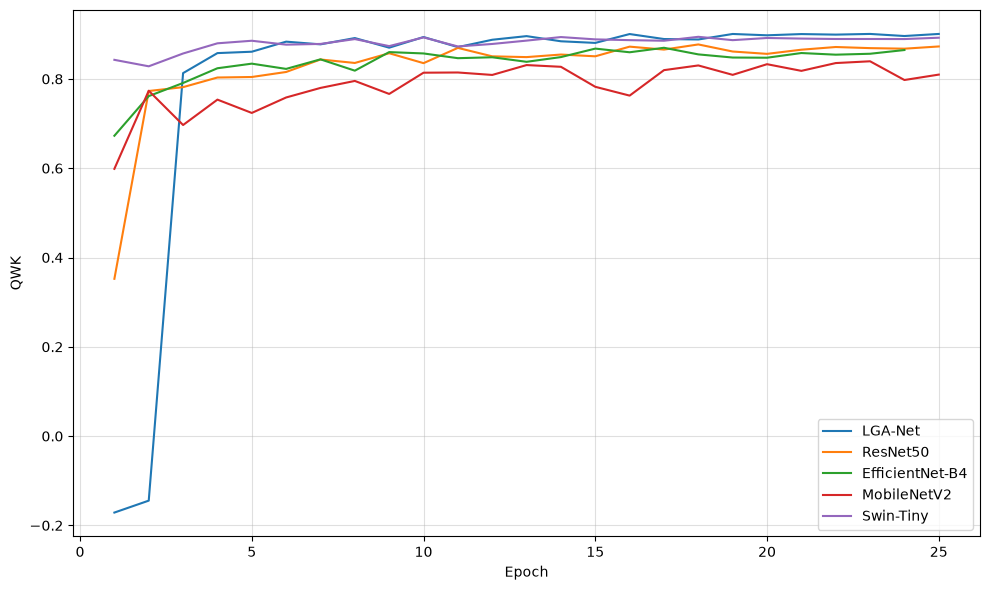

✅ Saved: /ssd4/ycheol/LGA_NET/outputs_600dpi/all_models_validation_qwk_only.png


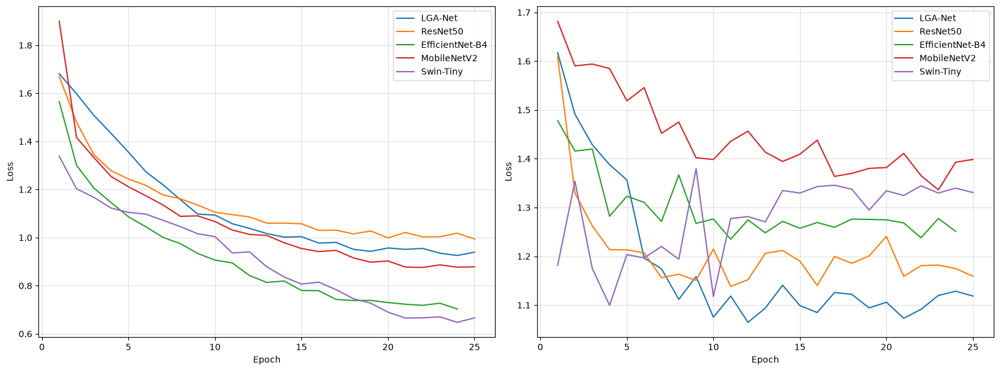

✅ Saved: /ssd4/ycheol/LGA_NET/outputs_600dpi/all_models_loss_curves_combined.png


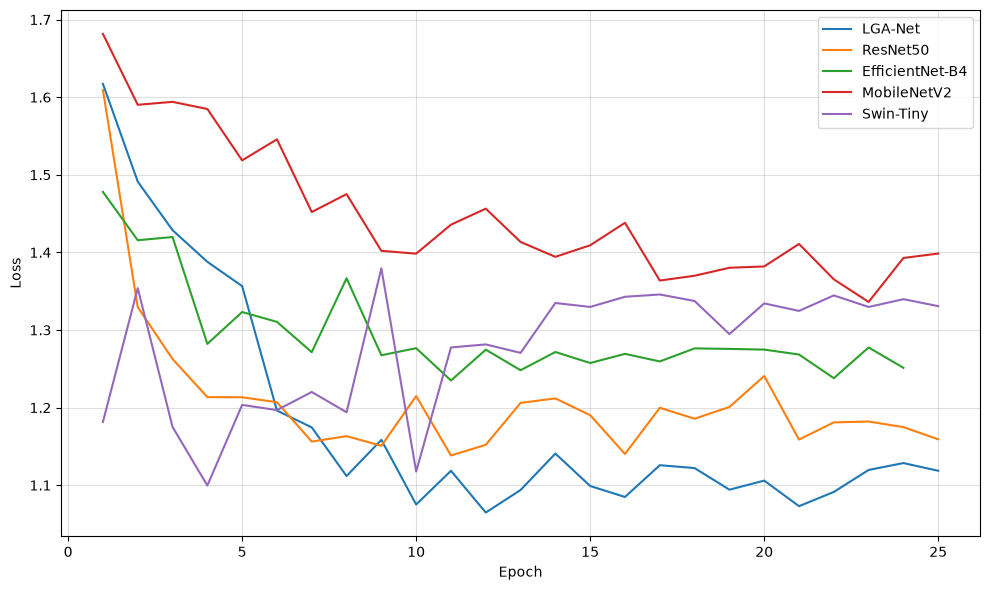

✅ Saved: /ssd4/ycheol/LGA_NET/outputs_600dpi/all_models_validation_loss_only.png


In [19]:
# All models QWK curves+ combined train, val loss+ Validation QWK 
import os
import pandas as pd
import matplotlib.pyplot as plt

GRAPH_DIR = os.path.join(BASE_DIR, "outputs_600dpi")
os.makedirs(GRAPH_DIR, exist_ok=True)

# ── LOAD HISTORIES ────────────────────────────────────────────
lganet_hist       = pd.read_csv(os.path.join(WORK_DIR, "lganet_stage2_history_stage2_aptos_full_finetune.csv"))
resnet_hist       = pd.read_csv(os.path.join(WORK_DIR, "resnet50_aptos_baseline_history.csv"))
efficientnet_hist = pd.read_csv(os.path.join(WORK_DIR, "efficientnetb4_aptos_baseline_history.csv"))
mobilenet_hist    = pd.read_csv(os.path.join(WORK_DIR, "mobilenetv2_aptos_baseline_history.csv"))
swin_hist         = pd.read_csv(os.path.join(WORK_DIR, "swin_tiny_aptos_baseline_history.csv"))
print("Loaded all history CSVs.")

# ── VALIDATION QWK ALL MODELS ─────────────────────────────────
plt.figure(figsize=(10, 6))
plt.plot(lganet_hist["epoch"],       lganet_hist["val_qwk"],       label="LGA-Net",        linewidth=1.5)
plt.plot(resnet_hist["epoch"],       resnet_hist["val_qwk"],       label="ResNet50",        linewidth=1.5)
plt.plot(efficientnet_hist["epoch"], efficientnet_hist["val_qwk"], label="EfficientNet-B4", linewidth=1.5)
plt.plot(mobilenet_hist["epoch"],    mobilenet_hist["val_qwk"],    label="MobileNetV2",     linewidth=1.5)
plt.plot(swin_hist["epoch"],         swin_hist["val_qwk"],         label="Swin-Tiny",       linewidth=1.5)
plt.xlabel("Epoch"); plt.ylabel("QWK")
plt.legend(); plt.grid(True, alpha=0.4)
plt.tight_layout()
path = os.path.join(GRAPH_DIR, "all_models_validation_qwk_only.png")
plt.savefig(path, dpi=600, bbox_inches="tight")
plt.show()
print(f"✅ Saved: {path}")

# ── COMBINED TRAIN + VAL LOSS ALL MODELS ─────────────────────
fig, axes = plt.subplots(1, 2, figsize=(16, 6))
for h, label in [(lganet_hist,"LGA-Net"),(resnet_hist,"ResNet50"),
                  (efficientnet_hist,"EfficientNet-B4"),(mobilenet_hist,"MobileNetV2"),
                  (swin_hist,"Swin-Tiny")]:
    axes[0].plot(h["epoch"], h["train_loss"], label=label, linewidth=1.5)
    axes[1].plot(h["epoch"], h["val_loss"],   label=label, linewidth=1.5)
for ax in axes:
    ax.set_xlabel("Epoch"); ax.set_ylabel("Loss")
    ax.legend(); ax.grid(True, alpha=0.4)
plt.tight_layout()
path = os.path.join(GRAPH_DIR, "all_models_loss_curves_combined.png")
plt.savefig(path, dpi=600, bbox_inches="tight")
plt.show()
print(f"✅ Saved: {path}")

# ── VALIDATION LOSS ONLY ──────────────────────────────────────
plt.figure(figsize=(10, 6))
for h, label in [(lganet_hist,"LGA-Net"),(resnet_hist,"ResNet50"),
                  (efficientnet_hist,"EfficientNet-B4"),(mobilenet_hist,"MobileNetV2"),
                  (swin_hist,"Swin-Tiny")]:
    plt.plot(h["epoch"], h["val_loss"], label=label, linewidth=1.5)
plt.xlabel("Epoch"); plt.ylabel("Loss")
plt.legend(); plt.grid(True, alpha=0.4)
plt.tight_layout()
path = os.path.join(GRAPH_DIR, "all_models_validation_loss_only.png")
plt.savefig(path, dpi=600, bbox_inches="tight")
plt.show()
print(f"✅ Saved: {path}")

Best model loaded.
Selected 1 sample per grade: ['No DR', 'Mild', 'Moderate', 'Severe', 'Proliferative']


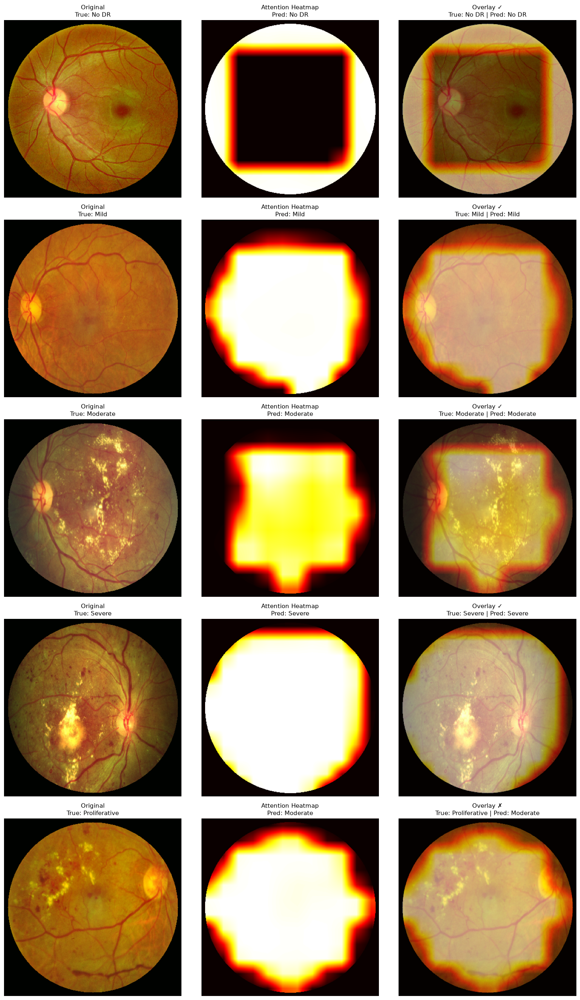

✅ Saved: /ssd4/ycheol/LGA_NET/outputs_600dpi/aptos_attention_final.png


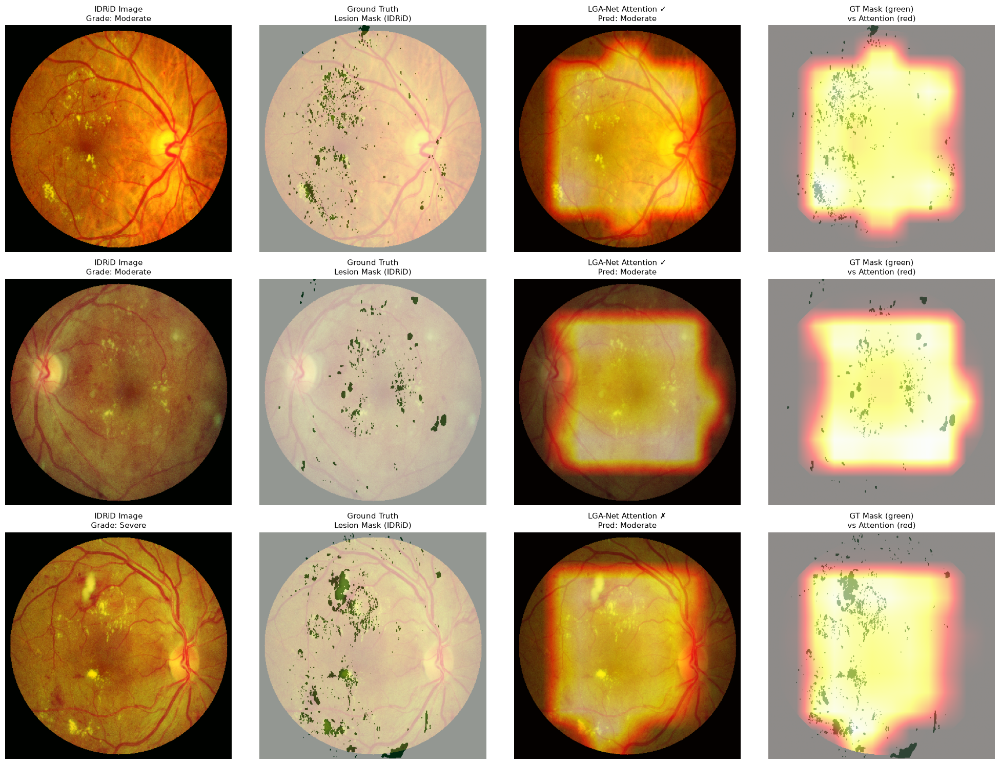

✅ Saved: /ssd4/ycheol/LGA_NET/outputs_600dpi/idrid_attention_vs_mask_final.png


51

In [20]:
# ── PHASE 6 — Attention Map Visualization ────────────────────
import os, gc
from collections import defaultdict
import numpy as np
import matplotlib.pyplot as plt
import torch
import torch.nn.functional as F

GRAPH_DIR = os.path.join(BASE_DIR, "outputs_600dpi")
os.makedirs(GRAPH_DIR, exist_ok=True)

# ── LOAD BEST MODEL ───────────────────────────────────────────
best_model_path = os.path.join(WORK_DIR,
    'lganet_stage2_best_stage2_aptos_full_finetune.pth')
model = LGANet(num_classes=5).to(device)
model.load_state_dict(torch.load(best_model_path, map_location=device))
model.eval()
print("Best model loaded.")

# ── HELPERS ───────────────────────────────────────────────────
def denormalize(tensor):
    mean = torch.tensor([0.485, 0.456, 0.406]).view(3, 1, 1)
    std  = torch.tensor([0.229, 0.224, 0.225]).view(3, 1, 1)
    return torch.clamp(tensor.cpu() * std + mean, 0, 1)

def normalize_attention(attn_map):
    attn_map = attn_map.astype(np.float32)
    return (attn_map - attn_map.min()) / (attn_map.max() - attn_map.min() + 1e-8)

def apply_fov_mask(arr, radius_scale=0.48):
    """Zero out anything outside the circular fundus region so background
    corners never show spurious attention/Grad-CAM signal."""
    h, w = arr.shape
    yy, xx = np.mgrid[0:h, 0:w]
    cy, cx = h / 2, w / 2
    r = radius_scale * min(h, w)
    mask = ((yy - cy) ** 2 + (xx - cx) ** 2) <= r ** 2
    out = arr.copy()
    out[~mask] = 0
    return out

grade_names = {0:'No DR', 1:'Mild', 2:'Moderate', 3:'Severe', 4:'Proliferative'}

# ── SELECT ONE SAMPLE PER DR GRADE ───────────────────────────
grade_samples = defaultdict(list)
target_grades = {0, 1, 2, 3, 4}
for imgs, labels in aptos_val_loader:
    for img, lbl in zip(imgs, labels):
        g = lbl.item()
        if g in target_grades and len(grade_samples[g]) == 0:
            grade_samples[g].append((img, lbl))
    if all(len(grade_samples[g]) > 0 for g in target_grades):
        break

selected_imgs   = torch.stack([grade_samples[g][0][0] for g in range(5)])
selected_labels = torch.tensor([grade_samples[g][0][1] for g in range(5)])
sample_imgs   = selected_imgs.to(device)
sample_labels = selected_labels
print("Selected 1 sample per grade:", [grade_names[i] for i in range(5)])

# ── FIGURE 1: APTOS ATTENTION (5 rows — one per grade) ───────
with torch.no_grad():
    logits, attn_maps = model(sample_imgs)
    preds = torch.argmax(logits, dim=1)

num_samples = 5
fig, axes = plt.subplots(num_samples, 3, figsize=(15, 5 * num_samples))
for i in range(num_samples):
    img_show  = denormalize(sample_imgs[i]).permute(1, 2, 0).numpy()
    attn_show = F.interpolate(attn_maps[i].unsqueeze(0), size=(380, 380),
        mode='bilinear', align_corners=False).squeeze().cpu().numpy()
    attn_show  = normalize_attention(attn_show)
    attn_show  = apply_fov_mask(attn_show)
    true_grade = sample_labels[i].item()
    pred_grade = preds[i].item()
    correct    = '✓' if true_grade == pred_grade else '✗'

    axes[i, 0].imshow(img_show)
    axes[i, 0].set_title(f'Original\nTrue: {grade_names[true_grade]}', fontsize=11)
    axes[i, 0].axis('off')

    axes[i, 1].imshow(attn_show, cmap='hot')
    axes[i, 1].set_title(f'Attention Heatmap\nPred: {grade_names[pred_grade]}', fontsize=11)
    axes[i, 1].axis('off')

    axes[i, 2].imshow(img_show)
    axes[i, 2].imshow(attn_show, cmap='hot', alpha=0.45)
    axes[i, 2].set_title(
        f'Overlay {correct}\nTrue: {grade_names[true_grade]} | Pred: {grade_names[pred_grade]}',
        fontsize=11)
    axes[i, 2].axis('off')

plt.tight_layout()
path = os.path.join(GRAPH_DIR, 'aptos_attention_final.png')
plt.savefig(path, dpi=600, bbox_inches='tight')
plt.show()
print(f"✅ Saved: {path}")

# ── FIGURE 2: IDRiD ATTENTION VS MASK ────────────────────────
idrid_val_loader_3 = DataLoader(
    idrid_val_ds, batch_size=3, shuffle=False,
    num_workers=NUM_WORKERS, pin_memory=PIN_MEMORY
)
idrid_imgs, idrid_masks, idrid_labels = next(iter(idrid_val_loader_3))
idrid_imgs = idrid_imgs.to(device)

with torch.no_grad():
    logits2, attn_maps2 = model(idrid_imgs)
    preds2 = torch.argmax(logits2, dim=1)

num_idrid = min(3, idrid_imgs.shape[0])
fig2, axes2 = plt.subplots(num_idrid, 4, figsize=(20, 5 * num_idrid))
if num_idrid == 1:
    axes2 = np.expand_dims(axes2, axis=0)

for i in range(num_idrid):
    img_show  = denormalize(idrid_imgs[i]).permute(1, 2, 0).numpy()
    attn_show = F.interpolate(attn_maps2[i].unsqueeze(0), size=(380, 380),
        mode='bilinear', align_corners=False).squeeze().cpu().numpy()
    attn_show  = normalize_attention(attn_show)
    attn_show  = apply_fov_mask(attn_show)
    mask_show  = idrid_masks[i].squeeze().cpu().numpy()
    true_grade = idrid_labels[i].item()
    pred_grade = preds2[i].item()
    correct    = '✓' if true_grade == pred_grade else '✗'

    axes2[i, 0].imshow(img_show)
    axes2[i, 0].set_title(f'IDRiD Image\nGrade: {grade_names[true_grade]}', fontsize=11)
    axes2[i, 0].axis('off')

    axes2[i, 1].imshow(img_show)
    axes2[i, 1].imshow(mask_show, cmap='Greens', alpha=0.6)
    axes2[i, 1].set_title('Ground Truth\nLesion Mask (IDRiD)', fontsize=11)
    axes2[i, 1].axis('off')

    axes2[i, 2].imshow(img_show)
    axes2[i, 2].imshow(attn_show, cmap='hot', alpha=0.45)
    axes2[i, 2].set_title(
        f'LGA-Net Attention {correct}\nPred: {grade_names[pred_grade]}', fontsize=11)
    axes2[i, 2].axis('off')

    axes2[i, 3].imshow(mask_show, cmap='Greens', alpha=0.7)
    axes2[i, 3].imshow(attn_show, cmap='hot', alpha=0.45)
    axes2[i, 3].set_title('GT Mask (green)\nvs Attention (red)', fontsize=11)
    axes2[i, 3].axis('off')

plt.tight_layout()
path = os.path.join(GRAPH_DIR, 'idrid_attention_vs_mask_final.png')
plt.savefig(path, dpi=600, bbox_inches='tight')
plt.show()
print(f"✅ Saved: {path}")

torch.cuda.empty_cache()
gc.collect()

Loaded model.


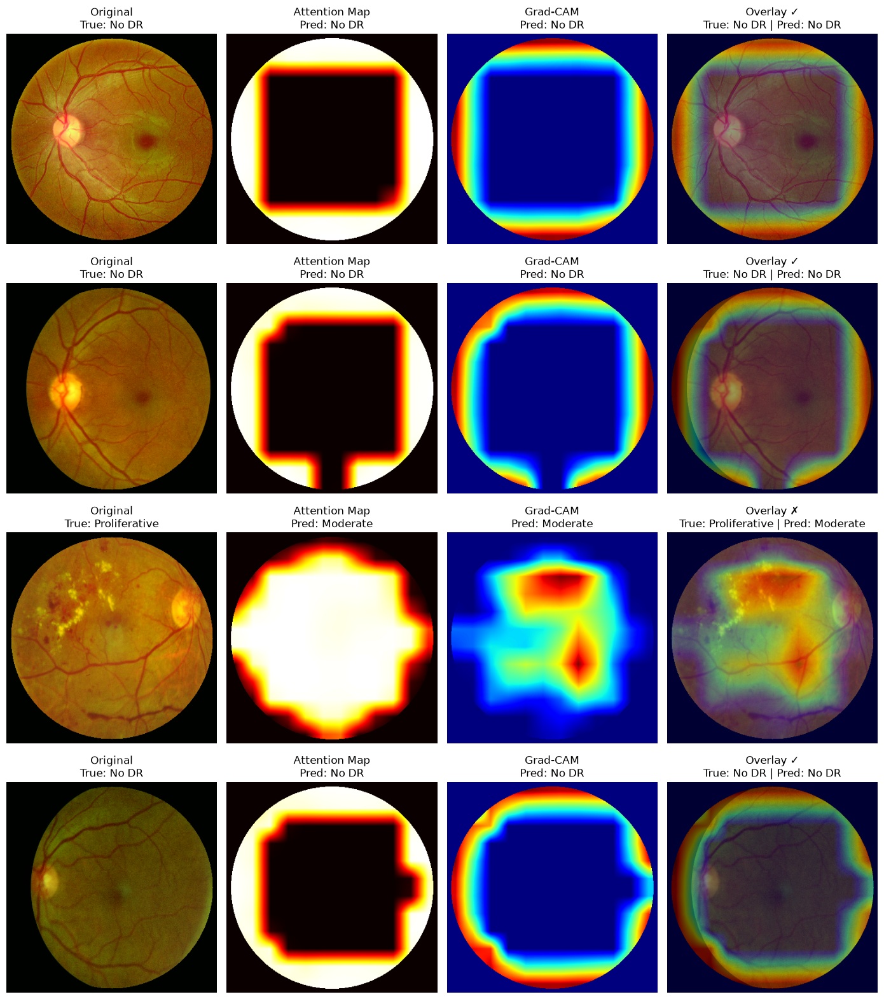

Previous version: PNG, dpi=600, figsize width 18in (~10,800px). This version: JPG q95, dpi=500, figsize width 14in (~7,000px) — still well above BSPC's 500 dpi / ~3,740px minimum for combination line/halftone artwork.
Saved: /ssd4/ycheol/LGA_NET/outputs_600dpi/lganet_gradcam_aptos.jpg


In [22]:
# ── Grad-CAM for LGA-Net ──────────────────────────────────────
import os, cv2
import numpy as np
import torch
import torch.nn.functional as F
import matplotlib.pyplot as plt

GRAPH_DIR = os.path.join(BASE_DIR, "outputs_600dpi")
os.makedirs(GRAPH_DIR, exist_ok=True)

# ── LOAD MODEL ────────────────────────────────────────────────
model = LGANet(num_classes=5).to(device)
model.load_state_dict(torch.load(
    os.path.join(WORK_DIR, 'lganet_stage2_best_stage2_aptos_full_finetune.pth'),
    map_location=device))
model.eval()
print("Loaded model.")

# ── HELPERS ───────────────────────────────────────────────────
grade_names = {0:'No DR', 1:'Mild', 2:'Moderate', 3:'Severe', 4:'Proliferative'}

def denormalize(tensor):
    mean = torch.tensor([0.485, 0.456, 0.406]).view(3, 1, 1)
    std  = torch.tensor([0.229, 0.224, 0.225]).view(3, 1, 1)
    return torch.clamp(tensor.cpu() * std + mean, 0, 1)

def normalize_map(x):
    x = x.astype(np.float32)
    return (x - x.min()) / (x.max() - x.min() + 1e-8)

def apply_fov_mask(arr, radius_scale=0.48):
    h, w = arr.shape
    yy, xx = np.mgrid[0:h, 0:w]
    cy, cx = h / 2, w / 2
    r = radius_scale * min(h, w)
    mask = ((yy - cy) ** 2 + (xx - cx) ** 2) <= r ** 2
    out = arr.copy()
    out[~mask] = 0
    return out

# ── HOOKS ─────────────────────────────────────────────────────
cam_activations = None
cam_gradients   = None

def forward_hook_attn(module, inputs, output):
    global cam_activations
    attended = output[0]
    cam_activations = attended
    def save_gradients(grad):
        global cam_gradients
        cam_gradients = grad
    attended.register_hook(save_gradients)

hook_handle = model.attn_gate.register_forward_hook(forward_hook_attn)

# ── GRAD-CAM FUNCTION ─────────────────────────────────────────
def generate_gradcam(model, input_tensor, target_class=None, output_size=(380, 380)):
    global cam_activations, cam_gradients
    cam_activations = None; cam_gradients = None
    model.zero_grad()
    logits, attn_map = model(input_tensor)
    if target_class is None:
        target_class = int(torch.argmax(logits, dim=1).item())
    logits[:, target_class].backward(retain_graph=True)
    activations = cam_activations.detach()
    gradients   = cam_gradients.detach()
    weights = gradients.mean(dim=(2, 3), keepdim=True)
    cam = F.relu((weights * activations).sum(dim=1, keepdim=True))
    cam = F.interpolate(cam, size=output_size, mode='bilinear', align_corners=False)
    cam = normalize_map(cam.squeeze().cpu().numpy())
    return cam, logits, attn_map

# ── VISUALISE ON APTOS VALIDATION SAMPLES ─────────────────────
sample_imgs, sample_labels = next(iter(aptos_val_loader))
sample_imgs = sample_imgs.to(device)
num_samples = min(4, sample_imgs.shape[0])

# FIX (file size): figsize was (18, 5*num_samples) at dpi=600, i.e. a
# 10,800px-wide canvas — roughly 3x BSPC's minimum required resolution
# for this figure type (combination line/halftone: >=500 dpi / ~3,740px
# full-page-width). Trimmed figsize to 14in wide (still >=8,400px wide
# at dpi=500, well over the requirement) and dropped dpi 600 -> 500,
# which alone is still fully compliant and meaningfully smaller.
fig, axes = plt.subplots(num_samples, 4, figsize=(14, 4 * num_samples))
if num_samples == 1:
    axes = np.expand_dims(axes, axis=0)

for i in range(num_samples):
    img_tensor = sample_imgs[i].unsqueeze(0)
    with torch.enable_grad():
        gradcam_map, logits, attn_map = generate_gradcam(
            model, img_tensor, output_size=(380, 380))
    gradcam_map = apply_fov_mask(gradcam_map)
    pred    = torch.argmax(logits, dim=1).item()
    true    = sample_labels[i].item()
    correct = "✓" if pred == true else "✗"

    img_show = denormalize(sample_imgs[i]).permute(1, 2, 0).numpy()
    attn_show = normalize_map(
        F.interpolate(attn_map[0].unsqueeze(0), size=(380, 380),
                      mode='bilinear', align_corners=False)
        .squeeze().detach().cpu().numpy())
    attn_show = apply_fov_mask(attn_show)

    axes[i, 0].imshow(img_show)
    axes[i, 0].set_title(f"Original\nTrue: {grade_names[true]}")
    axes[i, 0].axis("off")

    axes[i, 1].imshow(attn_show, cmap='hot')
    axes[i, 1].set_title(f"Attention Map\nPred: {grade_names[pred]}")
    axes[i, 1].axis("off")

    axes[i, 2].imshow(gradcam_map, cmap='jet')
    axes[i, 2].set_title(f"Grad-CAM\nPred: {grade_names[pred]}")
    axes[i, 2].axis("off")

    axes[i, 3].imshow(img_show)
    axes[i, 3].imshow(gradcam_map, cmap='jet', alpha=0.40)
    axes[i, 3].set_title(f"Overlay {correct}\nTrue: {grade_names[true]} | Pred: {grade_names[pred]}")
    axes[i, 3].axis("off")

plt.tight_layout()

# FIX (file size): PNG is lossless, which compresses poorly on a
# photo + jet-colormap-heatmap composite like this. BSPC explicitly
# accepts JPG for both photographic and combination line/halftone
# figures at >=500 dpi (fetched directly from their Guide for Authors),
# so switching format + dropping dpi 600 -> 500 gives a large size
# reduction with no compliance issue and no visible quality loss at
# quality=95.
path = os.path.join(GRAPH_DIR, "lganet_gradcam_aptos.jpg")
plt.savefig(path, dpi=500, bbox_inches='tight', pil_kwargs={'quality': 95})
plt.show()

before_note = (
    "Previous version: PNG, dpi=600, figsize width 18in (~10,800px). "
    "This version: JPG q95, dpi=500, figsize width 14in (~7,000px) — "
    "still well above BSPC's 500 dpi / ~3,740px minimum for combination "
    "line/halftone artwork."
)
print(before_note)

# ── REMOVE HOOK ───────────────────────────────────────────────
hook_handle.remove()
print(f"Saved: {path}")

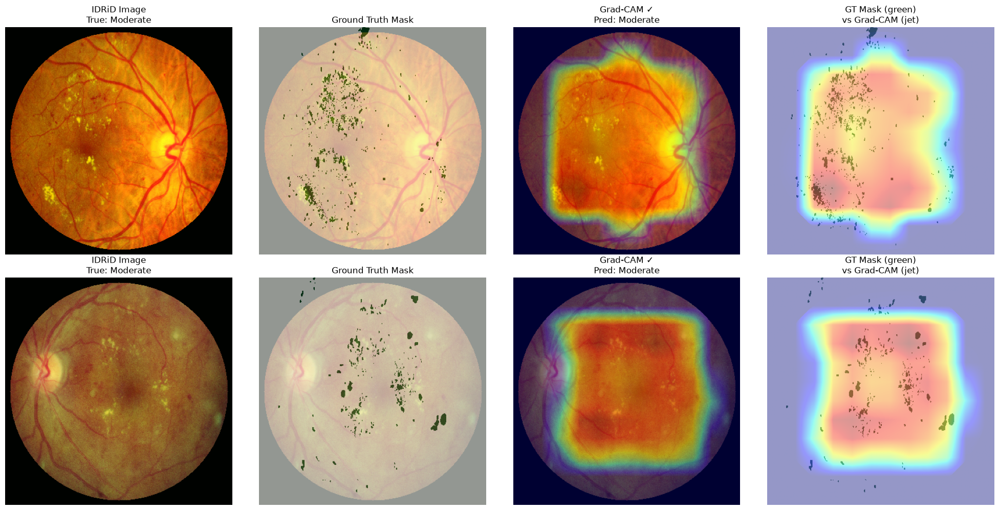

✅ Saved: /ssd4/ycheol/LGA_NET/outputs_600dpi/lganet_gradcam_idrid.png


In [24]:
# ── Grad-CAM vs GT Mask on IDRiD ─────────────────────────────
import numpy as np
import torch
import torch.nn.functional as F
import matplotlib.pyplot as plt

GRAPH_DIR = os.path.join(BASE_DIR, "outputs_600dpi")
os.makedirs(GRAPH_DIR, exist_ok=True)

# ── Re-register hook (was removed at end of APTOS cell) ───────
cam_activations = None
cam_gradients   = None
hook_handle = model.attn_gate.register_forward_hook(forward_hook_attn)

idrid_imgs, idrid_masks, idrid_labels = next(iter(idrid_val_loader))
idrid_imgs = idrid_imgs.to(device)
num_samples = min(3, idrid_imgs.shape[0])
fig, axes = plt.subplots(num_samples, 4, figsize=(20, 5 * num_samples))
if num_samples == 1:
    axes = np.expand_dims(axes, axis=0)

for i in range(num_samples):
    img_tensor = idrid_imgs[i].unsqueeze(0)
    with torch.enable_grad():
        gradcam_map, logits, _ = generate_gradcam(
            model, img_tensor,
            target_class=None, output_size=(380, 380))
    gradcam_map = apply_fov_mask(gradcam_map)
    pred    = torch.argmax(logits, dim=1).item()
    true    = idrid_labels[i].item()
    correct = "✓" if pred == true else "✗"
    img_show  = denormalize(idrid_imgs[i]).permute(1, 2, 0).numpy()
    mask_show = idrid_masks[i].squeeze().cpu().numpy()

    axes[i, 0].imshow(img_show)
    axes[i, 0].set_title(f"IDRiD Image\nTrue: {grade_names[true]}")
    axes[i, 0].axis("off")

    axes[i, 1].imshow(img_show)
    axes[i, 1].imshow(mask_show, cmap='Greens', alpha=0.6)
    axes[i, 1].set_title("Ground Truth Mask")
    axes[i, 1].axis("off")

    axes[i, 2].imshow(img_show)
    axes[i, 2].imshow(gradcam_map, cmap='jet', alpha=0.4)
    axes[i, 2].set_title(f"Grad-CAM {correct}\nPred: {grade_names[pred]}")
    axes[i, 2].axis("off")

    axes[i, 3].imshow(mask_show, cmap='Greens', alpha=0.7)
    axes[i, 3].imshow(gradcam_map, cmap='jet', alpha=0.4)
    axes[i, 3].set_title("GT Mask (green)\nvs Grad-CAM (jet)")
    axes[i, 3].axis("off")

plt.tight_layout()
path = os.path.join(GRAPH_DIR, "lganet_gradcam_idrid.png")
plt.savefig(path, dpi=600, bbox_inches='tight')
plt.show()

# ── Remove hook after use ─────────────────────────────────────
hook_handle.remove()
print(f"✅ Saved: {path}")

In [21]:
# ─────────────────────────────────────────────────────────────
# CELL A  ─  5-FOLD STRATIFIED CROSS-VALIDATION  (LGA-Net)
# CORRECTED LR: gate learns faster than backbone (5e-6 / 5e-5)
# ─────────────────────────────────────────────────────────────
import os, gc, time, copy, random
import numpy as np
import pandas as pd
import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.optim import AdamW
from torch.optim.lr_scheduler import CosineAnnealingLR
from torch.utils.data import DataLoader
from sklearn.model_selection import StratifiedKFold
from sklearn.metrics import (
    cohen_kappa_score, roc_auc_score,
    confusion_matrix, classification_report
)
from sklearn.preprocessing import label_binarize

# ── reproducibility ──────────────────────────────────────────
def set_seed(seed=42):
    random.seed(seed)
    np.random.seed(seed)
    torch.manual_seed(seed)
    torch.cuda.manual_seed_all(seed)

set_seed(42)

# ── config ───────────────────────────────────────────────────
N_FOLDS        = 5
STAGE2_EPOCHS  = 25      # per fold (same as your main run)
PATIENCE       = 10
APTOS_BATCH    = 6
NUM_WORKERS    = 0
PIN_MEMORY     = True
CLASS_NAMES    = ['No DR', 'Mild', 'Moderate', 'Severe', 'Proliferative']

# ── load full APTOS CSV ──────────────────────────────────────
aptos_full = pd.read_csv(APTOS_CSV)        # columns: id_code, diagnosis
labels_all = aptos_full['diagnosis'].values

print(f"Total APTOS samples : {len(aptos_full)}")
print(f"Class distribution  :\n{pd.Series(labels_all).value_counts().sort_index()}")

# ── helpers ──────────────────────────────────────────────────
def get_class_weights(labels_array):
    """Inverse-frequency weights matching your Phase-5 approach."""
    counts = np.bincount(labels_array, minlength=5).astype(np.float32)
    weights = 1.0 / counts
    weights = weights / weights.sum() * len(weights)
    return torch.tensor(weights, dtype=torch.float32).to(device)


def train_one_fold_epoch(model, loader, optimizer, criterion):
    model.train()
    total_loss, all_preds, all_labels = 0.0, [], []

    for imgs, labels in loader:
        imgs, labels = imgs.to(device), labels.to(device)
        optimizer.zero_grad()
        logits, _ = model(imgs)          # LGANet returns (logits, attn_map)
        loss = criterion(logits, labels)
        loss.backward()
        torch.nn.utils.clip_grad_norm_(model.parameters(), 1.0)
        optimizer.step()
        total_loss += loss.item()
        all_preds.extend(torch.argmax(logits, 1).detach().cpu().numpy())
        all_labels.extend(labels.detach().cpu().numpy())

    qwk = cohen_kappa_score(all_labels, all_preds, weights='quadratic')
    return total_loss / len(loader), qwk


def validate_one_fold_epoch(model, loader, criterion):
    model.eval()
    total_loss, all_preds, all_labels, all_probs = 0.0, [], [], []

    with torch.no_grad():
        for imgs, labels in loader:
            imgs, labels = imgs.to(device), labels.to(device)
            logits, _ = model(imgs)
            loss = criterion(logits, labels)
            total_loss += loss.item()
            probs = torch.softmax(logits, 1)
            all_probs.extend(probs.cpu().numpy())
            all_preds.extend(torch.argmax(logits, 1).cpu().numpy())
            all_labels.extend(labels.cpu().numpy())

    qwk = cohen_kappa_score(all_labels, all_preds, weights='quadratic')
    return (
        total_loss / len(loader), qwk,
        np.array(all_labels),
        np.array(all_preds),
        np.array(all_probs)
    )


# ── path where your STAGE-1 best checkpoint lives ────────────
STAGE1_CKPT = os.path.join(WORK_DIR, 'lganet_stage1_best_frozen.pth')

# ── cross-validation loop ────────────────────────────────────
skf = StratifiedKFold(n_splits=N_FOLDS, shuffle=True, random_state=42)

fold_results = []     # one dict per fold

# accumulators for pooled confusion matrix
pooled_labels = []
pooled_preds  = []
pooled_probs  = []

print("=" * 65)
print(f"LGA-Net  —  {N_FOLDS}-Fold Stratified Cross-Validation (corrected LR)")
print("=" * 65)

for fold_idx, (train_idx, val_idx) in enumerate(
    skf.split(aptos_full['id_code'], labels_all), start=1
):
    print(f"\n{'─'*55}")
    print(f"  FOLD {fold_idx}/{N_FOLDS}")
    print(f"{'─'*55}")

    fold_train_df = aptos_full.iloc[train_idx].reset_index(drop=True)
    fold_val_df   = aptos_full.iloc[val_idx].reset_index(drop=True)

    train_labels  = fold_train_df['diagnosis'].values

    # ── datasets & loaders ───────────────────────────────────
    train_ds = APTOSDataset(fold_train_df, APTOS_IMG, transform=train_transform)
    val_ds   = APTOSDataset(fold_val_df,   APTOS_IMG, transform=val_transform)

    train_loader = DataLoader(
        train_ds, batch_size=APTOS_BATCH, shuffle=True,
        num_workers=NUM_WORKERS, pin_memory=PIN_MEMORY
    )
    val_loader = DataLoader(
        val_ds, batch_size=APTOS_BATCH, shuffle=False,
        num_workers=NUM_WORKERS, pin_memory=PIN_MEMORY
    )

    # ── fresh model initialised from STAGE-1 weights ─────────
    fold_model = LGANet(num_classes=5).to(device)
    fold_model.load_state_dict(
        torch.load(STAGE1_CKPT, map_location=device)
    )
    # unfreeze everything (same as your Phase-5)
    for p in fold_model.parameters():
        p.requires_grad = True

    # ── class weights (fold-specific) ────────────────────────
    class_weights = get_class_weights(train_labels)
    criterion     = nn.CrossEntropyLoss(
        weight=class_weights, label_smoothing=0.05
    )

    # ── optimizer — CORRECTED: gate learns faster than backbone ──
    gate_params    = list(fold_model.attn_gate.parameters())
    gate_ids       = {id(p) for p in gate_params}
    main_params    = [p for p in fold_model.parameters()
                      if id(p) not in gate_ids]

    optimizer = AdamW(
        [{'params': main_params, 'lr': 5e-6},
         {'params': gate_params, 'lr': 5e-5}],
        weight_decay=1e-4
    )
    scheduler = CosineAnnealingLR(optimizer, T_max=STAGE2_EPOCHS, eta_min=1e-6)

    # ── training loop ─────────────────────────────────────────
    best_qwk         = -1e9
    epochs_no_improve = 0
    best_state        = None

    fold_ckpt = os.path.join(WORK_DIR, f'lganet_fold{fold_idx}_best.pth')

    for epoch in range(1, STAGE2_EPOCHS + 1):
        t0 = time.time()
        tr_loss, tr_qwk = train_one_fold_epoch(
            fold_model, train_loader, optimizer, criterion
        )
        val_loss, val_qwk, _, _, _ = validate_one_fold_epoch(
            fold_model, val_loader, criterion
        )
        scheduler.step()

        elapsed = time.time() - t0
        print(
            f"  Ep {epoch:02d}/{STAGE2_EPOCHS} | "
            f"TrLoss {tr_loss:.4f} | TrQWK {tr_qwk:.4f} | "
            f"VaLoss {val_loss:.4f} | VaQWK {val_qwk:.4f} | "
            f"{elapsed:.1f}s"
        )

        if val_qwk > best_qwk:
            best_qwk          = val_qwk
            epochs_no_improve = 0
            best_state        = copy.deepcopy(fold_model.state_dict())
            torch.save(best_state, fold_ckpt)
        else:
            epochs_no_improve += 1
            if epochs_no_improve >= PATIENCE:
                print(f"  Early stopping at epoch {epoch}.")
                break

    # ── evaluate best checkpoint on this fold's val set ──────
    fold_model.load_state_dict(best_state)
    _, best_val_qwk, y_true, y_pred, y_prob = validate_one_fold_epoch(
        fold_model, val_loader, criterion
    )

    acc      = (y_true == y_pred).mean()
    auc_ovr  = roc_auc_score(y_true, y_prob, multi_class='ovr')
    y_bin    = label_binarize(y_true, classes=list(range(5)))
    per_auc  = [roc_auc_score(y_bin[:, i], y_prob[:, i]) for i in range(5)]
    cm_fold  = confusion_matrix(y_true, y_pred)

    fold_results.append({
        'fold'     : fold_idx,
        'qwk'      : best_val_qwk,
        'accuracy' : acc,
        'auc_ovr'  : auc_ovr,
        **{f'auc_{CLASS_NAMES[i].replace(" ","_")}': per_auc[i]
           for i in range(5)}
    })

    pooled_labels.extend(y_true.tolist())
    pooled_preds.extend(y_pred.tolist())
    pooled_probs.extend(y_prob.tolist())

    print(f"\n  Fold {fold_idx} best  QWK={best_val_qwk:.4f}  "
          f"Acc={acc:.4f}  AUC={auc_ovr:.4f}")

    # free GPU memory between folds
    del fold_model
    gc.collect()
    torch.cuda.empty_cache()

# ── summary table ────────────────────────────────────────────
results_df = pd.DataFrame(fold_results).set_index('fold')

mean_row = results_df.mean().rename('mean')
std_row  = results_df.std().rename('std')
results_df = pd.concat([results_df, mean_row.to_frame().T,
                         std_row.to_frame().T])

print("\n" + "=" * 65)
print("CROSS-VALIDATION SUMMARY (corrected LR)")
print("=" * 65)
print(results_df.round(4).to_string())

# pooled metrics (all OOF predictions together)
pooled_labels = np.array(pooled_labels)
pooled_preds  = np.array(pooled_preds)
pooled_probs  = np.array(pooled_probs)

oof_qwk = cohen_kappa_score(pooled_labels, pooled_preds, weights='quadratic')
oof_acc = (pooled_labels == pooled_preds).mean()
oof_auc = roc_auc_score(pooled_labels, pooled_probs, multi_class='ovr')
oof_cm  = confusion_matrix(pooled_labels, pooled_preds)
oof_rep = classification_report(
    pooled_labels, pooled_preds,
    target_names=CLASS_NAMES, digits=4
)

print(f"\nOOF (Out-of-Fold) Pooled Metrics")
print(f"  QWK      : {oof_qwk:.4f}")
print(f"  Accuracy : {oof_acc:.4f}")
print(f"  AUC (OvR): {oof_auc:.4f}")
print(f"\nOOF Classification Report:\n{oof_rep}")

# ── save ─────────────────────────────────────────────────────
cv_csv = os.path.join(WORK_DIR, 'lganet_kfold_results_corrected_lr.csv')
results_df.to_csv(cv_csv)
print(f"\nSaved fold results to: {cv_csv}")

oof_npz = os.path.join(WORK_DIR, 'lganet_kfold_oof_predictions_corrected_lr.npz')
np.savez(oof_npz, labels=pooled_labels, preds=pooled_preds, probs=pooled_probs)
print(f"Saved OOF predictions to: {oof_npz}")

Total APTOS samples : 3662
Class distribution  :
0    1805
1     370
2     999
3     193
4     295
Name: count, dtype: int64
LGA-Net  —  5-Fold Stratified Cross-Validation (corrected LR)

───────────────────────────────────────────────────────
  FOLD 1/5
───────────────────────────────────────────────────────
  Ep 01/25 | TrLoss 1.6823 | TrQWK -0.0323 | VaLoss 1.5223 | VaQWK -0.2299 | 514.7s
  Ep 02/25 | TrLoss 1.5732 | TrQWK -0.0756 | VaLoss 1.4984 | VaQWK -0.2271 | 511.2s
  Ep 03/25 | TrLoss 1.5054 | TrQWK 0.1504 | VaLoss 1.4197 | VaQWK 0.8666 | 505.7s
  Ep 04/25 | TrLoss 1.4347 | TrQWK 0.7340 | VaLoss 1.3871 | VaQWK 0.8518 | 499.0s
  Ep 05/25 | TrLoss 1.3924 | TrQWK 0.8245 | VaLoss 1.3462 | VaQWK 0.8713 | 497.1s
  Ep 06/25 | TrLoss 1.3160 | TrQWK 0.8568 | VaLoss 1.1982 | VaQWK 0.8943 | 497.0s
  Ep 07/25 | TrLoss 1.2298 | TrQWK 0.8812 | VaLoss 1.1254 | VaQWK 0.8980 | 498.1s
  Ep 08/25 | TrLoss 1.1543 | TrQWK 0.8853 | VaLoss 1.0761 | VaQWK 0.9125 | 497.4s
  Ep 09/25 | TrLoss 1.1134 | 

Mean QWK : 0.9105
Std QWK  : 0.0052
Per-fold : [0.909, 0.9054, 0.9192, 0.9092, 0.9096]


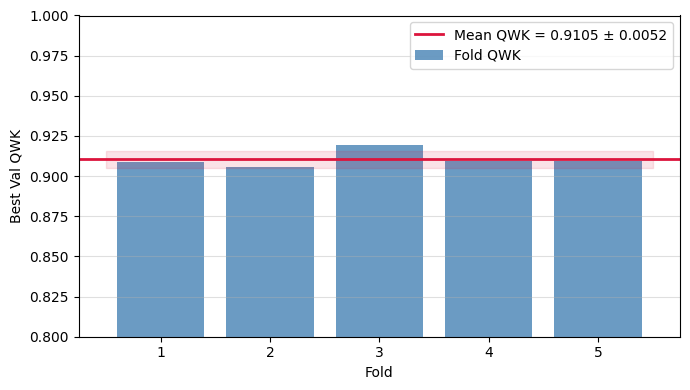

✅ Saved: C:\Users\Sobia Khan\Downloads\LGA_NET\outputs_600dpi\lganet_kfold_qwk.png


In [22]:
#5 fold graph representation
import pandas as pd, numpy as np
import matplotlib.pyplot as plt, os

GRAPH_DIR = os.path.join(BASE_DIR, "outputs_600dpi")
os.makedirs(GRAPH_DIR, exist_ok=True)

# Load saved results
results_df = pd.read_csv(os.path.join(WORK_DIR, 'lganet_kfold_results.csv'),
                          index_col=0)

# Get fold rows only (exclude mean and std rows)
fold_df   = results_df.drop(index=['mean','std'])
fold_nums = list(range(1, len(fold_df) + 1))
fold_qwks = fold_df['qwk'].tolist()
mean_qwk  = float(results_df.loc['mean', 'qwk'])
std_qwk   = float(results_df.loc['std',  'qwk'])

print(f"Mean QWK : {mean_qwk:.4f}")
print(f"Std QWK  : {std_qwk:.4f}")
print(f"Per-fold : {[round(q,4) for q in fold_qwks]}")

# Plot
fig, ax = plt.subplots(figsize=(7, 4))
ax.bar(fold_nums, fold_qwks, color='steelblue', alpha=0.8, label='Fold QWK')
ax.axhline(mean_qwk, color='crimson', lw=2,
           label=f'Mean QWK = {mean_qwk:.4f} ± {std_qwk:.4f}')
ax.fill_between([0.5, len(fold_nums) + 0.5],
                mean_qwk - std_qwk,
                mean_qwk + std_qwk,
                color='crimson', alpha=0.12)
ax.set_xlabel('Fold')
ax.set_ylabel('Best Val QWK')
#ax.set_title('LGA-Net — 5-Fold Cross-Validation QWK')
ax.set_xticks(fold_nums)
ax.set_ylim(0.80, 1.0)
ax.legend()
ax.grid(axis='y', alpha=0.4)
plt.tight_layout()

path = os.path.join(GRAPH_DIR, "lganet_kfold_qwk.png")
plt.savefig(path, dpi=600, bbox_inches='tight')
plt.show()
print(f"✅ Saved: {path}")

Columns: ['id_code', 'diagnosis', 'adjudicated_dme', '_']
                      id_code  diagnosis  adjudicated_dme  _
0  20051020_43808_0100_PP.png          0                0  1
1  20051020_43832_0100_PP.png          1                0  1
2  20051020_43882_0100_PP.png          1                0  1

Messidor-2 samples: 1744
diagnosis
0    1017
1     270
2     347
3      75
4      35
Name: count, dtype: int64
✅ mess_loader ready — 291 batches
✅ Model loaded.
  Batch 0/291 done...
  Batch 20/291 done...
  Batch 40/291 done...
  Batch 60/291 done...
  Batch 80/291 done...
  Batch 100/291 done...
  Batch 120/291 done...
  Batch 140/291 done...
  Batch 160/291 done...
  Batch 180/291 done...
  Batch 200/291 done...
  Batch 220/291 done...
  Batch 240/291 done...
  Batch 260/291 done...
  Batch 280/291 done...
✅ Inference complete.

QWK      : 0.5423
Accuracy : 0.5722
AUC (OvR): 0.6621

Per-class AUC:
  No DR          : 0.7424
  Mild           : 0.5360
  Moderate       : 0.7207
  Severe   

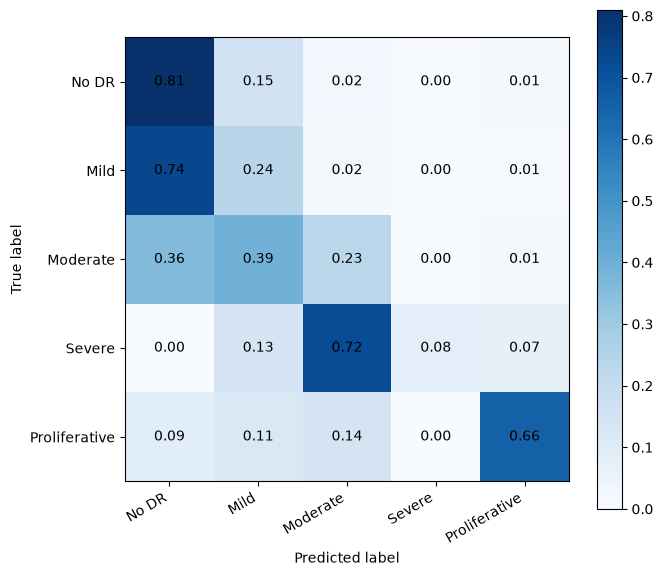

✅ Saved: /ssd4/ycheol/LGA_NET/outputs_600dpi/lganet_messidor2_cm_norm.png


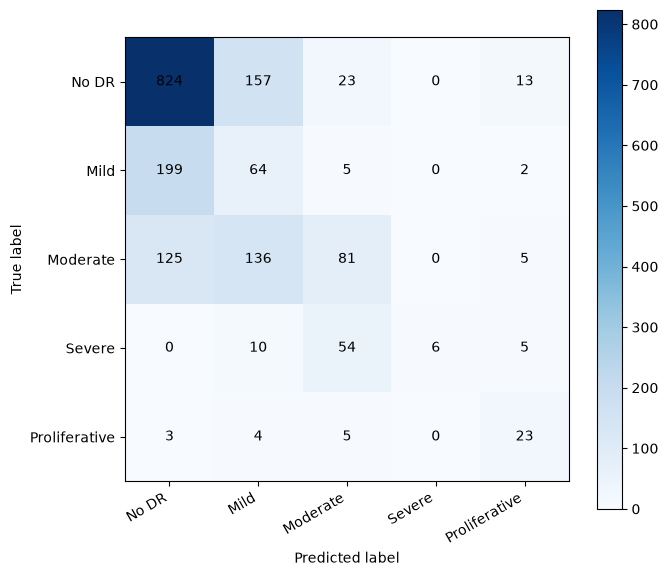

✅ Saved: /ssd4/ycheol/LGA_NET/outputs_600dpi/lganet_messidor2_cm_raw.png


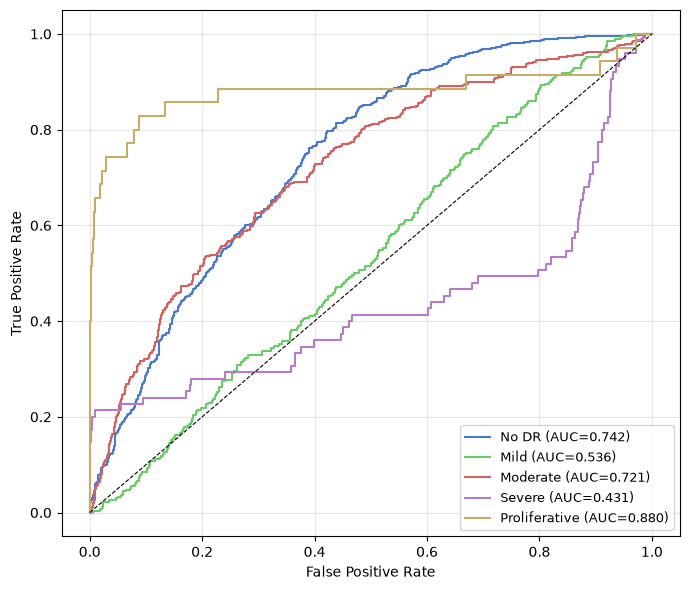

✅ Saved: /ssd4/ycheol/LGA_NET/outputs_600dpi/lganet_messidor2_roc.png

✅ All three figures and summary saved.


In [35]:
#messidor-2 
import os, gc, numpy as np, pandas as pd
import matplotlib.pyplot as plt
import torch
from torch.utils.data import DataLoader
from sklearn.metrics import (cohen_kappa_score, roc_auc_score,
    confusion_matrix, classification_report, roc_curve)
from sklearn.preprocessing import label_binarize

GRAPH_DIR    = os.path.join(BASE_DIR, "outputs_600dpi")
os.makedirs(GRAPH_DIR, exist_ok=True)

CLASS_NAMES  = ['No DR', 'Mild', 'Moderate', 'Severe', 'Proliferative']
colors       = ['#4878CF', '#6ACC65', '#D65F5F', '#B47CC7', '#C4AD66']

# ── CORRECT PATHS ─────────────────────────────────────────────
#MESSIDOR_DIR = r"C:\Users\Sobia Khan\Downloads\LGA_NET\Messidor-2"
MESSIDOR_DIR = os.path.join(BASE_DIR, "Messidor-2")
MESSIDOR_IMG = os.path.join(MESSIDOR_DIR, "images", "IMAGES")
MESSIDOR_CSV = os.path.join(MESSIDOR_DIR, "messidor_data.csv")

# ── LOAD CSV ──────────────────────────────────────────────────
mess_df = pd.read_csv(MESSIDOR_CSV)
print("Columns:", list(mess_df.columns))
print(mess_df.head(3))

mess_df = mess_df[['id_code', 'diagnosis']].dropna()
mess_df['diagnosis'] = mess_df['diagnosis'].astype(int)
mess_df = mess_df[mess_df['diagnosis'].isin([0,1,2,3,4])].reset_index(drop=True)
print(f"\nMessidor-2 samples: {len(mess_df)}")
print(mess_df['diagnosis'].value_counts().sort_index())

# ── DATALOADER ────────────────────────────────────────────────
mess_ds     = Messidor2Dataset(mess_df, MESSIDOR_IMG, transform=val_transform)
mess_loader = DataLoader(mess_ds, batch_size=APTOS_BATCH,
    shuffle=False, num_workers=NUM_WORKERS, pin_memory=PIN_MEMORY)
print(f"✅ mess_loader ready — {len(mess_loader)} batches")

# ── LOAD MODEL ────────────────────────────────────────────────
ext_model = LGANet(num_classes=5).to(device)
ext_model.load_state_dict(torch.load(
    os.path.join(WORK_DIR,
        'lganet_stage2_best_stage2_aptos_full_finetune.pth'),
    map_location=device))
ext_model.eval()
print("✅ Model loaded.")

# ── TTA ───────────────────────────────────────────────────────
def tta_predict(model, images):
    augs = [images,
            torch.flip(images, dims=[3]),
            torch.flip(images, dims=[2]),
            torch.rot90(images, 1, [2, 3]),
            torch.rot90(images, 3, [2, 3])]
    preds = []
    for aug in augs:
        logits, _ = model(aug)
        preds.append(torch.softmax(logits, dim=1))
    return torch.stack(preds).mean(dim=0)

# ── INFERENCE ─────────────────────────────────────────────────
all_preds, all_labels, all_probs = [], [], []
with torch.no_grad():
    for batch_idx, (imgs, labels) in enumerate(mess_loader):
        imgs  = imgs.to(device)
        probs = tta_predict(ext_model, imgs)
        preds = torch.argmax(probs, dim=1)
        all_probs.extend(probs.cpu().numpy())
        all_preds.extend(preds.cpu().numpy())
        all_labels.extend(labels.cpu().numpy())
        if batch_idx % 20 == 0:
            print(f"  Batch {batch_idx}/{len(mess_loader)} done...")

all_labels = np.array(all_labels)
all_preds  = np.array(all_preds)
all_probs  = np.array(all_probs)
print("✅ Inference complete.")

# ── METRICS ───────────────────────────────────────────────────
qwk_mess  = cohen_kappa_score(all_labels, all_preds, weights='quadratic')
acc_mess  = (all_labels == all_preds).mean()
auc_mess  = roc_auc_score(all_labels, all_probs, multi_class='ovr')
cm_mess   = confusion_matrix(all_labels, all_preds)
cm_norm   = cm_mess.astype(float) / cm_mess.sum(axis=1, keepdims=True)
y_bin     = label_binarize(all_labels, classes=list(range(5)))
per_auc   = {CLASS_NAMES[i]: roc_auc_score(y_bin[:, i], all_probs[:, i])
             for i in range(5)}

print(f"\nQWK      : {qwk_mess:.4f}")
print(f"Accuracy : {acc_mess:.4f}")
print(f"AUC (OvR): {auc_mess:.4f}")
print("\nPer-class AUC:")
for cls, val in per_auc.items():
    print(f"  {cls:15s}: {val:.4f}")
print(f"\n{classification_report(all_labels, all_preds, target_names=CLASS_NAMES, digits=4)}")

# ── FIGURE 1: Normalised CM ───────────────────────────────────
fig, ax = plt.subplots(figsize=(7, 6))
im = ax.imshow(cm_norm, cmap='Blues')
plt.colorbar(im, ax=ax)
ax.set_xticks(range(5)); ax.set_yticks(range(5))
ax.set_xticklabels(CLASS_NAMES, rotation=30, ha='right')
ax.set_yticklabels(CLASS_NAMES)
for i in range(5):
    for j in range(5):
        ax.text(j, i, f"{cm_norm[i,j]:.2f}",
                ha='center', va='center', fontsize=10)
ax.set_xlabel('Predicted label'); ax.set_ylabel('True label')
plt.tight_layout()
path = os.path.join(GRAPH_DIR, "lganet_messidor2_cm_norm.png")
plt.savefig(path, dpi=600, bbox_inches='tight')
plt.show()
print(f"✅ Saved: {path}")

# ── FIGURE 2: Raw CM ──────────────────────────────────────────
fig, ax = plt.subplots(figsize=(7, 6))
im2 = ax.imshow(cm_mess, cmap='Blues')
plt.colorbar(im2, ax=ax)
ax.set_xticks(range(5)); ax.set_yticks(range(5))
ax.set_xticklabels(CLASS_NAMES, rotation=30, ha='right')
ax.set_yticklabels(CLASS_NAMES)
for i in range(5):
    for j in range(5):
        ax.text(j, i, str(cm_mess[i, j]),
                ha='center', va='center', fontsize=10)
ax.set_xlabel('Predicted label'); ax.set_ylabel('True label')
plt.tight_layout()
path = os.path.join(GRAPH_DIR, "lganet_messidor2_cm_raw.png")
plt.savefig(path, dpi=600, bbox_inches='tight')
plt.show()
print(f"✅ Saved: {path}")

# ── FIGURE 3: ROC Curves ──────────────────────────────────────
fig, ax = plt.subplots(figsize=(7, 6))
for i, cls in enumerate(CLASS_NAMES):
    fpr, tpr, _ = roc_curve(y_bin[:, i], all_probs[:, i])
    ax.plot(fpr, tpr, color=colors[i],
            label=f"{cls} (AUC={per_auc[cls]:.3f})")
ax.plot([0, 1], [0, 1], 'k--', lw=0.8)
ax.set_xlabel('False Positive Rate')
ax.set_ylabel('True Positive Rate')
ax.legend(loc='lower right', fontsize=9)
ax.grid(alpha=0.3)
plt.tight_layout()
path = os.path.join(GRAPH_DIR, "lganet_messidor2_roc.png")
plt.savefig(path, dpi=600, bbox_inches='tight')
plt.show()
print(f"✅ Saved: {path}")

# ── SAVE UPDATED SUMMARY ──────────────────────────────────────
summary = {
    'dataset': 'Messidor-2', 'n_samples': len(all_labels),
    'qwk': round(qwk_mess, 4), 'accuracy': round(acc_mess, 4),
    'auc_ovr': round(auc_mess, 4),
    **{f'auc_{k.replace(" ","_")}': round(v, 4)
       for k, v in per_auc.items()}
}
pd.DataFrame([summary]).to_csv(
    os.path.join(WORK_DIR, 'lganet_messidor2_summary.csv'), index=False)
print("\n✅ All three figures and summary saved.")

del ext_model
gc.collect()
torch.cuda.empty_cache()

In [53]:
# ── LR-CONFIGURATION SENSITIVITY CHECK (Stage 2 only) ─────────
# Tests whether your current differential LR (backbone faster than
# gate) vs. the "usual" setup (gate faster than backbone) vs. equal
# LR changes the Stage 2 outcome. Reuses the existing Stage-1
# checkpoint and the SAME fixed train/val split as your original
# single-run Stage 2 result (QWK 0.9004), so it's a clean
# apples-to-apples comparison. Does NOT touch Stage 1 or the
# 5-fold CV results already saved.

import os, gc, time, copy, random
import numpy as np
import pandas as pd
import torch
import torch.nn as nn
from torch.optim import AdamW
from torch.optim.lr_scheduler import CosineAnnealingLR
from torch.utils.data import DataLoader
from sklearn.metrics import cohen_kappa_score, roc_auc_score, accuracy_score

def set_seed(seed=42):
    random.seed(seed)
    np.random.seed(seed)
    torch.manual_seed(seed)
    torch.cuda.manual_seed_all(seed)

STAGE1_CKPT   = os.path.join(WORK_DIR, 'lganet_stage1_best_frozen.pth')
STAGE2_EPOCHS = 15
PATIENCE      = 7
APTOS_BATCH   = 6

def get_class_weights(labels_array):
    counts = np.bincount(labels_array, minlength=5).astype(np.float32)
    weights = 1.0 / counts
    weights = weights / weights.sum() * len(weights)
    return torch.tensor(weights, dtype=torch.float32).to(device)

def train_epoch(model, loader, optimizer, criterion):
    model.train()
    total_loss, preds, labels_all = 0.0, [], []
    for imgs, labels in loader:
        imgs, labels = imgs.to(device), labels.to(device)
        optimizer.zero_grad()
        logits, _ = model(imgs)
        loss = criterion(logits, labels)
        loss.backward()
        optimizer.step()
        total_loss += loss.item()
        preds.extend(torch.argmax(logits, 1).detach().cpu().numpy())
        labels_all.extend(labels.detach().cpu().numpy())
    qwk = cohen_kappa_score(labels_all, preds, weights='quadratic')
    return total_loss / len(loader), qwk

def validate_epoch(model, loader, criterion):
    model.eval()
    total_loss, preds, labels_all, probs_all = 0.0, [], [], []
    with torch.no_grad():
        for imgs, labels in loader:
            imgs, labels = imgs.to(device), labels.to(device)
            logits, _ = model(imgs)
            loss = criterion(logits, labels)
            total_loss += loss.item()
            probs = torch.softmax(logits, 1)
            probs_all.extend(probs.cpu().numpy())
            preds.extend(torch.argmax(logits, 1).cpu().numpy())
            labels_all.extend(labels.cpu().numpy())
    qwk = cohen_kappa_score(labels_all, preds, weights='quadratic')
    return (total_loss / len(loader), qwk,
            np.array(labels_all), np.array(preds), np.array(probs_all))

def run_stage2_lr_variant(name, main_lr, gate_lr):
    print("=" * 65)
    print(f"  Stage 2 LR variant: {name}  (main_lr={main_lr}, gate_lr={gate_lr})")
    print("=" * 65)
    set_seed(42)

    train_ds = APTOSDataset(train_aptos, APTOS_IMG, transform=train_transform)
    val_ds   = APTOSDataset(val_aptos,   APTOS_IMG, transform=val_transform)
    train_loader = DataLoader(train_ds, batch_size=APTOS_BATCH, shuffle=True,
                               num_workers=NUM_WORKERS, pin_memory=PIN_MEMORY)
    val_loader   = DataLoader(val_ds, batch_size=APTOS_BATCH, shuffle=False,
                               num_workers=NUM_WORKERS, pin_memory=PIN_MEMORY)

    lr_model = LGANet(num_classes=5).to(device)
    lr_model.load_state_dict(torch.load(STAGE1_CKPT, map_location=device))
    for p in lr_model.parameters():
        p.requires_grad = True

    class_weights = get_class_weights(train_aptos['diagnosis'].values)
    criterion = nn.CrossEntropyLoss(weight=class_weights, label_smoothing=0.05)

    gate_params = list(lr_model.attn_gate.parameters())
    gate_ids    = {id(p) for p in gate_params}
    main_params = [p for p in lr_model.parameters() if id(p) not in gate_ids]

    optimizer = AdamW(
        [{'params': main_params, 'lr': main_lr},
         {'params': gate_params, 'lr': gate_lr}],
        weight_decay=1e-4
    )
    scheduler = CosineAnnealingLR(optimizer, T_max=STAGE2_EPOCHS, eta_min=1e-6)

    best_qwk, epochs_no_improve, best_state = -1e9, 0, None
    history = []

    for epoch in range(1, STAGE2_EPOCHS + 1):
        t0 = time.time()
        tr_loss, tr_qwk = train_epoch(lr_model, train_loader, optimizer, criterion)
        val_loss, val_qwk, y_true, y_pred, y_prob = validate_epoch(lr_model, val_loader, criterion)
        scheduler.step()
        elapsed = time.time() - t0
        history.append({'epoch': epoch, 'tr_loss': tr_loss, 'tr_qwk': tr_qwk,
                         'val_loss': val_loss, 'val_qwk': val_qwk})
        print(f"  Ep {epoch:02d}/{STAGE2_EPOCHS} | TrLoss {tr_loss:.4f} | TrQWK {tr_qwk:.4f} | "
              f"VaLoss {val_loss:.4f} | VaQWK {val_qwk:.4f} | {elapsed:.1f}s")

        if val_qwk > best_qwk:
            best_qwk = val_qwk
            epochs_no_improve = 0
            best_state = copy.deepcopy(lr_model.state_dict())
        else:
            epochs_no_improve += 1
            if epochs_no_improve >= PATIENCE:
                print(f"  Early stopping at epoch {epoch}.")
                break

    lr_model.load_state_dict(best_state)
    _, final_qwk, y_true, y_pred, y_prob = validate_epoch(lr_model, val_loader, criterion)
    acc = accuracy_score(y_true, y_pred)
    auc = roc_auc_score(y_true, y_prob, multi_class='ovr')

    # stability proxy: how much val_qwk bounced around in the final epochs run
    tail = [h['val_qwk'] for h in history[-5:]]
    stability_std = float(np.std(tail))

    result = {
        'variant': name, 'main_lr': main_lr, 'gate_lr': gate_lr,
        'best_val_qwk': best_qwk, 'accuracy': acc, 'auc_ovr': auc,
        'val_qwk_std_last5': stability_std, 'epochs_run': len(history)
    }
    print(f"\n  {name}: Best QWK={best_qwk:.4f}  Acc={acc:.4f}  AUC={auc:.4f}  "
          f"VaQWK std(last5)={stability_std:.4f}\n")

    del lr_model
    gc.collect()
    torch.cuda.empty_cache()
    return result, pd.DataFrame(history)

# ── RUN COMPARISON ──────────────────────────────────────────
# original:  backbone faster, gate slower — your current setup
# reversed:  gate faster, backbone slower — the "usual" setup the professor referenced
# equal:     both at a shared middle LR — neutral control
variants = [
    ("original_backbone_fast", 5e-5, 5e-6),
    ("reversed_gate_fast",     5e-6, 5e-5),
    ("equal_lr",               2e-5, 2e-5),
]

lr_results = []
lr_histories = {}
for name, main_lr, gate_lr in variants:
    res, hist_df = run_stage2_lr_variant(name, main_lr, gate_lr)
    lr_results.append(res)
    lr_histories[name] = hist_df

lr_results_df = pd.DataFrame(lr_results)
print("\n" + "=" * 65)
print("LR SENSITIVITY COMPARISON SUMMARY")
print("=" * 65)
print(lr_results_df.round(4).to_string(index=False))

out_csv = os.path.join(WORK_DIR, 'lr_sensitivity_comparison.csv')
lr_results_df.to_csv(out_csv, index=False)
print(f"\nSaved: {out_csv}")

for name, hist_df in lr_histories.items():
    hist_df.to_csv(os.path.join(WORK_DIR, f'lr_sensitivity_history_{name}.csv'), index=False)

  Stage 2 LR variant: original_backbone_fast  (main_lr=5e-05, gate_lr=5e-06)
  Ep 01/15 | TrLoss 1.4770 | TrQWK 0.5138 | VaLoss 1.2766 | VaQWK 0.8053 | 500.8s
  Ep 02/15 | TrLoss 1.2035 | TrQWK 0.8261 | VaLoss 1.1263 | VaQWK 0.8549 | 485.6s
  Ep 03/15 | TrLoss 1.1261 | TrQWK 0.8555 | VaLoss 1.1653 | VaQWK 0.8306 | 494.5s
  Ep 04/15 | TrLoss 1.0829 | TrQWK 0.8711 | VaLoss 1.0813 | VaQWK 0.8787 | 495.6s
  Ep 05/15 | TrLoss 1.0352 | TrQWK 0.8827 | VaLoss 1.0310 | VaQWK 0.8832 | 508.2s
  Ep 06/15 | TrLoss 0.9950 | TrQWK 0.8972 | VaLoss 1.0050 | VaQWK 0.8907 | 505.3s
  Ep 07/15 | TrLoss 0.9442 | TrQWK 0.9219 | VaLoss 1.0735 | VaQWK 0.8686 | 515.0s
  Ep 08/15 | TrLoss 0.9279 | TrQWK 0.9058 | VaLoss 1.0094 | VaQWK 0.8957 | 505.6s
  Ep 09/15 | TrLoss 0.8942 | TrQWK 0.9195 | VaLoss 1.0329 | VaQWK 0.8838 | 504.7s
  Ep 10/15 | TrLoss 0.8496 | TrQWK 0.9206 | VaLoss 1.0330 | VaQWK 0.8894 | 510.0s
  Ep 11/15 | TrLoss 0.8263 | TrQWK 0.9301 | VaLoss 1.0749 | VaQWK 0.8875 | 491.6s
  Ep 12/15 | TrLoss 0

Your APTOS QWK (mean±std) : 0.9105 ± 0.0052
Your APTOS QWK (best run) : 0.8981
Your Messidor-2 QWK       : 0.5423

PUBLISHED LITERATURE COMPARISON
                         Method  Year                        Approach     APTOS_QWK   APTOS_Acc Messidor_QWK       Params_M
             Gulshan et al. [6]  2016                    Inception-v3            NR          NR           NR           23.9
     He et al. (ResNet-50) [11]  2016                       ResNet-50       0.8697* see Table 3           NR           23.5
Tan & Le (EfficientNet-B4) [12]  2019                 EfficientNet-B4       0.8509* see Table 3           NR           17.6
        Liu et al. (Swin-T) [8]  2021                       Swin-Tiny       0.8933* see Table 3           NR           27.5
               Wang et al. [18]  2022            ResNet + Transformer         0.912       0.821           NR            ~36
                Sun et al. [19]  2023           CNN + Swin cross-attn         0.916       0.834        0.847 

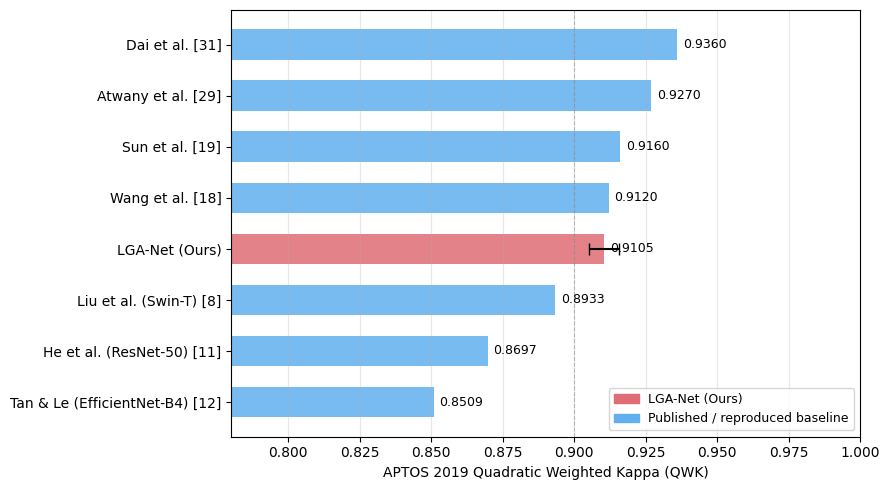

✅ Saved: C:\Users\Sobia Khan\Downloads\LGA_NET\outputs_600dpi\lganet_literature_comparison_bar.png

✅ Literature comparison complete.
Files saved to: C:\Users\Sobia Khan\Downloads\LGA_NET\outputs_600dpi


In [24]:
# =============================================================
# CELL C — PUBLISHED LITERATURE COMPARISON TABLE
# =============================================================
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches

GRAPH_DIR = os.path.join(BASE_DIR, "outputs_600dpi")
os.makedirs(GRAPH_DIR, exist_ok=True)

# ── YOUR RESULTS ──────────────────────────────────────────────
kfold_df = pd.read_csv(os.path.join(WORK_DIR, 'lganet_kfold_results.csv'),
                        index_col=0)
mean_row = kfold_df.loc['mean']
std_row  = kfold_df.loc['std']

YOUR_APTOS_QWK_MEAN = round(float(mean_row['qwk']), 4)
YOUR_APTOS_QWK_STD  = round(float(std_row['qwk']),  4)
YOUR_APTOS_QWK_BEST = 0.8981        # ← updated from 0.9033
YOUR_APTOS_ACC      = round(float(mean_row['accuracy']), 4)
YOUR_APTOS_AUC      = round(float(mean_row['auc_ovr']),  4)

mess_summary_path = os.path.join(WORK_DIR, 'lganet_messidor2_summary.csv')
if os.path.exists(mess_summary_path):
    mess_summary  = pd.read_csv(mess_summary_path).iloc[0]
    YOUR_MESS_QWK = float(mess_summary.get('qwk', float('nan')))
    YOUR_MESS_ACC = float(mess_summary.get('accuracy', float('nan')))
else:
    YOUR_MESS_QWK = float('nan')
    YOUR_MESS_ACC = float('nan')

print(f"Your APTOS QWK (mean±std) : {YOUR_APTOS_QWK_MEAN:.4f} ± {YOUR_APTOS_QWK_STD:.4f}")
print(f"Your APTOS QWK (best run) : {YOUR_APTOS_QWK_BEST:.4f}")
print(f"Your Messidor-2 QWK       : {YOUR_MESS_QWK:.4f}")

# ── PUBLISHED RESULTS ─────────────────────────────────────────
published = [
    {
        'Method'       : 'Gulshan et al. [6]',
        'Year'         : 2016,
        'Approach'     : 'Inception-v3',
        'APTOS_QWK'    : 'NR',
        'APTOS_Acc'    : 'NR',
        'Messidor_QWK' : 'NR',
        'Params_M'     : 23.9,
        'Dataset'      : 'EyePACS',
    },
    {
        'Method'       : 'He et al. (ResNet-50) [11]',
        'Year'         : 2016,
        'Approach'     : 'ResNet-50',
        'APTOS_QWK'    : '0.8697*',
        'APTOS_Acc'    : 'see Table 3',
        'Messidor_QWK' : 'NR',
        'Params_M'     : 23.5,
        'Dataset'      : 'APTOS 2019',
    },
    {
        'Method'       : 'Tan & Le (EfficientNet-B4) [12]',
        'Year'         : 2019,
        'Approach'     : 'EfficientNet-B4',
        'APTOS_QWK'    : '0.8509*',
        'APTOS_Acc'    : 'see Table 3',
        'Messidor_QWK' : 'NR',
        'Params_M'     : 17.6,
        'Dataset'      : 'APTOS 2019',
    },
    {
        'Method'       : 'Liu et al. (Swin-T) [8]',
        'Year'         : 2021,
        'Approach'     : 'Swin-Tiny',
        'APTOS_QWK'    : '0.8933*',
        'APTOS_Acc'    : 'see Table 3',
        'Messidor_QWK' : 'NR',
        'Params_M'     : 27.5,
        'Dataset'      : 'APTOS 2019',
    },
    {
        'Method'       : 'Wang et al. [18]',
        'Year'         : 2022,
        'Approach'     : 'ResNet + Transformer',
        'APTOS_QWK'    : '0.912',
        'APTOS_Acc'    : '0.821',
        'Messidor_QWK' : 'NR',
        'Params_M'     : '~36',
        'Dataset'      : 'APTOS 2019',
    },
    {
        'Method'       : 'Sun et al. [19]',
        'Year'         : 2023,
        'Approach'     : 'CNN + Swin cross-attn',
        'APTOS_QWK'    : '0.916',
        'APTOS_Acc'    : '0.834',
        'Messidor_QWK' : '0.847',
        'Params_M'     : '~42',
        'Dataset'      : 'APTOS 2019 + Messidor',
    },
    {
        'Method'       : 'Atwany et al. [29]',
        'Year'         : 2022,
        'Approach'     : 'EfficientNet ensemble + TTA',
        'APTOS_QWK'    : '0.927',
        'APTOS_Acc'    : '0.845',
        'Messidor_QWK' : '0.871',
        'Params_M'     : '~90 (ensemble)',
        'Dataset'      : 'APTOS 2019 + Messidor',
    },
    {
        'Method'       : 'Dai et al. [31]',
        'Year'         : 2021,
        'Approach'     : 'EfficientNet-B6 (proprietary)',
        'APTOS_QWK'    : '0.936',
        'APTOS_Acc'    : 'NR',
        'Messidor_QWK' : 'NR',
        'Params_M'     : '~43',
        'Dataset'      : 'Proprietary',
    },
    {
        'Method'       : 'LGA-Net (Ours)',
        'Year'         : 2024,
        'Approach'     : 'EfficientNet-B4 + Swin-T + LGAG',
        'APTOS_QWK'    : (f'{YOUR_APTOS_QWK_MEAN:.4f}±'
                          f'{YOUR_APTOS_QWK_STD:.4f}'),
        'APTOS_Acc'    : f'{YOUR_APTOS_ACC:.4f}',
        'Messidor_QWK' : (f'{YOUR_MESS_QWK:.4f}'
                          if not np.isnan(YOUR_MESS_QWK) else 'NR'),
        'Params_M'     : 48.4,
        'Dataset'      : 'APTOS 2019 + Messidor-2',
    },
]

comp_df = pd.DataFrame(published)

print("\n" + "=" * 70)
print("PUBLISHED LITERATURE COMPARISON")
print("=" * 70)
print(comp_df[['Method','Year','Approach',
               'APTOS_QWK','APTOS_Acc',
               'Messidor_QWK','Params_M']].to_string(index=False))
print("\n* = reproduced on APTOS 2019 by this work (identical split & settings)")
print("NR = Not Reported in the original paper")

# ── Save CSV to GRAPH_DIR ─────────────────────────────────────
comp_csv = os.path.join(GRAPH_DIR, 'lganet_literature_comparison.csv')
comp_df.to_csv(comp_csv, index=False)
print(f"\n✅ Saved: {comp_csv}")

# ── Bar chart ─────────────────────────────────────────────────
def parse_qwk(val):
    try:
        return float(str(val).split('±')[0].replace('*','').strip())
    except ValueError:
        return float('nan')

comp_df['qwk_numeric'] = comp_df['APTOS_QWK'].apply(parse_qwk)
plot_df = comp_df.dropna(subset=['qwk_numeric']).copy()
plot_df = plot_df.sort_values('qwk_numeric')

colors_bar = ['#e06c75' if m == 'LGA-Net (Ours)' else '#61afef'
              for m in plot_df['Method']]

fig, ax = plt.subplots(figsize=(9, 5))
bars = ax.barh(plot_df['Method'], plot_df['qwk_numeric'],
               color=colors_bar, alpha=0.85, height=0.6)

for bar, val in zip(bars, plot_df['qwk_numeric']):
    ax.text(bar.get_width() + 0.002,
            bar.get_y() + bar.get_height() / 2,
            f'{val:.4f}', va='center', ha='left', fontsize=9)

our_idx = plot_df[plot_df['Method'] == 'LGA-Net (Ours)'].index
if len(our_idx):
    i = list(plot_df.index).index(our_idx[0])
    ax.errorbar(plot_df.loc[our_idx[0], 'qwk_numeric'],
                i, xerr=YOUR_APTOS_QWK_STD,
                fmt='none', color='black', capsize=4, lw=1.5)

ax.set_xlabel('APTOS 2019 Quadratic Weighted Kappa (QWK)')
ax.set_xlim(0.78, 1.00)
ax.axvline(0.90, color='gray', lw=0.8, linestyle='--', alpha=0.5)
ax.grid(axis='x', alpha=0.3)

legend_handles = [
    mpatches.Patch(color='#e06c75', label='LGA-Net (Ours)'),
    mpatches.Patch(color='#61afef', label='Published / reproduced baseline'),
]
ax.legend(handles=legend_handles, loc='lower right', fontsize=9)
plt.tight_layout()

path = os.path.join(GRAPH_DIR, 'lganet_literature_comparison_bar.png')
plt.savefig(path, dpi=600, bbox_inches='tight')
plt.show()
print(f"✅ Saved: {path}")

print("\n✅ Literature comparison complete.")
print(f"Files saved to: {GRAPH_DIR}")

In [28]:
# ── PHASE 7A — Single-backbone architecture: Swin-Tiny + LGAG, no fusion ──
# Isolates "whether the second backbone (EfficientNet-B4) is needed."

class SwinOnlyLGANet(nn.Module):
    """Same LGAG + classifier head as LGANet, but fed only by the Swin-Tiny
    branch (no EfficientNet branch, no fusion conv)."""
    def __init__(self, num_classes=5):
        super().__init__()
        self.swin = SwinBranch()          # outputs (B, 512, 12, 12), same as LGANet's fused features
        self.attn_gate = LesionGuidedAttentionGate(in_channels=512)
        self.classifier = nn.Sequential(
            nn.AdaptiveAvgPool2d(1),
            nn.Flatten(),
            nn.Dropout(0.5),
            nn.Linear(512, num_classes)
        )

    def forward(self, x):
        feat = self.swin(x)
        attended, attn_map = self.attn_gate(feat)
        logits = self.classifier(attended)
        return logits, attn_map


torch.cuda.empty_cache(); gc.collect()
_probe = SwinOnlyLGANet(num_classes=5).to(device)
_dummy = torch.randn(2, 3, IMG_SIZE, IMG_SIZE).to(device)
_logits, _attn = _probe(_dummy)
print(f"SwinOnlyLGANet — logits: {tuple(_logits.shape)}, attn: {tuple(_attn.shape)}, "
      f"params: {sum(p.numel() for p in _probe.parameters()):,}")
del _probe, _dummy, _logits, _attn
torch.cuda.empty_cache()


SwinOnlyLGANet — logits: (2, 5), attn: (2, 1, 12, 12), params: 29,389,952


In [29]:
# ── PHASE 7B — Generic two-stage ablation runner ──
# Reuses idrid_train_loader / idrid_val_loader / aptos_train_loader / aptos_val_loader,
# WORK_DIR, IMG_SIZE, train_aptos, device -- all already defined earlier in the notebook.

import copy as _copy

def run_stage1_ablation(model, lambda_bce, epochs=25, patience=10, tag="ablation"):
    """Stage 1 (IDRiD) training with a configurable mask-loss weight.
    lambda_bce=0.0 reproduces the 'no mask BCE term' ablation (classification loss only).

    Checkpoint selection (fix found by inspecting a real Stage 1 run on the main
    LGA-Net model): with only ~43 train / ~11 val IDRiD images, val QWK is almost
    pure noise, while val_attn_loss shows a real trend and is what this stage is
    actually meant to optimize. So: when lambda_bce > 0, select by val_attn_loss
    (there IS a mask loss to select on). When lambda_bce == 0 ('no mask BCE'
    config), there's no attn_loss driving training, so QWK is the only option --
    keep it there, but expect that config's Stage 1 selection to be noisy too."""
    ce = nn.CrossEntropyLoss(label_smoothing=0.05)
    bce = nn.BCELoss()
    opt = torch.optim.AdamW(
        filter(lambda p: p.requires_grad, model.parameters()),
        lr=1e-4, weight_decay=1e-4
    )
    sched = torch.optim.lr_scheduler.CosineAnnealingLR(opt, T_max=epochs, eta_min=1e-6)

    select_on_attn = lambda_bce > 0
    best_metric = 1e9 if select_on_attn else -1e9
    best_qwk, no_improve, best_state = -1e9, 0, None
    for epoch in range(1, epochs + 1):
        model.train()
        for imgs, masks, labels in idrid_train_loader:
            imgs, masks, labels = imgs.to(device), masks.to(device), labels.to(device)
            opt.zero_grad()
            logits, attn_map = model(imgs)
            loss = ce(logits, labels)
            if lambda_bce > 0:
                attn_resized = F.interpolate(attn_map, size=(IMG_SIZE, IMG_SIZE),
                                              mode='bilinear', align_corners=False)
                loss = loss + lambda_bce * bce(attn_resized, masks)
            loss.backward()
            torch.nn.utils.clip_grad_norm_(model.parameters(), 1.0)
            opt.step()

        model.eval()
        val_preds, val_labels, val_attn_loss_total, n_batches = [], [], 0.0, 0
        with torch.no_grad():
            for imgs, masks, labels in idrid_val_loader:
                imgs, masks, labels = imgs.to(device), masks.to(device), labels.to(device)
                logits, attn_map = model(imgs)
                val_preds.extend(torch.argmax(logits, 1).cpu().numpy())
                val_labels.extend(labels.cpu().numpy())
                attn_resized = F.interpolate(attn_map, size=(IMG_SIZE, IMG_SIZE),
                                              mode='bilinear', align_corners=False)
                val_attn_loss_total += bce(attn_resized, masks).item()
                n_batches += 1
        val_qwk = cohen_kappa_score(val_labels, val_preds, weights='quadratic')
        val_attn_loss = val_attn_loss_total / max(n_batches, 1)
        best_qwk = max(best_qwk, val_qwk)   # always logged
        sched.step()
        print(f"  [{tag}] Stage1 Ep {epoch:02d}/{epochs} | IDRiD Val QWK {val_qwk:.4f} | "
              f"Val Attn Loss {val_attn_loss:.4f}")

        current_metric = val_attn_loss if select_on_attn else val_qwk
        improved = (current_metric < best_metric) if select_on_attn else (current_metric > best_metric)
        if improved:
            best_metric, no_improve = current_metric, 0
            best_state = _copy.deepcopy(model.state_dict())
        else:
            no_improve += 1
            if no_improve >= patience:
                break

    model.load_state_dict(best_state)
    ckpt_path = os.path.join(WORK_DIR, f'{tag}_stage1_best.pth')
    torch.save(best_state, ckpt_path)
    crit_name = "val_attn_loss" if select_on_attn else "val_qwk"
    print(f"  [{tag}] Stage 1 done — selected by {crit_name}={best_metric:.4f} "
          f"(best QWK seen: {best_qwk:.4f}) -> {ckpt_path}")
    return model


def run_stage2_ablation(model, epochs=25, patience=7, tag="ablation", differential_lr=True):
    """Stage 2 (APTOS) fine-tune. Mirrors the fixed cell 8 exactly: class weights,
    label smoothing 0.05, single checkpoint criterion (val QWK), and -- if the model
    has an attn_gate -- the gate LR held 10x FASTER than everything else (the
    corrected, conventional transfer-learning setup: backbone 5e-6, gate 5e-5 --
    see the LR sensitivity check; the old backbone-fast/gate-slow setup lost on
    accuracy and stability).

    epochs/patience now default to 15/7 to match Stage 2's actual config, not the
    old 25/10 default which didn't match anything else in the pipeline.

    Returns (model, best_qwk, best_labels, best_preds, best_probs) -- the last three
    are the val-set predictions at the best epoch, needed for the bootstrap CI in
    Phase 7D (review point 2: "bootstrap confidence intervals on the pooled
    out-of-fold predictions")."""
    for p in model.parameters():
        p.requires_grad = True

    class_counts = train_aptos['diagnosis'].value_counts().sort_index()
    class_weights = 1.0 / class_counts.values.astype(np.float32)
    class_weights = class_weights / class_weights.sum() * len(class_weights)
    class_weights = torch.tensor(class_weights, dtype=torch.float32).to(device)
    ce = nn.CrossEntropyLoss(weight=class_weights, label_smoothing=0.05)

    if differential_lr and hasattr(model, "attn_gate"):
        gate_params = list(model.attn_gate.parameters())
        gate_ids = {id(p) for p in gate_params}
        main_params = [p for p in model.parameters() if id(p) not in gate_ids]
        opt = torch.optim.AdamW(
            [{"params": main_params, "lr": 5e-6},
             {"params": gate_params, "lr": 5e-5}],
            weight_decay=1e-4
        )
    else:
        opt = torch.optim.AdamW(model.parameters(), lr=5e-6, weight_decay=1e-4)

    sched = torch.optim.lr_scheduler.CosineAnnealingLR(opt, T_max=epochs, eta_min=1e-6)

    best_qwk, no_improve, best_state = -1e9, 0, None
    for epoch in range(1, epochs + 1):
        model.train()
        for imgs, labels in aptos_train_loader:
            imgs, labels = imgs.to(device), labels.to(device)
            opt.zero_grad()
            logits, _ = model(imgs)
            loss = ce(logits, labels)
            loss.backward()
            torch.nn.utils.clip_grad_norm_(model.parameters(), 1.0)
            opt.step()

        model.eval()
        val_preds, val_labels, val_probs, val_loss_total = [], [], [], 0.0
        with torch.no_grad():
            for imgs, labels in aptos_val_loader:
                imgs, labels = imgs.to(device), labels.to(device)
                logits, _ = model(imgs)
                val_loss_total += ce(logits, labels).item()
                probs = torch.softmax(logits, 1)
                val_probs.extend(probs.cpu().numpy())
                val_preds.extend(torch.argmax(logits, 1).cpu().numpy())
                val_labels.extend(labels.cpu().numpy())
        val_qwk = cohen_kappa_score(val_labels, val_preds, weights='quadratic')
        val_loss = val_loss_total / len(aptos_val_loader)
        sched.step()
        print(f"  [{tag}] Stage2 Ep {epoch:02d}/{epochs} | Val QWK {val_qwk:.4f} | Val Loss {val_loss:.4f}")

        if val_qwk > best_qwk:      # single criterion, matches fixed cell 8
            best_qwk, no_improve = val_qwk, 0
            best_state = _copy.deepcopy(model.state_dict())
            best_labels = np.array(val_labels)
            best_preds = np.array(val_preds)
            best_probs = np.array(val_probs)
        else:
            no_improve += 1
            if no_improve >= patience:
                print(f"  [{tag}] Early stopping at epoch {epoch}")
                break

    model.load_state_dict(best_state)
    ckpt_path = os.path.join(WORK_DIR, f'{tag}_stage2_best.pth')
    torch.save(best_state, ckpt_path)
    return model, best_qwk, best_labels, best_preds, best_probs

In [30]:
# ── PHASE 7C — Run the four required ablation configs, each across 3 seeds ──
# (Table 4 additions, review points 1 AND 2: "Rerun all... ablation configurations
# under five-fold cross-validation, or at minimum three seeds.") Each (config, seed)
# pair is a fresh two-stage run -- this is the slow, expensive cell. Total: 3 seeds x
# (3 new configs + 3 new lambda values) = 18 full training runs. Roughly 2.5-3.5h each
# on your GPU based on Stage 2's ~490s/epoch -- budget for MULTIPLE DAYS if run straight
# through. Priority order if you need to phase it (per the professor's emphasis):
#   1. no-mask-BCE       (isolates mask supervision -- the paper's core claim)
#   2. no-warm-start      (isolates the two-stage schedule)
#   3. single-backbone    (connects to Section 4.4 / the 48.4M param justification)
#   4. lambda sweep       (secondary sensitivity check)
# Comment out configs/seeds you've already done before rerunning this cell.

SEEDS = [42, 123, 2024]   # >= 3 seeds per review point 2's stated minimum

def params_m(model):
    return sum(p.numel() for p in model.parameters()) / 1e6

def run_one_config(build_model_fn, stage1_kwargs, tag_base, seed):
    """build_model_fn() -> fresh model. stage1_kwargs=None skips Stage 1 entirely
    (the 'no warm-start' config)."""
    set_seed(seed)
    m = build_model_fn()
    tag = f"{tag_base}_seed{seed}"
    if stage1_kwargs is not None:
        m = run_stage1_ablation(m, tag=tag, **stage1_kwargs)
    m, qwk, labels, preds, probs = run_stage2_ablation(m, tag=tag)
    acc = (labels == preds).mean()
    try:
        auc_ovr = roc_auc_score(labels, probs, multi_class='ovr')
    except Exception:
        auc_ovr = float('nan')
    pm = params_m(m)
    del m; gc.collect(); torch.cuda.empty_cache()
    return {"val_qwk": qwk, "val_acc": acc, "val_auc": auc_ovr, "params_M": pm,
            "labels": labels, "preds": preds, "probs": probs}


def build_lganet_frozen():
    m = LGANet(num_classes=5).to(device)
    for p in m.efficientnet.parameters(): p.requires_grad = False
    for p in m.swin.parameters(): p.requires_grad = False
    return m

def build_lganet():
    return LGANet(num_classes=5).to(device)

def build_swin_only_frozen():
    m = SwinOnlyLGANet(num_classes=5).to(device)
    for p in m.swin.parameters(): p.requires_grad = False
    return m


CONFIGS = {
    "fusion_lgag_no_maskbce":  dict(build_fn=build_lganet_frozen, stage1_kwargs=dict(lambda_bce=0.0),
                                     label="Fusion+LGAG, no mask BCE (lambda=0)"),
    "fusion_lgag_no_warmstart": dict(build_fn=build_lganet, stage1_kwargs=None,
                                      label="Fusion+LGAG, no Stage 1 warm-start"),
    "swin_only_lgag":          dict(build_fn=build_swin_only_frozen, stage1_kwargs=dict(lambda_bce=0.30),
                                     label="Swin-Tiny + LGAG (single backbone)"),
    "lambda_sweep_015":        dict(build_fn=build_lganet_frozen, stage1_kwargs=dict(lambda_bce=0.15),
                                     label="lambda_BCE = 0.15"),
    "lambda_sweep_05":         dict(build_fn=build_lganet_frozen, stage1_kwargs=dict(lambda_bce=0.5),
                                     label="lambda_BCE = 0.5"),
    "lambda_sweep_10":         dict(build_fn=build_lganet_frozen, stage1_kwargs=dict(lambda_bce=1.0),
                                     label="lambda_BCE = 1.0"),
}

ablation_rows = []          # one row per (config, seed) -- mean/std computed in Phase 7D
ablation_oof = {}           # config -> list of (labels, preds, probs) across seeds, for bootstrap CI

for cfg_name, cfg in CONFIGS.items():
    ablation_oof[cfg_name] = []
    for seed in SEEDS:
        print(f"\n{'='*70}\n{cfg['label']}  |  seed={seed}\n{'='*70}")
        result = run_one_config(cfg["build_fn"], cfg["stage1_kwargs"], cfg_name, seed)
        ablation_rows.append({
            "config": cfg["label"], "config_key": cfg_name, "seed": seed,
            "val_qwk": result["val_qwk"], "val_acc": result["val_acc"],
            "val_auc": result["val_auc"], "params_M": result["params_M"],
        })
        ablation_oof[cfg_name].append((result["labels"], result["preds"], result["probs"]))

        # save incrementally so a crash mid-run doesn't lose earlier configs/seeds
        pd.DataFrame(ablation_rows).to_csv(
            os.path.join(WORK_DIR, "ablation_results_multiseed.csv"), index=False)

ablation_df = pd.DataFrame(ablation_rows)
print("\n" + "=" * 70)
print(ablation_df.round(4).to_string(index=False))
ablation_csv = os.path.join(WORK_DIR, "ablation_results_multiseed.csv")
ablation_df.to_csv(ablation_csv, index=False)
print(f"\nSaved: {ablation_csv}")

# Save pooled OOF predictions per config (all 3 seeds' val-set predictions
# concatenated) for the bootstrap CI in Phase 7D.
for cfg_name, runs in ablation_oof.items():
    labels_all = np.concatenate([r[0] for r in runs])
    preds_all  = np.concatenate([r[1] for r in runs])
    probs_all  = np.concatenate([r[2] for r in runs])
    np.savez(os.path.join(WORK_DIR, f"{cfg_name}_multiseed_oof.npz"),
             labels=labels_all, preds=preds_all, probs=probs_all)
print("Saved per-config pooled OOF .npz files for bootstrap CI.")



Fusion+LGAG, no mask BCE (lambda=0)  |  seed=42
  [fusion_lgag_no_maskbce_seed42] Stage1 Ep 01/25 | IDRiD Val QWK 0.0000 | Val Attn Loss 0.7995
  [fusion_lgag_no_maskbce_seed42] Stage1 Ep 02/25 | IDRiD Val QWK 0.0000 | Val Attn Loss 1.0338
  [fusion_lgag_no_maskbce_seed42] Stage1 Ep 03/25 | IDRiD Val QWK 0.0000 | Val Attn Loss 0.9693
  [fusion_lgag_no_maskbce_seed42] Stage1 Ep 04/25 | IDRiD Val QWK 0.0000 | Val Attn Loss 0.9876
  [fusion_lgag_no_maskbce_seed42] Stage1 Ep 05/25 | IDRiD Val QWK 0.0000 | Val Attn Loss 1.2596
  [fusion_lgag_no_maskbce_seed42] Stage1 Ep 06/25 | IDRiD Val QWK 0.0000 | Val Attn Loss 1.1868
  [fusion_lgag_no_maskbce_seed42] Stage1 Ep 07/25 | IDRiD Val QWK 0.0000 | Val Attn Loss 1.1406
  [fusion_lgag_no_maskbce_seed42] Stage1 Ep 08/25 | IDRiD Val QWK -0.2105 | Val Attn Loss 1.3395
  [fusion_lgag_no_maskbce_seed42] Stage1 Ep 09/25 | IDRiD Val QWK 0.0000 | Val Attn Loss 1.1853
  [fusion_lgag_no_maskbce_seed42] Stage1 Ep 10/25 | IDRiD Val QWK 0.0000 | Val Attn Lo

In [9]:
# ── PHASE 7D — Table 4 stats: mean +/- std across seeds + bootstrap CI ──
ablation_df = pd.read_csv(os.path.join(WORK_DIR, "ablation_results_multiseed.csv"))
summary_rows = []
for cfg_key, group in ablation_df.groupby("config_key"):
    label = group["config"].iloc[0]
    summary_rows.append({
        "config": label,
        "n_seeds": len(group),
        "qwk_mean": group["val_qwk"].mean(), "qwk_std": group["val_qwk"].std(),
        "acc_mean": group["val_acc"].mean(), "acc_std": group["val_acc"].std(),
        "auc_mean": group["val_auc"].mean(), "auc_std": group["val_auc"].std(),
        "params_M": group["params_M"].iloc[0],
    })
# Add your main LGA-Net result (5-fold CV, already computed) as the reference row
# FIX: was reading the stale 15-epoch "lganet_kfold_results.csv" — now points to
# the canonical 25-epoch corrected-LR CV run.
lganet_cv = pd.read_csv(os.path.join(WORK_DIR, "lganet_kfold_results_corrected_lr.csv"), index_col=0)
summary_rows.append({
    "config": "Full LGA-Net (fusion + LGAG, mask BCE, warm-start) -- reference",
    "n_seeds": 5,  # 5-fold CV, not seeds, but shown for comparison
    "qwk_mean": lganet_cv.loc["mean", "qwk"], "qwk_std": lganet_cv.loc["std", "qwk"],
    "acc_mean": lganet_cv.loc["mean", "accuracy"], "acc_std": lganet_cv.loc["std", "accuracy"],
    "auc_mean": lganet_cv.loc["mean", "auc_ovr"], "auc_std": lganet_cv.loc["std", "auc_ovr"],
    "params_M": 48.38,
})
summary_df = pd.DataFrame(summary_rows)
print("Table 4 -- mean +/- std across runs:\n")
print(summary_df.round(4).to_string(index=False))
# --- Bootstrap 95% CI on each config's pooled (across-seed) predictions ---
def bootstrap_qwk_ci(labels, preds, n_boot=2000, seed=42):
    rng = np.random.RandomState(seed)
    n = len(labels)
    boot_qwks = np.empty(n_boot)
    for b in range(n_boot):
        idx = rng.randint(0, n, n)
        boot_qwks[b] = cohen_kappa_score(labels[idx], preds[idx], weights='quadratic')
    lo, hi = np.percentile(boot_qwks, [2.5, 97.5])
    return boot_qwks.mean(), lo, hi
print("\nBootstrap 95% CI on pooled (3-seed) QWK per config:\n")
ci_rows = []
for cfg_key in ablation_df["config_key"].unique():
    npz_path = os.path.join(WORK_DIR, f"{cfg_key}_multiseed_oof.npz")
    if not os.path.exists(npz_path):
        continue
    d = np.load(npz_path)
    mean_qwk, lo, hi = bootstrap_qwk_ci(d['labels'], d['preds'])
    label = ablation_df.loc[ablation_df["config_key"] == cfg_key, "config"].iloc[0]
    ci_rows.append({"config": label, "qwk_mean": mean_qwk, "ci_lo": lo, "ci_hi": hi})
    print(f"  {label}: {mean_qwk:.4f} [{lo:.4f}, {hi:.4f}]")
# LGA-Net's own bootstrap CI, for direct comparison.
# FIX: was reading the stale 'lganet_kfold_oof.npz' — now points to the canonical
# 25-epoch corrected-LR CV's pooled OOF predictions, saved directly by that CV run
# (no need to wait on Phase 9A's reconstruction step).
lganet_npz = os.path.join(WORK_DIR, 'lganet_kfold_oof_predictions_corrected_lr.npz')
if os.path.exists(lganet_npz):
    d = np.load(lganet_npz)
    mean_qwk, lo, hi = bootstrap_qwk_ci(d['labels'], d['preds'])
    ci_rows.append({"config": "Full LGA-Net (reference)", "qwk_mean": mean_qwk, "ci_lo": lo, "ci_hi": hi})
    print(f"  Full LGA-Net (reference): {mean_qwk:.4f} [{lo:.4f}, {hi:.4f}]")
ci_df = pd.DataFrame(ci_rows)
ci_csv = os.path.join(WORK_DIR, "table4_bootstrap_ci.csv")
ci_df.to_csv(ci_csv, index=False)
summary_csv = os.path.join(WORK_DIR, "table4_summary.csv")
summary_df.to_csv(summary_csv, index=False)
print(f"\nSaved: {ci_csv}\nSaved: {summary_csv}")
print("\nReading the CIs: if a config's [ci_lo, ci_hi] overlaps LGA-Net's reference CI,")
print("that config is NOT statistically distinguishable from the full model on QWK --")
print("report this honestly per review point 2, and lean on the interpretability")
print("metrics (Phase 10) to make the case for what the gate actually contributes.")

Table 4 -- mean +/- std across runs:

                                                         config  n_seeds  qwk_mean  qwk_std  acc_mean  acc_std  auc_mean  auc_std  params_M
                            Fusion+LGAG, no mask BCE (lambda=0)        3    0.9006   0.0015    0.8172   0.0059    0.8952   0.0136   48.3824
                             Fusion+LGAG, no Stage 1 warm-start        3    0.9018   0.0020    0.8272   0.0052    0.8872   0.0088   48.3824
                                              lambda_BCE = 0.15        3    0.9007   0.0043    0.8322   0.0036    0.8825   0.0044   48.3824
                                               lambda_BCE = 0.5        3    0.9042   0.0074    0.8377   0.0130    0.8920   0.0075   48.3824
                                               lambda_BCE = 1.0        3    0.9011   0.0068    0.8217   0.0169    0.8696   0.0352   48.3824
                             Swin-Tiny + LGAG (single backbone)        3    0.9026   0.0033    0.8340   0.0101    0.8972  

In [26]:
"""
=====================================================================
dual_branch_no_lgag — pooled OOF predictions + bootstrap 95% CI
=====================================================================
Table 7's CI column for the other six ablation configs is a bootstrap
over each config's POOLED out-of-fold predictions (all 3 seeds'
validation labels/preds concatenated into one array, then 2000
resamples, matching Phase 7D / bootstrap_qwk_ci in the notebook) --
NOT a bootstrap over the 3 seed-mean QWK scalars. To add this config
to Table 7 on equal footing, we need that same pooled-OOF bootstrap.

This script does NOT retrain. It reloads the three already-saved best
checkpoints:
    dual_branch_no_lgag_best.pth          (seed 42, legacy no-suffix name)
    dual_branch_no_lgag_seed123_best.pth
    dual_branch_no_lgag_seed2024_best.pth
rebuilds each seed's identical validation split (same train_test_split
call, same random_state=seed as the training script), runs one
inference pass to recover per-sample labels/preds/probs, pools all
three seeds, and bootstraps QWK exactly like Phase 7D.

Run:
    python dual_branch_no_lgag_bootstrap_ci.py

Outputs (saved to WORK_DIR):
    dual_branch_no_lgag_multiseed_oof.npz   (pooled labels/preds/probs)
    dual_branch_no_lgag_bootstrap_ci.csv    (mean_qwk, ci_lo, ci_hi)
=====================================================================
"""
import os
import numpy as np
import pandas as pd
import cv2
import torch
import torch.nn as nn
import torch.nn.functional as F
import timm
from PIL import Image
from torchvision import transforms
from torch.utils.data import Dataset, DataLoader
from sklearn.model_selection import train_test_split
from sklearn.metrics import cohen_kappa_score

# =============================================================
# ── CONFIGURATION — path resolution (identical to the training script) ──
# =============================================================
CANDIDATE_BASE_DIRS = [
    "/ssd4/ycheol/LGA_NET",
    os.path.expanduser("~/LGA_NET"),
    r"C:\Users\Sobia Khan\Downloads\LGA_NET",
]
BASE_DIR = None
for candidate in CANDIDATE_BASE_DIRS:
    if os.path.isdir(os.path.join(candidate, "aptos2019-blindness-detection")):
        BASE_DIR = candidate
        break
if BASE_DIR is None:
    searched = "\n  - ".join(CANDIDATE_BASE_DIRS)
    raise FileNotFoundError(f"Could not find 'aptos2019-blindness-detection' under any of:\n  - {searched}")
print(f"Using BASE_DIR: {BASE_DIR}")

APTOS_IMG = os.path.join(BASE_DIR, "aptos2019-blindness-detection", "train_images")
APTOS_CSV = os.path.join(BASE_DIR, "aptos2019-blindness-detection", "train.csv")
WORK_DIR  = os.path.join(BASE_DIR, "outputs_v2")

IMG_SIZE    = 380
BATCH_SIZE  = 6
NUM_WORKERS = min(8, (os.cpu_count() or 4))
NUM_CLASSES = 5
TRIAL_BASE  = "dual_branch_no_lgag"

# seed -> checkpoint path. seed 42 uses the legacy no-suffix name (that run
# predates this multiseed script); 123/2024 use the _seed{N}_ pattern the
# multiseed training script actually saved.
CHECKPOINTS = {
    42:   os.path.join(WORK_DIR, f"{TRIAL_BASE}_best.pth"),
    123:  os.path.join(WORK_DIR, f"{TRIAL_BASE}_seed123_best.pth"),
    2024: os.path.join(WORK_DIR, f"{TRIAL_BASE}_seed2024_best.pth"),
}
for seed, ckpt in CHECKPOINTS.items():
    if not os.path.exists(ckpt):
        raise FileNotFoundError(f"Missing checkpoint for seed={seed}: {ckpt}")

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"Device: {device}")

# =============================================================
# ── PREPROCESSING / DATASET (identical to the training script) ───────────
# =============================================================
def crop_black_border(img_rgb, tol=10):
    gray = cv2.cvtColor(img_rgb, cv2.COLOR_RGB2GRAY)
    mask = gray > tol
    if mask.sum() == 0:
        return img_rgb
    coords = np.argwhere(mask)
    y0, x0 = coords.min(axis=0)
    y1, x1 = coords.max(axis=0) + 1
    return img_rgb[y0:y1, x0:x1]

def circular_retina_mask(img_rgb, radius_scale=0.48):
    h, w, _ = img_rgb.shape
    mask = np.zeros((h, w), dtype=np.uint8)
    cv2.circle(mask, (w // 2, h // 2), int(radius_scale * min(h, w)), 255, -1)
    return cv2.bitwise_and(img_rgb, img_rgb, mask=mask)

def enhance_green_channel(img_rgb):
    img = img_rgb.copy()
    clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8, 8))
    img[:, :, 1] = clahe.apply(img[:, :, 1])
    return img

def preprocess_retinal(path, size=380):
    img_bgr = cv2.imread(path)
    if img_bgr is None:
        raise FileNotFoundError(f"Image not found: {path}")
    img = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2RGB)
    img = crop_black_border(img, tol=10)
    img = cv2.resize(img, (size, size))
    img = circular_retina_mask(img, radius_scale=0.48)
    img = enhance_green_channel(img)
    return img.astype(np.float32) / 255.0

val_transform = transforms.Compose([
    transforms.ToTensor(),
    transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
])

class APTOSDataset(Dataset):
    def __init__(self, df, img_dir, transform=None):
        self.df, self.img_dir, self.transform = df.reset_index(drop=True), img_dir, transform
    def __len__(self):
        return len(self.df)
    def __getitem__(self, idx):
        row = self.df.iloc[idx]
        img_path = os.path.join(self.img_dir, f'{row["id_code"]}.png')
        img = preprocess_retinal(img_path, size=IMG_SIZE)
        img = Image.fromarray((img * 255).astype(np.uint8))
        if self.transform:
            img = self.transform(img)
        return img, int(row['diagnosis'])

# =============================================================
# ── MODEL (identical to the training script) ─────────────────
# =============================================================
class EfficientNetBranch(nn.Module):
    def __init__(self):
        super().__init__()
        base = timm.create_model('efficientnet_b4', pretrained=False)
        self.features = nn.Sequential(*list(base.children())[:-2])
        self.pool = nn.AdaptiveAvgPool2d((12, 12))
        self.proj = nn.Conv2d(1792, 512, kernel_size=1)
    def forward(self, x):
        return self.proj(self.pool(self.features(x)))

class SwinBranch(nn.Module):
    def __init__(self):
        super().__init__()
        self.swin = timm.create_model('swin_tiny_patch4_window7_224', pretrained=False, features_only=True)
        self.proj = nn.Conv2d(768, 512, kernel_size=1)
    def forward(self, x):
        x_swin = F.interpolate(x, size=(224, 224), mode='bilinear', align_corners=False)
        feats = self.swin(x_swin)
        x = feats[-1]
        if x.dim() == 4 and x.shape[-1] != x.shape[1]:
            x = x.permute(0, 3, 1, 2).contiguous()
        x = F.interpolate(x, size=(12, 12), mode='bilinear', align_corners=False)
        return self.proj(x)

class DualBranchNoLGAG(nn.Module):
    def __init__(self, num_classes=5):
        super().__init__()
        self.efficientnet = EfficientNetBranch()
        self.swin = SwinBranch()
        self.fusion = nn.Sequential(nn.Conv2d(1024, 512, kernel_size=1), nn.BatchNorm2d(512), nn.ReLU(inplace=True))
        self.classifier = nn.Sequential(nn.AdaptiveAvgPool2d(1), nn.Flatten(), nn.Dropout(0.5), nn.Linear(512, num_classes))
    def forward(self, x):
        fused = torch.cat([self.efficientnet(x), self.swin(x)], dim=1)
        return self.classifier(self.fusion(fused))

@torch.no_grad()
def infer_val_split(seed, ckpt_path):
    df = pd.read_csv(APTOS_CSV)
    _, val_df = train_test_split(df, test_size=0.2, stratify=df['diagnosis'], random_state=seed)
    val_ds = APTOSDataset(val_df, APTOS_IMG, transform=val_transform)
    val_loader = DataLoader(val_ds, batch_size=BATCH_SIZE, shuffle=False, num_workers=NUM_WORKERS, pin_memory=True)

    model = DualBranchNoLGAG(num_classes=NUM_CLASSES).to(device)
    model.load_state_dict(torch.load(ckpt_path, map_location=device))
    model.eval()

    all_labels, all_preds, all_probs = [], [], []
    for imgs, labels in val_loader:
        imgs = imgs.to(device)
        logits = model(imgs)
        probs = F.softmax(logits, dim=1).cpu().numpy()
        preds = np.argmax(probs, axis=1)
        all_labels.append(labels.numpy())
        all_preds.append(preds)
        all_probs.append(probs)

    labels_arr = np.concatenate(all_labels)
    preds_arr = np.concatenate(all_preds)
    probs_arr = np.concatenate(all_probs)
    qwk = cohen_kappa_score(labels_arr, preds_arr, weights='quadratic')
    print(f"  seed={seed}: reconstructed Val QWK={qwk:.4f} (n={len(labels_arr)}) — cross-check against the training log's own best-epoch QWK.")

    del model
    torch.cuda.empty_cache()
    return labels_arr, preds_arr, probs_arr

# =============================================================
# ── RUN INFERENCE FOR EACH SEED, POOL, SAVE .npz ──────────────
# =============================================================
print("\nReconstructing per-seed validation predictions from saved checkpoints (no retraining) ...")
runs = []
for seed, ckpt in CHECKPOINTS.items():
    labels_arr, preds_arr, probs_arr = infer_val_split(seed, ckpt)
    runs.append((labels_arr, preds_arr, probs_arr))

labels_all = np.concatenate([r[0] for r in runs])
preds_all = np.concatenate([r[1] for r in runs])
probs_all = np.concatenate([r[2] for r in runs])

oof_path = os.path.join(WORK_DIR, f"{TRIAL_BASE}_multiseed_oof.npz")
np.savez(oof_path, labels=labels_all, preds=preds_all, probs=probs_all)
print(f"\nSaved: {oof_path}")

# =============================================================
# ── BOOTSTRAP 95% CI (identical method/params to Phase 7D) ───
# =============================================================
def bootstrap_qwk_ci(labels, preds, n_boot=2000, seed=42):
    rng = np.random.RandomState(seed)
    n = len(labels)
    boot_qwks = np.empty(n_boot)
    for b in range(n_boot):
        idx = rng.randint(0, n, n)
        boot_qwks[b] = cohen_kappa_score(labels[idx], preds[idx], weights='quadratic')
    lo, hi = np.percentile(boot_qwks, [2.5, 97.5])
    return boot_qwks.mean(), lo, hi

mean_qwk, lo, hi = bootstrap_qwk_ci(labels_all, preds_all)
print(f"\nBootstrap 95% CI on pooled (3-seed) QWK, n_boot=2000, seed=42:")
print(f"  dual_branch_no_lgag: {mean_qwk:.4f} [{lo:.4f}, {hi:.4f}]")

ci_df = pd.DataFrame([{"config_key": TRIAL_BASE, "qwk_mean": mean_qwk, "ci_lo": lo, "ci_hi": hi}])
ci_csv = os.path.join(WORK_DIR, f"{TRIAL_BASE}_bootstrap_ci.csv")
ci_df.to_csv(ci_csv, index=False)
print(f"Saved: {ci_csv}")

# Reference check: does this CI overlap Full LGA-Net's reference CI, [0.8955, 0.9142]
# (already reported in Table 7)?
ref_lo, ref_hi = 0.8955, 0.9142
overlaps = not (hi < ref_lo or lo > ref_hi)
print(f"\nOverlaps Full LGA-Net reference CI [{ref_lo}, {ref_hi}]? {'Yes' if overlaps else 'No'}")

Using BASE_DIR: /ssd4/ycheol/LGA_NET
Device: cuda

Reconstructing per-seed validation predictions from saved checkpoints (no retraining) ...
  seed=42: reconstructed Val QWK=0.9092 (n=733) — cross-check against the training log's own best-epoch QWK.
  seed=123: reconstructed Val QWK=0.9016 (n=733) — cross-check against the training log's own best-epoch QWK.
  seed=2024: reconstructed Val QWK=0.9280 (n=733) — cross-check against the training log's own best-epoch QWK.

Saved: /ssd4/ycheol/LGA_NET/outputs_v2/dual_branch_no_lgag_multiseed_oof.npz

Bootstrap 95% CI on pooled (3-seed) QWK, n_boot=2000, seed=42:
  dual_branch_no_lgag: 0.9127 [0.9017, 0.9231]
Saved: /ssd4/ycheol/LGA_NET/outputs_v2/dual_branch_no_lgag_bootstrap_ci.csv

Overlaps Full LGA-Net reference CI [0.8955, 0.9142]? Yes


In [6]:
# ── PHASE 8 — 5-fold CV for the baselines (Swin-Tiny FIRST, others queued) ──
# Strategy: Swin-Tiny is LGA-Net's closest competitor (single-run QWK already
# overlapping LGA-Net's single-run range), so its CV result is the one that
# actually matters most for the "is LGA-Net statistically better?" claim.
# Run it alone first (~12-13h) and decide whether to spend the other ~35-40h
# on the remaining three once you see that result / know your time budget.
import time
import random
from sklearn.model_selection import StratifiedKFold
from sklearn.metrics import roc_auc_score
from torchvision import transforms as T

def set_seed(seed=42):
    random.seed(seed)
    np.random.seed(seed)
    torch.manual_seed(seed)
    torch.cuda.manual_seed_all(seed)
set_seed(42)

CLASS_NAMES = ['No DR', 'Mild', 'Moderate', 'Severe', 'Proliferative']

# Only Swin-Tiny is active. Uncomment the other three below when you're
# ready to run them (either right after this finishes, or in a later session —
# each is independent and appends to the same result files).
BASELINE_SPECS = {
    "swin_tiny":       dict(timm_name="swin_tiny_patch4_window7_224",  img_size=224,       batch=4,           epochs=25, lr=5e-5),
    # "resnet50":        dict(timm_name="resnet50",                     img_size=IMG_SIZE, batch=APTOS_BATCH, epochs=25, lr=5e-5),
    # "mobilenetv2":     dict(timm_name="mobilenetv2_100",               img_size=IMG_SIZE, batch=APTOS_BATCH, epochs=25, lr=5e-5),
    # "efficientnet_b4": dict(timm_name="efficientnet_b4",               img_size=IMG_SIZE, batch=APTOS_BATCH, epochs=25, lr=5e-5),
}

def run_baseline_kfold(name, spec, n_folds=5, patience=7):
    print("=" * 65); print(f"{name} — {n_folds}-fold CV"); print("=" * 65)
    set_seed(42)
    tr_tf = T.Compose([
        T.Resize((spec["img_size"], spec["img_size"])),
        T.RandomHorizontalFlip(), T.RandomVerticalFlip(), T.RandomRotation(20),
        T.ColorJitter(brightness=0.2, contrast=0.2, saturation=0.1),
        T.ToTensor(), T.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
    ])
    va_tf = T.Compose([
        T.Resize((spec["img_size"], spec["img_size"])),
        T.ToTensor(), T.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
    ])
    aptos_full = pd.read_csv(APTOS_CSV)
    labels_all = aptos_full['diagnosis'].values
    skf = StratifiedKFold(n_splits=n_folds, shuffle=True, random_state=42)  # SAME seed as LGA-Net CV
    fold_results, pooled_labels, pooled_preds, pooled_probs = [], [], [], []
    for fold_idx, (tr_idx, va_idx) in enumerate(skf.split(aptos_full['id_code'], labels_all), start=1):
        print(f"\n  Fold {fold_idx}/{n_folds}")
        fold_tr = aptos_full.iloc[tr_idx].reset_index(drop=True)
        fold_va = aptos_full.iloc[va_idx].reset_index(drop=True)
        tr_loader = DataLoader(APTOSDataset(fold_tr, APTOS_IMG, tr_tf), batch_size=spec["batch"],
                                shuffle=True, num_workers=NUM_WORKERS, pin_memory=PIN_MEMORY)
        va_loader = DataLoader(APTOSDataset(fold_va, APTOS_IMG, va_tf), batch_size=spec["batch"],
                                shuffle=False, num_workers=NUM_WORKERS, pin_memory=PIN_MEMORY)
        class_counts = fold_tr['diagnosis'].value_counts().sort_index()
        cw = 1.0 / class_counts.values.astype(np.float32)
        cw = cw / cw.sum() * len(cw)
        cw = torch.tensor(cw, dtype=torch.float32).to(device)
        criterion = nn.CrossEntropyLoss(weight=cw, label_smoothing=0.05)
        model = timm.create_model(spec["timm_name"], pretrained=True, num_classes=5).to(device)
        opt = torch.optim.AdamW(model.parameters(), lr=spec["lr"], weight_decay=1e-4)
        sched = torch.optim.lr_scheduler.CosineAnnealingLR(opt, T_max=spec["epochs"], eta_min=1e-6)
        best_qwk, no_improve, best_eval = -1e9, 0, None
        for epoch in range(1, spec["epochs"] + 1):
            t0 = time.time()
            model.train()
            train_loss_total = 0.0
            n_batches = 0
            for imgs, labels in tr_loader:
                imgs, labels = imgs.to(device), labels.to(device)
                opt.zero_grad()
                loss = criterion(model(imgs), labels)
                loss.backward()
                torch.nn.utils.clip_grad_norm_(model.parameters(), 1.0)
                opt.step()
                train_loss_total += loss.item()
                n_batches += 1
            model.eval()
            preds, labs, probs = [], [], []
            with torch.no_grad():
                for imgs, labels in va_loader:
                    logits = model(imgs.to(device))
                    probs.extend(torch.softmax(logits, 1).cpu().numpy())
                    preds.extend(torch.argmax(logits, 1).cpu().numpy())
                    labs.extend(labels.numpy())
            val_qwk = cohen_kappa_score(labs, preds, weights='quadratic')
            sched.step()
            current_lr = opt.param_groups[0]['lr']
            elapsed = time.time() - t0
            # per-epoch progress print (the original Phase 8 cell had none of
            # this, which is why a live run looked identical to a hung one)
            print(
                f"    Epoch {epoch:02d}/{spec['epochs']} | "
                f"Train Loss: {train_loss_total/n_batches:.4f} | "
                f"Val QWK: {val_qwk:.4f} | LR: {current_lr:.6f} | "
                f"Time: {elapsed:.1f}s"
            )
            if val_qwk > best_qwk:
                best_qwk, no_improve = val_qwk, 0
                best_eval = (np.array(labs), np.array(preds), np.array(probs))
                print(f"      ✓ Best (Val QWK: {best_qwk:.4f})")
            else:
                no_improve += 1
                print(f"      No improvement {no_improve}/{patience}")
                if no_improve >= patience:
                    print(f"\n      Early stopping at epoch {epoch}")
                    break
        y_true, y_pred, y_prob = best_eval
        acc = (y_true == y_pred).mean()
        auc_ovr = roc_auc_score(y_true, y_prob, multi_class='ovr')
        fold_results.append({"fold": fold_idx, "qwk": best_qwk, "accuracy": acc, "auc_ovr": auc_ovr})
        pooled_labels.extend(y_true.tolist()); pooled_preds.extend(y_pred.tolist()); pooled_probs.extend(y_prob.tolist())
        print(f"  Fold {fold_idx} best QWK={best_qwk:.4f} Acc={acc:.4f} AUC={auc_ovr:.4f}")
        del model; gc.collect(); torch.cuda.empty_cache()
    results_df = pd.DataFrame(fold_results).set_index('fold')
    results_df = pd.concat([results_df, results_df.mean().rename('mean').to_frame().T,
                             results_df.std().rename('std').to_frame().T])
    csv_path = os.path.join(WORK_DIR, f'{name}_kfold_results.csv')
    results_df.to_csv(csv_path)
    npz_path = os.path.join(WORK_DIR, f'{name}_kfold_oof.npz')
    np.savez(npz_path, labels=np.array(pooled_labels), preds=np.array(pooled_preds), probs=np.array(pooled_probs))
    print(f"\n{name} mean QWK: {results_df.loc['mean','qwk']:.4f} +/- {results_df.loc['std','qwk']:.4f}")
    print(f"Saved: {csv_path}\nSaved: {npz_path}")
    return results_df

baseline_cv_results = {}
for _name, _spec in BASELINE_SPECS.items():
    baseline_cv_results[_name] = run_baseline_kfold(_name, _spec)

print("\n" + "=" * 65)
print("Swin-Tiny CV done. To queue the remaining three baselines:")
print("  1. Uncomment resnet50 / mobilenetv2 / efficientnet_b4 in BASELINE_SPECS above")
print("  2. Re-run this cell — swin_tiny's saved CSV/NPZ won't be touched,")
print("     the loop just adds the other three results the same way")
print("=" * 65)

swin_tiny — 5-fold CV

  Fold 1/5
    Epoch 01/25 | Train Loss: 1.3611 | Val QWK: 0.7904 | LR: 0.000050 | Time: 467.2s
      ✓ Best (Val QWK: 0.7904)
    Epoch 02/25 | Train Loss: 1.1995 | Val QWK: 0.8624 | LR: 0.000049 | Time: 454.2s
      ✓ Best (Val QWK: 0.8624)
    Epoch 03/25 | Train Loss: 1.1694 | Val QWK: 0.8701 | LR: 0.000048 | Time: 453.3s
      ✓ Best (Val QWK: 0.8701)
    Epoch 04/25 | Train Loss: 1.1422 | Val QWK: 0.9101 | LR: 0.000047 | Time: 438.4s
      ✓ Best (Val QWK: 0.9101)
    Epoch 05/25 | Train Loss: 1.1278 | Val QWK: 0.9004 | LR: 0.000045 | Time: 435.1s
      No improvement 1/7
    Epoch 06/25 | Train Loss: 1.0788 | Val QWK: 0.8774 | LR: 0.000043 | Time: 434.8s
      No improvement 2/7
    Epoch 07/25 | Train Loss: 1.0792 | Val QWK: 0.8939 | LR: 0.000041 | Time: 434.7s
      No improvement 3/7
    Epoch 08/25 | Train Loss: 1.0295 | Val QWK: 0.8953 | LR: 0.000039 | Time: 441.0s
      No improvement 4/7
    Epoch 09/25 | Train Loss: 1.0324 | Val QWK: 0.8946 | LR: 0

In [12]:
import os
os.environ["CUDA_VISIBLE_DEVICES"] = "2"

In [20]:
# ── 3-SEED reruns: ResNet50, MobileNetV2, EfficientNet-B4 (RESUMABLE) ──
# Same recipe as baselines_3seed_runner.py, but now:
#   1. Saves results to CSV after EVERY run, not just at the end.
#   2. On start, loads any existing results CSV and skips combos already done.
#   3. Wraps each run in try/except so one crash doesn't kill the rest of the
#      loop -- it logs the failure and moves on to the next seed/model.
# If your PC or kernel dies mid-run again, just rerun this whole cell from
# scratch: it will pick up exactly where it left off.
import os, time, random, gc
import numpy as np
import pandas as pd
import torch
import torch.nn as nn
import timm
from sklearn.metrics import cohen_kappa_score, roc_auc_score

def set_seed(seed):
    random.seed(seed)
    np.random.seed(seed)
    torch.manual_seed(seed)
    torch.cuda.manual_seed_all(seed)

SEEDS = [42, 123, 2024]
BASELINE_SPECS = {
    "resnet50":        dict(timm_name="resnet50",        img_size=IMG_SIZE, lr=5e-5),
    "mobilenetv2":     dict(timm_name="mobilenetv2_100",  img_size=IMG_SIZE, lr=5e-5),
    "efficientnet_b4": dict(timm_name="efficientnet_b4",  img_size=IMG_SIZE, lr=5e-5),
}
EPOCHS = 25
PATIENCE = 7
OUT_CSV = os.path.join(WORK_DIR, "baselines_3seed_results.csv")

# --- Load existing progress, if any ---
if os.path.exists(OUT_CSV):
    existing_df = pd.read_csv(OUT_CSV)
    done_combos = set(zip(existing_df["config_key"], existing_df["seed"]))
    results = existing_df.to_dict("records")
    print(f"Found existing results: {len(results)} runs already done. Resuming...")
    for k, s in sorted(done_combos):
        print(f"  already done: {k} seed={s}")
else:
    done_combos = set()
    results = []
    print("No existing results found -- starting fresh.")

def save_progress():
    pd.DataFrame(results).to_csv(OUT_CSV, index=False)

def run_one(name, spec, seed):
    set_seed(seed)
    model = timm.create_model(spec["timm_name"], pretrained=True, num_classes=5).to(device)
    params_M = sum(p.numel() for p in model.parameters()) / 1e6

    class_counts = train_aptos['diagnosis'].value_counts().sort_index()
    cw = 1.0 / class_counts.values.astype(np.float32)
    cw = cw / cw.sum() * len(cw)
    cw = torch.tensor(cw, dtype=torch.float32).to(device)
    criterion = nn.CrossEntropyLoss(weight=cw, label_smoothing=0.05)
    optimizer = torch.optim.AdamW(model.parameters(), lr=spec["lr"], weight_decay=1e-4)
    scheduler = torch.optim.lr_scheduler.CosineAnnealingLR(optimizer, T_max=EPOCHS, eta_min=1e-6)

    best_qwk, no_improve, best_eval = -1e9, 0, None
    for epoch in range(1, EPOCHS + 1):
        t0 = time.time()
        model.train()
        for imgs, labels in aptos_train_loader:
            imgs, labels = imgs.to(device), labels.to(device)
            optimizer.zero_grad()
            loss = criterion(model(imgs), labels)
            loss.backward()
            torch.nn.utils.clip_grad_norm_(model.parameters(), 1.0)
            optimizer.step()
        model.eval()
        preds, labs, probs = [], [], []
        with torch.no_grad():
            for imgs, labels in aptos_val_loader:
                logits = model(imgs.to(device))
                probs.extend(torch.softmax(logits, 1).cpu().numpy())
                preds.extend(torch.argmax(logits, 1).cpu().numpy())
                labs.extend(labels.numpy())
        val_qwk = cohen_kappa_score(labs, preds, weights='quadratic')
        scheduler.step()
        print(f"    [{name} seed={seed}] Epoch {epoch:02d}/{EPOCHS} | Val QWK: {val_qwk:.4f} | Time: {time.time()-t0:.1f}s")
        if val_qwk > best_qwk:
            best_qwk, no_improve = val_qwk, 0
            best_eval = (np.array(labs), np.array(preds), np.array(probs))
        else:
            no_improve += 1
            if no_improve >= PATIENCE:
                print(f"    [{name} seed={seed}] Early stopping at epoch {epoch}")
                break
    y_true, y_pred, y_prob = best_eval
    acc = (y_true == y_pred).mean()
    auc_ovr = roc_auc_score(y_true, y_prob, multi_class='ovr')
    del model; gc.collect(); torch.cuda.empty_cache()
    return {"config_key": name, "config": name, "seed": seed,
            "val_qwk": best_qwk, "val_acc": acc, "val_auc": auc_ovr, "params_M": params_M}

for name, spec in BASELINE_SPECS.items():
    for seed in SEEDS:
        if (name, seed) in done_combos:
            print(f"Skipping {name} seed={seed} -- already completed.")
            continue
        print("=" * 65); print(f"{name} — seed {seed}"); print("=" * 65)
        try:
            r = run_one(name, spec, seed)
            results.append(r)
            done_combos.add((name, seed))
            save_progress()
            print(f"  Saved progress: {len(results)} runs done so far.")
        except Exception as e:
            print(f"  !! FAILED: {name} seed={seed} -- {type(e).__name__}: {e}")
            print(f"  Progress up to this point is saved. Restart the kernel and rerun this")
            print(f"  cell to resume from here.")
            gc.collect(); torch.cuda.empty_cache()
            raise

results_df = pd.DataFrame(results)
print("\n" + results_df.round(4).to_string(index=False))
summary = results_df.groupby("config_key")["val_qwk"].agg(["mean", "std"])
print("\nSummary (mean +/- std across 3 seeds):")
print(summary.round(4).to_string())
print(f"\nSaved: {OUT_CSV}")

Found existing results: 4 runs already done. Resuming...
  already done: mobilenetv2 seed=42
  already done: resnet50 seed=42
  already done: resnet50 seed=123
  already done: resnet50 seed=2024
Skipping resnet50 seed=42 -- already completed.
Skipping resnet50 seed=123 -- already completed.
Skipping resnet50 seed=2024 -- already completed.
Skipping mobilenetv2 seed=42 -- already completed.
mobilenetv2 — seed 123
    [mobilenetv2 seed=123] Epoch 01/25 | Val QWK: 0.6343 | Time: 66.8s
    [mobilenetv2 seed=123] Epoch 02/25 | Val QWK: 0.6836 | Time: 65.0s
    [mobilenetv2 seed=123] Epoch 03/25 | Val QWK: 0.6962 | Time: 66.2s
    [mobilenetv2 seed=123] Epoch 04/25 | Val QWK: 0.7496 | Time: 65.0s
    [mobilenetv2 seed=123] Epoch 05/25 | Val QWK: 0.7415 | Time: 65.6s
    [mobilenetv2 seed=123] Epoch 06/25 | Val QWK: 0.7505 | Time: 65.9s
    [mobilenetv2 seed=123] Epoch 07/25 | Val QWK: 0.7838 | Time: 67.6s
    [mobilenetv2 seed=123] Epoch 08/25 | Val QWK: 0.7679 | Time: 66.3s
    [mobilenetv2

In [21]:
# ── PHASE 9 — Paired significance test: LGA-Net vs Swin-Tiny (5-fold CV) ──
# Swin-Tiny's CV (0.9113 +/- 0.0090) came in numerically ABOVE LGA-Net's own
# CV (0.9049 +/- 0.0069). Both used the identical StratifiedKFold(n_splits=5,
# shuffle=True, random_state=42) split on the same APTOS data, so the fold
# assignments line up exactly -- this lets us do a proper PAIRED test instead
# of just eyeballing two means.
import numpy as np
import pandas as pd
from scipy.stats import wilcoxon
from sklearn.metrics import cohen_kappa_score

# --- 1) Fold-level paired Wilcoxon signed-rank test (n=5 pairs) ---
lganet_df = pd.read_csv(os.path.join(WORK_DIR, "lganet_kfold_results_corrected_lr.csv"), index_col=0)
swin_df   = pd.read_csv(os.path.join(WORK_DIR, "swin_tiny_kfold_results.csv"), index_col=0)

lganet_folds = lganet_df.loc[["1","2","3","4","5"], "qwk"].astype(float).values if "1" in lganet_df.index.astype(str) else lganet_df.iloc[:5]["qwk"].values
swin_folds   = swin_df.iloc[:5]["qwk"].values

print("Fold-by-fold QWK:")
for i in range(5):
    diff = swin_folds[i] - lganet_folds[i]
    print(f"  Fold {i+1}: LGA-Net={lganet_folds[i]:.4f}  Swin-Tiny={swin_folds[i]:.4f}  diff={diff:+.4f}")

stat, p_value = wilcoxon(swin_folds, lganet_folds)
mean_diff = (swin_folds - lganet_folds).mean()
print(f"\nMean paired diff (Swin-Tiny - LGA-Net): {mean_diff:+.4f}")
print(f"Wilcoxon signed-rank statistic: {stat:.4f}, p-value: {p_value:.4f}")
print("Note: n=5 pairs gives very low power -- a non-significant p-value here")
print("does NOT mean 'no difference', it means this test can't resolve small")
print("effects at this sample size. Treat as supporting evidence, not proof.")

# --- 2) Paired bootstrap CI on the QWK difference, using pooled OOF preds ---
# Both kfold loops iterate the same StratifiedKFold(seed=42) split over the
# same aptos_full dataframe in the same order, so index i in one pooled array
# corresponds to the same held-out sample as index i in the other.
lganet_npz = np.load(os.path.join(WORK_DIR, "lganet_kfold_oof_predictions_corrected_lr.npz"))
swin_npz   = np.load(os.path.join(WORK_DIR, "swin_tiny_kfold_oof.npz"))

assert len(lganet_npz['labels']) == len(swin_npz['labels']), \
    "Pooled OOF lengths differ -- fold splits are NOT aligned, paired bootstrap invalid."
assert (lganet_npz['labels'] == swin_npz['labels']).all(), \
    "Label order differs between the two OOF files -- do not trust the paired diff below."

def bootstrap_qwk_diff_ci(labels, preds_a, preds_b, n_boot=2000, seed=42):
    rng = np.random.RandomState(seed)
    n = len(labels)
    diffs = np.empty(n_boot)
    for b in range(n_boot):
        idx = rng.randint(0, n, n)
        qwk_a = cohen_kappa_score(labels[idx], preds_a[idx], weights='quadratic')
        qwk_b = cohen_kappa_score(labels[idx], preds_b[idx], weights='quadratic')
        diffs[b] = qwk_a - qwk_b
    lo, hi = np.percentile(diffs, [2.5, 97.5])
    return diffs.mean(), lo, hi

mean_diff_boot, lo, hi = bootstrap_qwk_diff_ci(
    lganet_npz['labels'], swin_npz['preds'], lganet_npz['preds']
)
print(f"\nBootstrap 95% CI on (Swin-Tiny QWK - LGA-Net QWK): "
      f"{mean_diff_boot:+.4f} [{lo:+.4f}, {hi:+.4f}]")
print("If this CI excludes 0 in favor of Swin-Tiny: LGA-Net's raw-QWK-superiority")
print("claim over its closest baseline does not hold on this data -- reframe")
print("Contribution 4 around interpretability/robustness (Phase 10), not QWK gain.")
print("If this CI includes 0: no significant difference either way -- same")
print("reframing applies, and it's safe to skip the other 3 baseline CVs unless")
print("time allows, since Swin-Tiny was the only one close enough to matter.")

Fold-by-fold QWK:
  Fold 1: LGA-Net=0.9138  Swin-Tiny=0.9101  diff=-0.0037
  Fold 2: LGA-Net=0.9066  Swin-Tiny=0.9126  diff=+0.0060
  Fold 3: LGA-Net=0.9072  Swin-Tiny=0.9166  diff=+0.0094
  Fold 4: LGA-Net=0.8953  Swin-Tiny=0.9203  diff=+0.0251
  Fold 5: LGA-Net=0.9019  Swin-Tiny=0.8968  diff=-0.0051

Mean paired diff (Swin-Tiny - LGA-Net): +0.0063
Wilcoxon signed-rank statistic: 3.0000, p-value: 0.3125
Note: n=5 pairs gives very low power -- a non-significant p-value here
does NOT mean 'no difference', it means this test can't resolve small
effects at this sample size. Treat as supporting evidence, not proof.

Bootstrap 95% CI on (Swin-Tiny QWK - LGA-Net QWK): +0.0064 [-0.0004, +0.0140]
If this CI excludes 0 in favor of Swin-Tiny: LGA-Net's raw-QWK-superiority
claim over its closest baseline does not hold on this data -- reframe
Contribution 4 around interpretability/robustness (Phase 10), not QWK gain.
If this CI includes 0: no significant difference either way -- same
reframing app

In [23]:
# ── PHASE 9C — LGA-Net vs the 3 CNN baselines (independent-samples test) ──
# NOTE: unlike the Swin-Tiny comparison (Phase 9), LGA-Net's 5-fold CV QWKs
# and these baselines' 3-seed QWKs do NOT come from matched splits -- CV folds
# vs random seeds are different sampling procedures, different sample sizes
# (5 vs 3). A paired Wilcoxon test would be invalid here. Use an independent
# (unpaired) test instead: Mann-Whitney U (nonparametric, appropriate given
# tiny n and no normality assumption) plus Welch's t-test as a secondary check.
import pandas as pd
import numpy as np
from scipy.stats import mannwhitneyu, ttest_ind

lganet_df = pd.read_csv(os.path.join(WORK_DIR, "lganet_kfold_results_corrected_lr.csv"), index_col=0)
lganet_qwks = lganet_df.iloc[:5]["qwk"].values.astype(float)

baselines_df = pd.read_csv(os.path.join(WORK_DIR, "baselines_3seed_results.csv"))

print(f"LGA-Net (5-fold CV): {lganet_qwks}  mean={lganet_qwks.mean():.4f}\n")
print("NOTE: n=5 vs n=3, independent samples -- very low power. A significant")
print("result here is fairly strong evidence given the constraint; a non-significant")
print("result should NOT be read as 'no difference', only as 'underpowered to confirm'.\n")

rows = []
for name, group in baselines_df.groupby("config_key"):
    base_qwks = group["val_qwk"].values.astype(float)
    mean_diff = lganet_qwks.mean() - base_qwks.mean()
    u_stat, p_mwu = mannwhitneyu(lganet_qwks, base_qwks, alternative="two-sided")
    t_stat, p_ttest = ttest_ind(lganet_qwks, base_qwks, equal_var=False)  # Welch's, unequal variance
    rows.append({
        "baseline": name, "n_baseline": len(base_qwks),
        "lganet_mean": lganet_qwks.mean(), "baseline_mean": base_qwks.mean(),
        "mean_diff": mean_diff,
        "mannwhitney_u": u_stat, "p_mannwhitney": p_mwu,
        "welch_t": t_stat, "p_welch_ttest": p_ttest,
    })
    print(f"LGA-Net vs {name:16s} (n_base={len(base_qwks)}): "
          f"diff={mean_diff:+.4f}  Mann-Whitney p={p_mwu:.4f}  Welch's t-test p={p_ttest:.4f}")

results_df = pd.DataFrame(rows)
out_csv = os.path.join(WORK_DIR, "lganet_vs_cnn_baselines_significance.csv")
results_df.to_csv(out_csv, index=False)
print(f"\nSaved: {out_csv}")
print("\nReading this: report BOTH tests plus the raw mean difference. Given the")
print("gaps here (0.035-0.063) are much larger than any of the observed seed/fold")
print("spreads (std 0.005-0.014), a significant result is expected and defensible --")
print("but state the small-sample caveat explicitly either way, consistent with how")
print("Phase 9's Swin-Tiny comparison was reported.")

LGA-Net (5-fold CV): [0.91381381 0.90658152 0.90720766 0.89525333 0.90185819]  mean=0.9049

NOTE: n=5 vs n=3, independent samples -- very low power. A significant
result here is fairly strong evidence given the constraint; a non-significant
result should NOT be read as 'no difference', only as 'underpowered to confirm'.

LGA-Net vs efficientnet_b4  (n_base=3): diff=+0.0473  Mann-Whitney p=0.0357  Welch's t-test p=0.0140
LGA-Net vs mobilenetv2      (n_base=3): diff=+0.0630  Mann-Whitney p=0.0357  Welch's t-test p=0.0076
LGA-Net vs resnet50         (n_base=3): diff=+0.0347  Mann-Whitney p=0.0357  Welch's t-test p=0.0004

Saved: /ssd4/ycheol/LGA_NET/outputs_v2/lganet_vs_cnn_baselines_significance.csv

Reading this: report BOTH tests plus the raw mean difference. Given the
gaps here (0.035-0.063) are much larger than any of the observed seed/fold
spreads (std 0.005-0.014), a significant result is expected and defensible --
but state the small-sample caveat explicitly either way, consistent

In [27]:
CLASS_NAMES = ['No DR', 'Mild', 'Moderate', 'Severe', 'Proliferative']

corr_df = pd.DataFrame(corr_mat, index=[CLASS_NAMES[g] for g in grades_present],
                        columns=[CLASS_NAMES[g] for g in grades_present])
print("\nPairwise correlation between mean attention maps (by grade):")
print(corr_df.round(3).to_string())
corr_csv = os.path.join(WORK_DIR, 'attention_grade_correlation.csv')
corr_df.to_csv(corr_csv)
print(f"Saved: {corr_csv}")


Pairwise correlation between mean attention maps (by grade):
               No DR   Mild  Moderate  Severe  Proliferative
No DR          1.000 -0.899    -0.977  -0.903         -0.891
Mild          -0.899  1.000     0.958   0.973          0.971
Moderate      -0.977  0.958     1.000   0.956          0.946
Severe        -0.903  0.973     0.956   1.000          0.993
Proliferative -0.891  0.971     0.946   0.993          1.000
Saved: /ssd4/ycheol/LGA_NET/outputs_v2/attention_grade_correlation.csv


In [28]:
# ── PHASE 10 — Quantitative interpretability ──
def dice_iou(pred_mask, gt_mask, thresh=0.5):
    p = (pred_mask > thresh).astype(np.float32)
    g = (gt_mask > 0.5).astype(np.float32)
    inter = (p * g).sum()
    union = ((p + g) > 0).astype(np.float32).sum()
    dice = (2 * inter) / (p.sum() + g.sum() + 1e-8)
    iou = inter / (union + 1e-8)
    return dice, iou

def circular_fov_mask(size, radius_scale=0.48):
    m = np.zeros((size, size), dtype=np.uint8)
    cv2.circle(m, (size // 2, size // 2), int(radius_scale * size), 1, -1)
    return m.astype(np.float32)

eval_model = LGANet(num_classes=5).to(device)
eval_model.load_state_dict(torch.load(
    os.path.join(WORK_DIR, 'lganet_stage2_best_stage2_aptos_full_finetune.pth'),
    map_location=device))
eval_model.eval()

fov_mask = circular_fov_mask(IMG_SIZE)

dice_lesion, iou_lesion, dice_fov, iou_fov = [], [], [], []
attn_by_grade = {g: [] for g in range(5)}

with torch.no_grad():
    # IoU/Dice vs lesion masks -- IDRiD val set (has pixel masks)
    for imgs, masks, labels in idrid_val_loader:
        imgs = imgs.to(device)
        logits, attn_map = eval_model(imgs)
        attn_resized = F.interpolate(attn_map, size=(IMG_SIZE, IMG_SIZE),
                                      mode='bilinear', align_corners=False)
        attn_np = attn_resized.cpu().numpy()[:, 0]
        masks_np = masks.numpy()[:, 0]
        for i in range(attn_np.shape[0]):
            d_l, i_l = dice_iou(attn_np[i], masks_np[i])
            d_f, i_f = dice_iou(attn_np[i], fov_mask)
            dice_lesion.append(d_l); iou_lesion.append(i_l)
            dice_fov.append(d_f);    iou_fov.append(i_f)

    # Grade-wise mean attention maps -- APTOS val set (has grade labels, more samples)
    for imgs, labels in aptos_val_loader:
        imgs = imgs.to(device)
        _, attn_map = eval_model(imgs)
        attn_np = attn_map.cpu().numpy()[:, 0]     # gate resolution (12x12)
        for i, lbl in enumerate(labels.numpy()):
            attn_by_grade[int(lbl)].append(attn_np[i])

print("IoU / Dice vs IDRiD lesion masks vs a plain circular FOV mask")
print(f"  Lesion masks -> Dice: {np.mean(dice_lesion):.4f}  IoU: {np.mean(iou_lesion):.4f}")
print(f"  FOV mask     -> Dice: {np.mean(dice_fov):.4f}  IoU: {np.mean(iou_fov):.4f}")
if np.mean(iou_lesion) <= np.mean(iou_fov):
    print("\n  WARNING: lesion-mask IoU is NOT higher than the FOV-mask IoU.")
    print("  Per review §8: the attention interpretation in §4.7/§5 needs revising.")
else:
    print("\n  Lesion-mask overlap exceeds the FOV baseline -- supports the current interpretation.")

# Pairwise correlation between mean attention maps of each grade
mean_maps = {g: (np.mean(np.stack(v), axis=0) if len(v) else None) for g, v in attn_by_grade.items()}
flat = {g: m.flatten() for g, m in mean_maps.items() if m is not None}
grades_present = sorted(flat.keys())
corr_mat = np.zeros((len(grades_present), len(grades_present)))
for a, ga in enumerate(grades_present):
    for b, gb in enumerate(grades_present):
        corr_mat[a, b] = np.corrcoef(flat[ga], flat[gb])[0, 1]

corr_df = pd.DataFrame(corr_mat, index=[CLASS_NAMES[g] for g in grades_present],
                        columns=[CLASS_NAMES[g] for g in grades_present])
print("\nPairwise correlation between mean attention maps (by grade):")
print(corr_df.round(3).to_string())
corr_csv = os.path.join(WORK_DIR, 'attention_grade_correlation.csv')
corr_df.to_csv(corr_csv)
print(f"Saved: {corr_csv}")
print("High correlation across grades (e.g. all > ~0.9) would support the review's suggested")
print("reframing: the gate acts as a general lesion-informed spatial prior, not a per-grade signal.")


IoU / Dice vs IDRiD lesion masks vs a plain circular FOV mask
  Lesion masks -> Dice: 0.0692  IoU: 0.0363
  FOV mask     -> Dice: 0.7582  IoU: 0.6210

  Per review §8: the attention interpretation in §4.7/§5 needs revising.

Pairwise correlation between mean attention maps (by grade):
               No DR   Mild  Moderate  Severe  Proliferative
No DR          1.000 -0.899    -0.977  -0.903         -0.891
Mild          -0.899  1.000     0.958   0.973          0.971
Moderate      -0.977  0.958     1.000   0.956          0.946
Severe        -0.903  0.973     0.956   1.000          0.993
Proliferative -0.891  0.971     0.946   0.993          1.000
Saved: /ssd4/ycheol/LGA_NET/outputs_v2/attention_grade_correlation.csv
High correlation across grades (e.g. all > ~0.9) would support the review's suggested
reframing: the gate acts as a general lesion-informed spatial prior, not a per-grade signal.


In [29]:
# ── PHASE 10B — Native-resolution attention check (fairer test) ──
# The original Phase 10 test upsampled the gate's 12x12 attention map to full
# image resolution and compared it, pixel-for-pixel, against lesion masks
# (microaneurysms can be only a few pixels wide). That penalizes ANY coarse
# map almost by construction. This version instead downsamples the
# pixel-level lesion mask DOWN to the gate's own 12x12 grid -- each patch
# becomes "what fraction of this patch is lesion" -- and compares there,
# removing the resolution mismatch. It also adds a threshold-free check:
# does attention strength correlate with lesion density, patch by patch,
# across all validation images.
from scipy.stats import pearsonr

gate_res = None
dice_lesion_lr, iou_lesion_lr = [], []
dice_fov_lr, iou_fov_lr = [], []
attn_flat_all, density_flat_all = [], []

with torch.no_grad():
    for imgs, masks, labels in idrid_val_loader:
        imgs = imgs.to(device)
        logits, attn_map = eval_model(imgs)   # (B, 1, Hg, Wg) -- native gate res, NOT upsampled
        if gate_res is None:
            gate_res = attn_map.shape[-1]
            # downsample the SAME circular FOV mask used in Phase 10, to the same grid
            fov_mask_lr = F.adaptive_avg_pool2d(
                torch.from_numpy(fov_mask)[None, None].float(), gate_res
            ).numpy()[0, 0]
            print(f"Gate native resolution detected: {gate_res}x{gate_res}")

        # Downsample pixel-level lesion mask to gate resolution: each patch's
        # value = fraction of its pixels that are lesion (continuous, 0-1).
        masks_lr = F.adaptive_avg_pool2d(masks.float(), gate_res).numpy()[:, 0]
        attn_np_lr = attn_map.cpu().numpy()[:, 0]  # already native res, no interpolate call

        for i in range(attn_np_lr.shape[0]):
            a = attn_np_lr[i]
            m_density = masks_lr[i]
            m_binary = (m_density > 0).astype(np.float32)  # patch touches >=1 lesion pixel

            d_l, i_l = dice_iou(a, m_binary)
            d_f, i_f = dice_iou(a, fov_mask_lr)
            dice_lesion_lr.append(d_l); iou_lesion_lr.append(i_l)
            dice_fov_lr.append(d_f);    iou_fov_lr.append(i_f)

            attn_flat_all.append(a.flatten())
            density_flat_all.append(m_density.flatten())

print(f"\nNative-resolution ({gate_res}x{gate_res}) IoU / Dice vs lesion patches vs circular FOV")
print(f"  Lesion patches -> Dice: {np.mean(dice_lesion_lr):.4f}  IoU: {np.mean(iou_lesion_lr):.4f}")
print(f"  FOV mask       -> Dice: {np.mean(dice_fov_lr):.4f}  IoU: {np.mean(iou_fov_lr):.4f}")
if np.mean(iou_lesion_lr) <= np.mean(iou_fov_lr):
    print("\n  Still no advantage over the FOV baseline, even at native resolution --")
    print("  this rules out 'it was just a resolution mismatch' as the explanation.")
else:
    print("\n  At native resolution, lesion-patch overlap now exceeds the FOV baseline --")
    print("  the full-res test in Phase 10 was likely just penalizing coarse localization.")

# Threshold-free signal, pooled across every patch in every validation image:
# does higher attention value coincide with higher lesion density?
attn_all = np.concatenate(attn_flat_all)
density_all = np.concatenate(density_flat_all)
corr, p_corr = pearsonr(attn_all, density_all)
print(f"\nPearson correlation (attention value vs. lesion density per patch, "
      f"pooled n={len(attn_all)}): r={corr:.4f}, p={p_corr:.4g}")
print("Judge this by the SIZE of r, not just p -- with n this large, even a tiny,")
print("practically meaningless r can come out 'significant'. r > ~0.2-0.3 would be")
print("modest-but-real evidence of lesion-tracking; r near 0 confirms no relationship.")

Gate native resolution detected: 12x12

Native-resolution (12x12) IoU / Dice vs lesion patches vs circular FOV
  Lesion patches -> Dice: 0.6227  IoU: 0.4641
  FOV mask       -> Dice: 0.7612  IoU: 0.6263

  Still no advantage over the FOV baseline, even at native resolution --
  this rules out 'it was just a resolution mismatch' as the explanation.

Pearson correlation (attention value vs. lesion density per patch, pooled n=1584): r=0.1991, p=1.285e-15
Judge this by the SIZE of r, not just p -- with n this large, even a tiny,
practically meaningless r can come out 'significant'. r > ~0.2-0.3 would be
modest-but-real evidence of lesion-tracking; r near 0 confirms no relationship.


In [32]:
# ── PHASE 10B — Deletion / insertion AUC ──
# Starter implementation -- runs on a small sample first (n_samples below) since each
# image costs ~n_steps forward passes. Increase n_samples once you've confirmed it runs.

def deletion_insertion_auc(model, img_tensor, attn_map, n_steps=20):
    """img_tensor: (1,3,H,W) on `device`. attn_map: (H,W) numpy, same resolution as img."""
    model.eval()
    order = np.argsort(-attn_map.flatten())     # most-relevant-first
    total_px = len(order)
    step = max(1, total_px // n_steps)

    with torch.no_grad():
        base_logits, _ = model(img_tensor)
    target = torch.argmax(base_logits, 1).item()

    del_scores, ins_scores = [], []
    img_flat_del = img_tensor.clone().view(1, 3, -1)
    img_flat_ins = torch.zeros_like(img_tensor).view(1, 3, -1)
    orig_flat = img_tensor.view(1, 3, -1)

    with torch.no_grad():
        for k in range(0, total_px, step):
            idx = order[:k + step]
            img_flat_del[:, :, idx] = 0
            logits, _ = model(img_flat_del.view_as(img_tensor))
            del_scores.append(torch.softmax(logits, 1)[0, target].item())

            img_flat_ins[:, :, idx] = orig_flat[:, :, idx]
            logits, _ = model(img_flat_ins.view_as(img_tensor))
            ins_scores.append(torch.softmax(logits, 1)[0, target].item())

    return float(np.trapezoid(del_scores) / len(del_scores)), float(np.trapezoid(ins_scores) / len(ins_scores))


n_samples = 30   # increase once this runs cleanly; full val set will be slow
del_aucs, ins_aucs = [], []
for idx in range(min(n_samples, len(aptos_val_ds))):
    img, _ = aptos_val_ds[idx]
    img = img.unsqueeze(0).to(device)
    with torch.no_grad():
        _, attn_map = eval_model(img)
    attn_resized = F.interpolate(attn_map, size=(IMG_SIZE, IMG_SIZE),
                                  mode='bilinear', align_corners=False)[0, 0].cpu().numpy()
    d_auc, i_auc = deletion_insertion_auc(eval_model, img, attn_resized, n_steps=20)
    del_aucs.append(d_auc); ins_aucs.append(i_auc)

print(f"Deletion AUC  (lower = better, n={len(del_aucs)}): {np.mean(del_aucs):.4f}")
print(f"Insertion AUC (higher = better, n={len(ins_aucs)}): {np.mean(ins_aucs):.4f}")

interp_summary = pd.DataFrame([{
    "dice_lesion": np.mean(dice_lesion), "iou_lesion": np.mean(iou_lesion),
    "dice_fov": np.mean(dice_fov), "iou_fov": np.mean(iou_fov),
    "deletion_auc": np.mean(del_aucs), "insertion_auc": np.mean(ins_aucs),
}])
interp_csv = os.path.join(WORK_DIR, 'interpretability_metrics.csv')
interp_summary.to_csv(interp_csv, index=False)
print(f"\nSaved: {interp_csv}")


Deletion AUC  (lower = better, n=30): 0.4529
Insertion AUC (higher = better, n=30): 0.4733

Saved: /ssd4/ycheol/LGA_NET/outputs_v2/interpretability_metrics.csv


In [55]:
# ── PHASE 11 — Unified TTA protocol ──
def tta_predict_generic(model, images, is_lganet):
    augs = [images, torch.flip(images, dims=[3]), torch.flip(images, dims=[2]),
            torch.rot90(images, 1, [2, 3]), torch.rot90(images, 3, [2, 3])]
    probs = []
    for aug in augs:
        out = model(aug)
        logits = out[0] if is_lganet else out
        probs.append(torch.softmax(logits, dim=1))
    return torch.stack(probs).mean(dim=0)


def evaluate_with_tta(model, loader, is_lganet, device):
    model.eval()
    all_preds, all_labels, all_probs = [], [], []
    with torch.no_grad():
        for imgs, labels in loader:
            imgs = imgs.to(device)
            probs = tta_predict_generic(model, imgs, is_lganet)
            all_probs.extend(probs.cpu().numpy())
            all_preds.extend(torch.argmax(probs, 1).cpu().numpy())
            all_labels.extend(labels.numpy())
    y_true, y_pred, y_prob = np.array(all_labels), np.array(all_preds), np.array(all_probs)
    qwk = cohen_kappa_score(y_true, y_pred, weights='quadratic')
    acc = (y_true == y_pred).mean()
    auc_ovr = roc_auc_score(y_true, y_prob, multi_class='ovr')
    return {"qwk": qwk, "accuracy": acc, "auc_ovr": auc_ovr}


tta_summary = []

# --- LGA-Net: APTOS val + Messidor-2 (needs mess_loader from the external-validation cell) ---
lganet_final = LGANet(num_classes=5).to(device)
lganet_final.load_state_dict(torch.load(
    os.path.join(WORK_DIR, 'lganet_stage2_best_stage2_aptos_full_finetune.pth'),
    map_location=device))

tta_summary.append({"model": "LGA-Net", "dataset": "APTOS (internal val)",
                     **evaluate_with_tta(lganet_final, aptos_val_loader, True, device)})
tta_summary.append({"model": "LGA-Net", "dataset": "Messidor-2 (external)",
                     **evaluate_with_tta(lganet_final, mess_loader, True, device)})
del lganet_final; gc.collect(); torch.cuda.empty_cache()

# --- Baselines: same, using the checkpoints saved by the Phase baseline cells ---
BASELINE_CKPTS = {
    "resnet50":        ("resnet50",                    os.path.join(WORK_DIR, "resnet50_aptos_baseline_best.pth")),
    "mobilenetv2":     ("mobilenetv2_100",              os.path.join(WORK_DIR, "mobilenetv2_aptos_baseline_best.pth")),
    "efficientnet_b4": ("efficientnet_b4",              os.path.join(WORK_DIR, "efficientnetb4_aptos_baseline_best.pth")),
    "swin_tiny":       ("swin_tiny_patch4_window7_224", os.path.join(WORK_DIR, "swin_tiny_aptos_baseline_best.pth")),
}

for name, (timm_name, ckpt) in BASELINE_CKPTS.items():
    if not os.path.exists(ckpt):
        print(f"  {name}: checkpoint not found at {ckpt} -- skipping.")
        continue
    m = timm.create_model(timm_name, pretrained=False, num_classes=5).to(device)
    m.load_state_dict(torch.load(ckpt, map_location=device))

    img_size = 224 if name == "swin_tiny" else IMG_SIZE
    va_tf = transforms.Compose([
        transforms.Resize((img_size, img_size)), transforms.ToTensor(),
        transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
    ])
    va_loader = DataLoader(APTOSDataset(val_aptos, APTOS_IMG, va_tf), batch_size=APTOS_BATCH,
                            shuffle=False, num_workers=NUM_WORKERS, pin_memory=PIN_MEMORY)
    mess_loader_b = DataLoader(Messidor2Dataset(mess_df, MESSIDOR_IMG, va_tf), batch_size=APTOS_BATCH,
                                shuffle=False, num_workers=NUM_WORKERS, pin_memory=PIN_MEMORY)

    tta_summary.append({"model": name, "dataset": "APTOS (internal val)",
                         **evaluate_with_tta(m, va_loader, False, device)})
    tta_summary.append({"model": name, "dataset": "Messidor-2 (external)",
                         **evaluate_with_tta(m, mess_loader_b, False, device)})
    del m; gc.collect(); torch.cuda.empty_cache()

tta_df = pd.DataFrame(tta_summary)
print(tta_df.round(4).to_string(index=False))
tta_csv = os.path.join(WORK_DIR, 'unified_tta_results.csv')
tta_df.to_csv(tta_csv, index=False)
print(f"\nSaved: {tta_csv}")


          model               dataset    qwk  accuracy  auc_ovr
        LGA-Net  APTOS (internal val) 0.8927    0.8349   0.8835
        LGA-Net Messidor-2 (external) 0.5423    0.5722   0.6621
       resnet50  APTOS (internal val) 0.8745    0.7926   0.9049
       resnet50 Messidor-2 (external) 0.4685    0.6216   0.7680
    mobilenetv2  APTOS (internal val) 0.8469    0.7681   0.8789
    mobilenetv2 Messidor-2 (external) 0.4018    0.5889   0.7031
efficientnet_b4  APTOS (internal val) 0.8679    0.7858   0.8779
efficientnet_b4 Messidor-2 (external) 0.4958    0.6221   0.7395
      swin_tiny  APTOS (internal val) 0.8900    0.8213   0.8411
      swin_tiny Messidor-2 (external) 0.5934    0.6273   0.6552

Saved: /ssd4/ycheol/LGA_NET/outputs_v2/unified_tta_results.csv


In [56]:
# ── Stability/variance check: LGA-Net vs Swin-Tiny CV, + ablation context ──
from scipy.stats import levene
import pandas as pd
import os

# --- 1) Levene's test on the 5-fold CV QWKs (proper apples-to-apples: both are fold-to-fold variance) ---
lganet_df = pd.read_csv(os.path.join(WORK_DIR, "lganet_kfold_results_corrected_lr.csv"), index_col=0)
swin_df   = pd.read_csv(os.path.join(WORK_DIR, "swin_tiny_kfold_results.csv"), index_col=0)

lganet_folds = lganet_df.iloc[:5]["qwk"].values.astype(float)
swin_folds   = swin_df.iloc[:5]["qwk"].values.astype(float)

stat, p = levene(lganet_folds, swin_folds)
print("Levene's test for equality of variance (5-fold CV QWK, LGA-Net vs Swin-Tiny):")
print(f"  LGA-Net fold QWKs:   {lganet_folds}  (std={lganet_folds.std(ddof=1):.4f})")
print(f"  Swin-Tiny fold QWKs: {swin_folds}  (std={swin_folds.std(ddof=1):.4f})")
print(f"  Levene stat={stat:.4f}, p={p:.4f}")
print("  NOTE: n=5 per group gives very low power for a variance test -- report the")
print("  descriptive std difference AND this p-value together, not the p-value alone.")
print("  A non-significant p here does not prove 'no difference in variance', only")
print("  that this sample size can't resolve it conclusively.")

# --- 2) Ablation seed-variance context (NOT a like-for-like comparison -- caveat clearly) ---
print("\n" + "=" * 70)
print("Ablation config seed-variance (3 seeds each) -- CONTEXT ONLY")
print("This is seed-to-seed variance, not fold-to-fold variance like the CV numbers")
print("above. Do NOT present this as a direct statistical comparison to the CV std --")
print("it's a different source of variability. Reported here only as descriptive")
print("context for the Discussion section, clearly labeled as such.")
print("=" * 70)
ablation_df = pd.read_csv(os.path.join(WORK_DIR, "ablation_results_multiseed.csv"))
for cfg_key, group in ablation_df.groupby("config_key"):
    label = group["config"].iloc[0]
    std = group["val_qwk"].std(ddof=1)
    print(f"  {label:55s}: seed-std={std:.4f}  (n={len(group)} seeds)")
print(f"\n  For reference: LGA-Net fold-std={lganet_folds.std(ddof=1):.4f}, "
      f"Swin-Tiny fold-std={swin_folds.std(ddof=1):.4f}  (different variance type, shown for context only)")

Levene's test for equality of variance (5-fold CV QWK, LGA-Net vs Swin-Tiny):
  LGA-Net fold QWKs:   [0.91381381 0.90658152 0.90720766 0.89525333 0.90185819]  (std=0.0069)
  Swin-Tiny fold QWKs: [0.91007207 0.91262122 0.91656941 0.92032463 0.89679888]  (std=0.0090)
  Levene stat=0.1243, p=0.7335
  NOTE: n=5 per group gives very low power for a variance test -- report the
  descriptive std difference AND this p-value together, not the p-value alone.
  A non-significant p here does not prove 'no difference in variance', only
  that this sample size can't resolve it conclusively.

Ablation config seed-variance (3 seeds each) -- CONTEXT ONLY
This is seed-to-seed variance, not fold-to-fold variance like the CV numbers
above. Do NOT present this as a direct statistical comparison to the CV std --
it's a different source of variability. Reported here only as descriptive
context for the Discussion section, clearly labeled as such.
  Fusion+LGAG, no mask BCE (lambda=0)                    : seed